In [1]:
%matplotlib inline
%reload_ext autoreload
%autoreload 2
from PyCUB import pyCUB 

In [2]:
cub = pyCUB.PyCUB(session = 'ensembl2')

NameError: name 'pyCUB' is not defined

In [3]:
cub = pyCUB.PyCUB(session = 'ensembl2')
cub.load(session = 'ensembl2',filename = "before_workinghomo_aug")

working on session: ensembl2
you already have a session here (just a warning)
unzipping utils/save/ensembl2/before_workinghomo_aug.json.gz
loading from before_workinghomo_aug
it worked !
you now have 1730558 genes in total


{}

what is this thing? again ? we have another shape meaning that the particular distribution is not the same within highly shared homologies? Else it may very well be that the hyperparameters have changed the distribution. it is the case when we put back the original values from the all_homoset tSNE. Meaning that there is no latent process driving the distribution in the highly shared homologies.

One can see such plot as a visual representation of non linear correlation amongst the variables. Here whatever is the values and even while changing the data, we can see that there is 4 axis correlated to their center in some ways. what drives it is unknown and should be explored further.


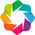

please write %output size=200" before calling this function


:Layout
   .Image.I                           :Image   [x,y]   (z)
   .DynamicMap.All_1585546_homologies :DynamicMap   []
      :RGB   [x,y]   (R,G,B,A)

In [78]:
cub.working_homoset.plot_all(With='tsne',perplexity=100, interactive=True, iteration=500,
                         bins=400,offset=10,redo=True, bypasstsne=True,inpar=True)


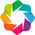

please write %output size=200" before calling this function


/home/ec2-user/miniconda2/envs/cub/lib/python2.7/site-packages/holoviews/operation/datashader.py:358: FutureWarning: xarray.DataArray.__contains__ currently checks membership in DataArray.coords, but in xarray v0.11 will change to check membership in array values.
  if 'x_axis' in agg and 'y_axis' in agg:
/home/ec2-user/miniconda2/envs/cub/lib/python2.7/site-packages/bokeh/io/saving.py:125: UserWarning: save() called but no resources were supplied and output_file(...) was never called, defaulting to resources.CDN
  warn("save() called but no resources were supplied and output_file(...) was never called, defaulting to resources.CDN")
/home/ec2-user/miniconda2/envs/cub/lib/python2.7/site-packages/bokeh/io/saving.py:138: UserWarning: save() called but no title was supplied and output_file(...) was never called, using default title 'Bokeh Plot'
  warn("save() called but no title was supplied and output_file(...) was never called, using default title 'Bokeh Plot'")


:Layout
   .Image.I                           :Image   [x,y]   (z)
   .DynamicMap.All_1585546_homologies :DynamicMap   []
      :RGB   [x,y]   (R,G,B,A)

In [17]:
cub.working_homoset.plot_all(With='tsne',perplexity=60, interactive=True, iteration=1000,
                         bins=400,offset=10,redo=True, bypasstsne=True,inpar=True)

homo_namelist[810:816] what we can see here is that there is some interesting things. first, even if some homologies can be spread out, some of them are grouped pretty well hinting on some factors related to translation. Many things may be able to explain that and it is not so much the mean entropy or length, more complex factors thus have to explain that.

homo_namelist[810:816] Another look here shows that one of the homologies (the only secreted one) has an extremelly high CUB, there may be an explanation as it is an highly expressed excreted protein. this might lead to such an important information gain and might be further tested in the following plots

In [117]:
cub.get_subset(homoset = cub.all_homoset, withcopy=True, clusternb=None, species=None,
               homologies=cub.all_homoset.homo_namelist[810:816]).plot_all(
    With='tsne', perplexity=100, bypasstsne=False, dotsize=5, inpar=False,
                                         interactive=True, iteration=800)

loaded
loaded
[t-SNE] Computing 91 nearest neighbors...
[t-SNE] Indexed 3130 samples in 0.013s...
[t-SNE] Computed neighbors for 3130 samples in 0.227s...
[t-SNE] Computed conditional probabilities for sample 1000 / 3130
[t-SNE] Computed conditional probabilities for sample 2000 / 3130
[t-SNE] Computed conditional probabilities for sample 3000 / 3130
[t-SNE] Computed conditional probabilities for sample 3130 / 3130
[t-SNE] Mean sigma: 4.104473
[t-SNE] Computed conditional probabilities in 0.174s
[t-SNE] Iteration 50: error = 80.3192291, gradient norm = 0.0647185 (50 iterations in 3.055s)
[t-SNE] Iteration 100: error = 75.5522232, gradient norm = 0.0020118 (50 iterations in 2.349s)
[t-SNE] Iteration 150: error = 75.4348602, gradient norm = 0.0005122 (50 iterations in 2.222s)
[t-SNE] Iteration 200: error = 75.4213791, gradient norm = 0.0002413 (50 iterations in 2.187s)
[t-SNE] Iteration 250: error = 75.4163666, gradient norm = 0.0000696 (50 iterations in 2.169s)
[t-SNE] KL divergence aft

Loading BokehJS ...

To get deeper into this question, let's load more information about the homologies and species.. We will then plot the information for each species and see if there is a link to one of the many possible driver of CUB

In [4]:
cub.import_metadataTobias()

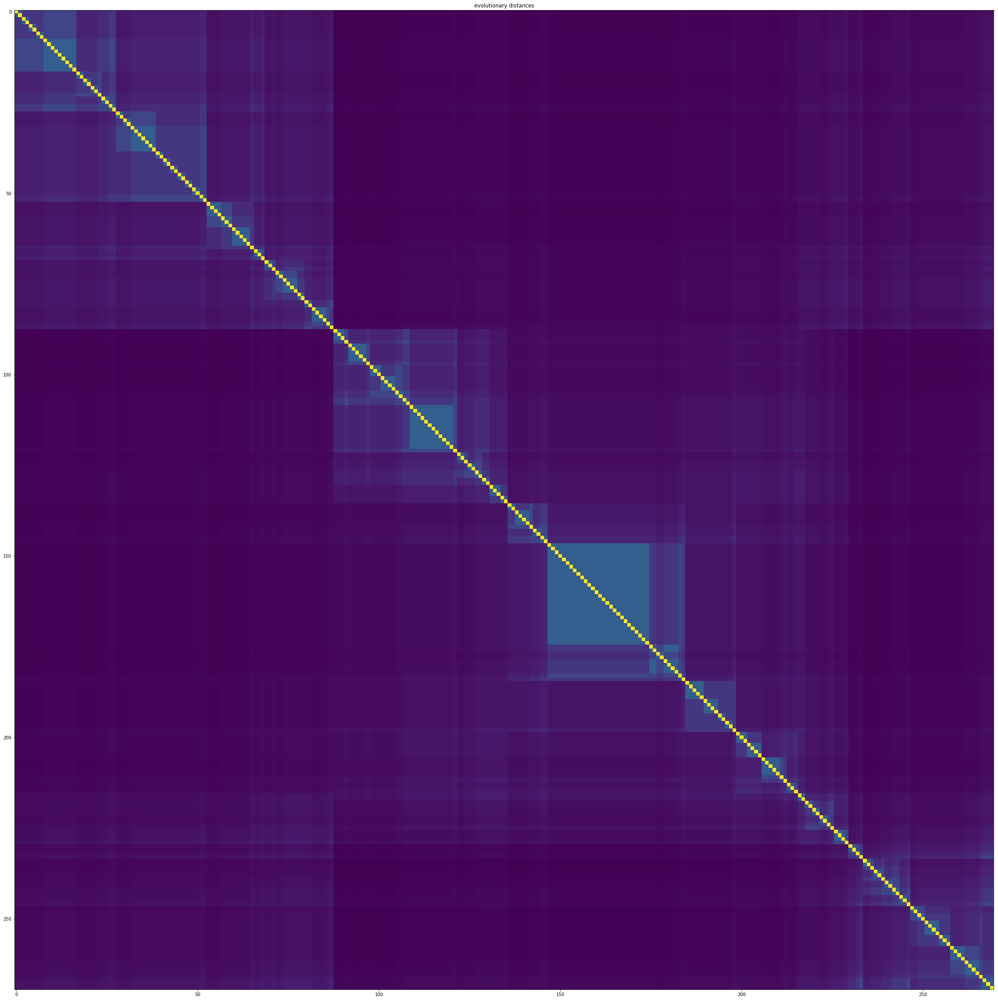

In [83]:
cub.get_evolutionary_distance(display_tree=False, size=40)

In [84]:
cub.loadspeciestable()

it worked !


we can see here that there is a strongcorrelation of the entropy to the number of synonimous codons, however, it is not enough to be able to classify it (for example PRO(14,4 codons) is less informative than LYS(12, 2 codons)

Moreover, you can see it has been decided not to normalize the vectors. this is because we are never comparing the values of the vector to any other values for classifying or clustering etc.. 
We are only using the vectors. and we might want to compare the different values within the vectors, different vectors among homologies or different vectors among different hmologies etc. rescaling the vectors within themselves would not change a thing in comparing the different values since we would still have the same disrepency between different dimensions and we would not be able to compare different vectors, rescaling all the vectors from within an homology would prevent us from comparing different vectors together.. etc. not rescaling here seems to be the better option (for any other variable in the regression step we preprocess and normalize all of them.

In [89]:
cub.compute_averages(homoset=cub.all_homoset)

homology averages : [  8.68638617  11.44008121   3.69279508   2.83567324   0.9880187
   3.1187974    5.32022678   8.73590236   1.59938681  11.03455433
  23.09208013   7.26301611   3.29449365   5.21265947   7.64329209
   5.62999448   2.62413005  10.08740471]


In [7]:
#cub.compute_age(homoset=cub.all_homoset)
cub.all_homoset.compute_ages(preserved=True, minpreserv=0.9, minsimi=0.85)

In [126]:
print cub.all_homoset['YMR186W']


homology: YMR186W
size: 550
fullmax: 95.030388428
var: [  95.27018358   64.0558798    28.77263303   39.97858985    0.60478574
   26.22099706  380.76446341   39.49440197    3.86260229   78.66340124
  290.91663999  257.0192746    36.23927396   40.34022531  122.87893448
  100.83216627   12.61892141   70.24443896]
mean: [ 18.2098458   16.90886703  10.07872097   5.33678356   0.48330023
   6.84888559  28.51495954  15.52612261   2.98357867  22.34445412
  39.59356623  32.93171482   8.94501112  10.16085624  22.35686529
  19.95389706   5.72739935  19.77422222]
metrics: {}
nans mean: 0.154545454545
lengths mean/var: 663.372727273, 151.73919366
doublon sum: 54
GCcount mean/var: 0.511269728852, 0.0720579496983
KaKs_Scores: None
isrecent: False
ishighpreserved: False
ref: None
refprot: YMR186W
refgene: YMR186W
ecai mean/var: 0.49489271782, 0.0974550502757
cai mean/var: 0.589823682579, 0.0972128372504
protein_abundance: 218787
weight: 80899
conservation: 5.13216885007
mRNA_abundance: 6.4
cys_element

In [111]:
print cub.all_homoset[801]


homology: YHR128W
fullmax: 32.4567085966
var: [  4.1607425   12.03762035   1.14677029   1.69216869   0.5702097
   1.75303178   4.93119341  13.67108283   0.30532552   8.86113893
  26.33032304   3.19961673   0.85344175   4.88097012   2.75187593
   3.61852249   0.85490468   5.28349231]
mean: [ 2.40239371  4.51020741  0.81260334  0.92579017  0.67099585  1.05231971
  1.70575726  4.37651959  0.42909779  4.29032331  7.00265521  1.6641157
  0.74382017  2.84859805  2.6618517   2.22264872  0.69698803  3.30109369]
metrics: {}
nans mean: 0.0229645093946
lengths mean/var: 6065.5, 2525.16046245
doublon sum: 16
GCcount mean/var: 0.505510244277, 0.0627253130646
KaKs_Scores: None
isrecent: False
ishighpreserved: False
ref: None
refprot: YHR128W
refgene: YHR128W
ecai mean/var: 0.621852533292, 0.0577606396399
cai mean/var: 0.614387123884, 0.0779606797387
protein_abundance: 0.0
weight: 24594
conservation: 5.34881516588
mRNA_abundance: 3.4
cys_elements: 0
is_secreted: False
decay_rate: nan
tot_volume: 295

In [120]:
print cub.all_homoset[802]


homology: YOR297C
fullmax: 43.5432941006
var: [ 10.96460942   4.29755003   1.13009224   0.63491206   0.17237484
   1.25950555   1.03162661   4.47726338   1.40486144   3.86767169
  16.41903434   1.56872879   2.1480799    5.42550846   4.32461948
   5.26668312   0.85433436   5.42389852]
mean: [ 4.279632    3.22583531  1.00391296  0.73858249  0.35496674  0.97450588
  1.04423087  3.08011196  1.19291053  3.1351994   7.41547671  1.48005114
  1.40220407  3.31813297  3.44347953  2.98631148  0.92540515  3.45304384]
metrics: {}
nans mean: 0.18253968254
lengths mean/var: 172.898809524, 34.3271445903
doublon sum: 34
GCcount mean/var: 0.556023220506, 0.0840633998413
KaKs_Scores: None
isrecent: False
ishighpreserved: False
ref: None
refprot: YOR297C
refgene: YOR297C
ecai mean/var: 0.519472598174, 0.0729469295626
cai mean/var: 0.590277667669, 0.0842148560574
protein_abundance: 3732.0
weight: 21900
conservation: 5.17419354839
mRNA_abundance: 0.8
cys_elements: 0
is_secreted: False
decay_rate: 0.000891


Even if the entropy has to and is sometimes correlated with the length of the vectors and the number of codons, there is much stronger correlation to other factors as we can see.

In [125]:
print cub.all_homoset[803]


homology: YDR225W
fullmax: 23.8531289234
var: [  1.04700978e+01   8.10789376e+00   2.04681876e+00   3.04760793e-01
   1.34888838e-02   1.36440269e+00   1.69349523e+00   1.23835541e+01
   4.77453249e-01   1.30471793e+00   1.87444623e+01   5.71927940e+00
   8.53043729e-02   2.13992995e+00   4.76452481e+00   1.01585471e+00
   3.27095330e-01   2.43238696e+00]
mean: [ 5.73543746  6.37423993  2.10950521  0.39222762  0.47943441  1.27108448
  1.3727308   6.84953834  0.63811475  2.35097875  7.93915948  3.24203285
  0.11309867  2.39074953  3.52141456  1.12005007  0.5817396   3.04990592]
metrics: {}
nans mean: 1.00142653352
lengths mean/var: 134.47360913, 16.4361368061
doublon sum: 239
GCcount mean/var: 0.546242446349, 0.066250047352
KaKs_Scores: None
isrecent: False
ishighpreserved: True
ref: None
refprot: YDR225W
refgene: YDR225W
ecai mean/var: 0.697564114583, 0.0521969540319
cai mean/var: 0.615058650329, 0.100460275464
protein_abundance: 54475.0
weight: 13989
conservation: 5.31526717557
mRNA_

In [122]:
print cub.all_homoset[804]


homology: YIL101C
fullmax: 54.2528235449
var: [ 12.70443232  24.53553302  11.31956641   4.26962965   0.81744691
   5.41901108   4.69823105   9.13830036   2.17555433   8.30910355
  37.24422078   6.00312011   2.4394953   19.78828789  31.47122776
   9.36325869   3.56131332   6.06986971]
mean: [ 3.28775727  5.66770039  1.57519691  1.49549857  0.64210838  1.36855579
  1.30938285  3.24867562  0.9050903   3.37232203  6.94064742  1.89706345
  1.08899251  3.79294262  5.90857522  3.06867687  1.3231903   3.12115915]
metrics: {}
nans mean: 0.053488372093
lengths mean/var: 450.376744186, 159.217015623
doublon sum: 24
GCcount mean/var: 0.530290387033, 0.0628666367908
KaKs_Scores: None
isrecent: False
ishighpreserved: False
ref: None
refprot: YIL101C
refgene: YIL101C
ecai mean/var: 0.644147743413, 0.0299815078279
cai mean/var: 0.609471494521, 0.0644030165209
protein_abundance: 164.0
weight: 72687
conservation: 4.85441640379
mRNA_abundance: 0.4
cys_elements: 0
is_secreted: False
decay_rate: 0.036481


A lot tend to point out that the two distribution all_homoset and working are the same and thus removing the 1/2 homologies that are underrepresented does not skew or bias the distribution.

In [34]:
cub.all_homoset.homo_matrix.max(0)

array([ 315.11608917,  327.41540819,  160.0414408 ,  487.89411216,
         52.94063673,  167.46844147,  179.16199446,  355.80320172,
         83.20523309,  174.17504316,  703.43954027,  163.36772378,
        135.52066175,  407.63142791,  317.63055617,  263.0384299 ,
         92.81086287,  349.44444376])

In [40]:
cub.all_homoset.homo_matrix.mean(0)

array([  5.94535188,   7.55111827,   2.21075474,   2.11802318,
         0.74706038,   1.99656174,   3.07157284,   6.80222758,
         1.17308691,   5.8847418 ,  12.63998386,   4.18494766,
         1.99909645,   3.98521084,   6.06791147,   4.28587105,
         1.6369395 ,   6.39921517])

In [41]:
cub.all_homoset.homo_matrix.var(0)**(0.5)

array([  7.65164553,   8.51687922,   3.58228369,   3.8571531 ,
         1.16062417,   3.38140755,   5.18205945,   8.31587079,
         1.85351603,   6.52986744,  13.64420273,   6.37602431,
         3.04094619,   5.04495174,   6.78347536,   5.14261895,
         2.53622075,   7.12209085])

all the highest entropy are in the working homoset and it seems that the mean is slightly higher for it

In [42]:
cub.working_homoset.homo_matrix.max(0)

array([ 315.11608917,  327.41540819,  160.0414408 ,  487.89411216,
         52.94063673,  167.46844147,  179.16199446,  312.53081164,
         73.69609675,  174.17504316,  703.43954027,  163.36772378,
        135.52066175,  407.63142791,  317.63055617,  170.11689243,
         92.81086287,  349.44444376])

In [43]:
cub.working_homoset.homo_matrix.mean(0)

array([  5.97628942,   7.70757895,   2.22471043,   2.13199829,
         0.74290188,   2.01099741,   3.17823769,   6.85060898,
         1.19385793,   5.96524715,  12.82902082,   4.46611862,
         2.00879056,   3.99377676,   6.03202785,   4.25497258,
         1.65132861,   6.49788342])

In [44]:
cub.working_homoset.homo_matrix.var(0)**(0.5)

array([  7.67603982,   8.76717122,   3.57895547,   3.92763532,
         1.15799442,   3.40407144,   5.348315  ,   8.26130029,
         1.88114428,   6.61396437,  13.98781425,   6.66422731,
         3.02849258,   5.05068292,   6.70552172,   5.01830508,
         2.55054707,   7.22239885])

Here we do for both homoset and we will see if anything interesting comes out.

Even if the clustering values are not the same, we can still see that for both 6-10 were the best ones.
the silhouette clustering seems to be showing that clusters are overlapping often but it is not too bad and it is even good for some, with values around .4-.6. it is interesting to see that except for small secondary cluster, most of the cluster do not cluster according to phylogenetic distances, meaning that only certain groups of very similar species have their entropy values that are highly similar as well. It could be reasonable in the framework of the Mutation-selection-drift balance that such genes are not the highly expressed ones 

epoch: 29                            

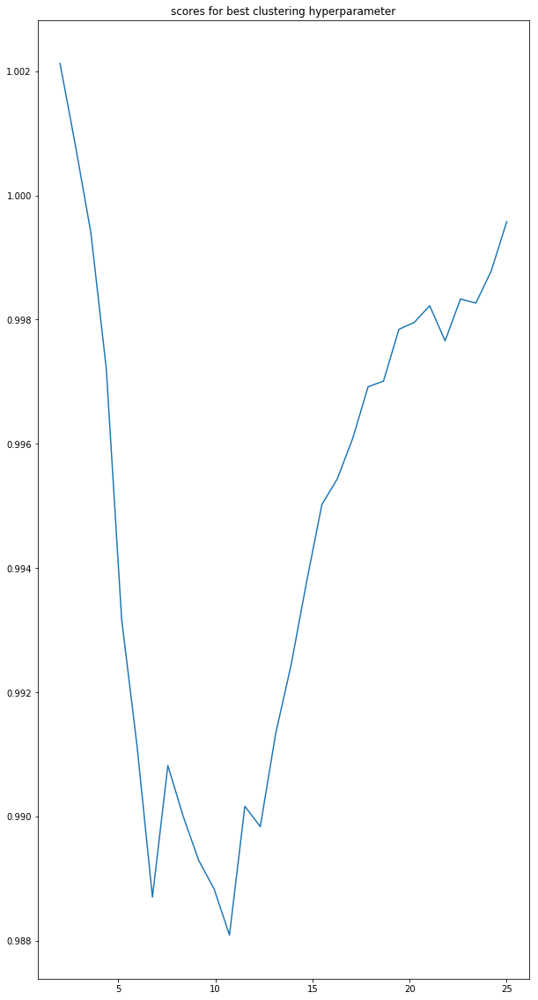

 the best value is : 10.724137931
YGR097W
Estimated number of clusters using DBscan: 1
silhouette_score 0.401085594953
cal_hara 118.016393267
avg phylo dist of the clusters: [ 1.0916775   0.94346392]
-----------------------------
YJL200C
Estimated number of clusters using DBscan: 1
silhouette_score 0.40456842768
cal_hara 277.157561814
avg phylo dist of the clusters: [ 0.9890002   0.99921929]
-----------------------------
YDR348C
Estimated number of clusters using DBscan: 1
silhouette_score 0.416022524522
cal_hara 104.672465295
avg phylo dist of the clusters: [ 0.93260946  1.00974347]
-----------------------------
YPL183C
Estimated number of clusters using DBscan: 1
silhouette_score 0.401406262626
cal_hara 206.974860539
avg phylo dist of the clusters: [ 0.9829956   0.99531379]
-----------------------------
YEL015W
Estimated number of clusters using DBscan: 1
silhouette_score 0.381190137149
cal_hara 147.86138082
avg phylo dist of the clusters: [ 1.0272194   0.98115412]
------------------

avg phylo dist of the clusters: [ 0.97800683  0.99494395]
-----------------------------
YPR062W
Estimated number of clusters using DBscan: 1
silhouette_score 0.481992645181
cal_hara 11.1867392563
avg phylo dist of the clusters: [ 0.9975744]
-----------------------------
YDR402C
Estimated number of clusters using DBscan: 1
silhouette_score 0.476155454775
cal_hara 240.042868464
avg phylo dist of the clusters: [ 1.06678846  0.98530157]
-----------------------------
YMR244W
Estimated number of clusters using DBscan: 2
silhouette_score 0.238218767776
cal_hara 64.0931805444
avg phylo dist of the clusters: [ 0.99586946  0.97031232  0.66058608]
-----------------------------
YOR365C
Estimated number of clusters using DBscan: 3
silhouette_score -0.0573809274982
cal_hara 59.7532715116
avg phylo dist of the clusters: [ 0.98787388  1.00104362  1.16116966  1.16116966]
-----------------------------
YGR210C
Estimated number of clusters using DBscan: 3
silhouette_score 0.261270277764
cal_hara 81.960576

avg phylo dist of the clusters: [ 1.00698223  0.99478988]
-----------------------------
YNL320W
Estimated number of clusters using DBscan: 1
silhouette_score 0.505062361487
cal_hara 57.6960983612
avg phylo dist of the clusters: [ 0.85915903  1.00318856]
-----------------------------
YNL268W
Estimated number of clusters using DBscan: 4
silhouette_score 0.0115797502782
cal_hara 45.5381430961
avg phylo dist of the clusters: [ 0.98030763  1.00096763  1.20544688  0.83454015  0.37090673]
-----------------------------
YIL105C
Estimated number of clusters using DBscan: 1
silhouette_score 0.358119467718
cal_hara 125.22879224
avg phylo dist of the clusters: [ 1.05665246  0.95436423]
-----------------------------
YDR403W
Estimated number of clusters using DBscan: 1
silhouette_score 0.43638532667
cal_hara 206.308799752
avg phylo dist of the clusters: [ 0.988703    1.01109453]
-----------------------------
YCL026C-B
Estimated number of clusters using DBscan: 1
silhouette_score 0.32435589723
cal_har

avg phylo dist of the clusters: [ 0.94591636  1.00727501]
-----------------------------
YFL055W
Estimated number of clusters using DBscan: 1
silhouette_score 0.34305433423
cal_hara 193.109760679
avg phylo dist of the clusters: [ 1.0277863   1.00878867]
-----------------------------
YDR428C
Estimated number of clusters using DBscan: 2
silhouette_score 0.445328620412
cal_hara 74.3747848758
avg phylo dist of the clusters: [ 1.10561464  0.98539156]
-----------------------------
YMR265C
Estimated number of clusters using DBscan: 1
silhouette_score 0.444725821591
cal_hara 174.895435684
avg phylo dist of the clusters: [ 0.9499201   1.00196271]
-----------------------------
YIL162W
Estimated number of clusters using DBscan: 1
silhouette_score 0.414068614006
cal_hara 213.060856512
avg phylo dist of the clusters: [ 0.97028885  1.00306145]
-----------------------------
YLR382C
Estimated number of clusters using DBscan: 1
silhouette_score 0.282099216443
cal_hara 123.693526448
avg phylo dist of the

avg phylo dist of the clusters: [ 1.10397481  0.99105122]
-----------------------------
YNL194C
Estimated number of clusters using DBscan: 1
silhouette_score 0.444473386655
cal_hara 81.5802518614
avg phylo dist of the clusters: [ 1.00767832  0.99679178]
-----------------------------
YNR072W
Estimated number of clusters using DBscan: 4
silhouette_score 0.0553656971213
cal_hara 111.29843909
avg phylo dist of the clusters: [ 0.97594717  1.01145179  0.28487852  0.9021153   1.15307971]
-----------------------------
YPL009C
Estimated number of clusters using DBscan: 1
silhouette_score 0.269852964288
cal_hara 153.444260287
avg phylo dist of the clusters: [ 1.01471667  0.93213655]
-----------------------------
YIR011C
Estimated number of clusters using DBscan: 1
silhouette_score 0.498180921544
cal_hara 75.3356173326
avg phylo dist of the clusters: [ 1.05761978  0.99266466]
-----------------------------
YDR254W
Estimated number of clusters using DBscan: 1
silhouette_score 0.538000417024
cal_har

silhouette_score 0.373605789379
cal_hara 151.121909142
avg phylo dist of the clusters: [ 1.02927114  0.98399727]
-----------------------------
YDL109C
Estimated number of clusters using DBscan: 1
silhouette_score 0.36522163096
cal_hara 160.255845737
avg phylo dist of the clusters: [ 1.01851696  0.98179776]
-----------------------------
YBR054W
Estimated number of clusters using DBscan: 2
silhouette_score 0.16799943848
cal_hara 76.5984809703
avg phylo dist of the clusters: [ 0.88846357  0.99909528  0.176388  ]
-----------------------------
YIL019W
Estimated number of clusters using DBscan: 1
silhouette_score 0.47299805069
cal_hara 140.855310415
avg phylo dist of the clusters: [ 1.02681479  0.97882956]
-----------------------------
YER073W
Estimated number of clusters using DBscan: 1
silhouette_score 0.534845715035
cal_hara 665.805088517
avg phylo dist of the clusters: [ 0.95840296  1.00754213]
-----------------------------
YBR053C
Estimated number of clusters using DBscan: 1
silhouette_

avg phylo dist of the clusters: [ 0.99275073  1.00825487]
-----------------------------
YER050C
Estimated number of clusters using DBscan: 1
silhouette_score 0.488823777679
cal_hara 64.5335485263
avg phylo dist of the clusters: [ 0.85243854  1.00107456]
-----------------------------
YOR155C
Estimated number of clusters using DBscan: 1
silhouette_score 0.498868736472
cal_hara 338.866556674
avg phylo dist of the clusters: [ 1.0239028   0.98725904]
-----------------------------
YDL117W
Estimated number of clusters using DBscan: 1
silhouette_score 0.32920594231
cal_hara 130.113612475
avg phylo dist of the clusters: [ 0.9805847   0.99979727]
-----------------------------
YOL075C
Estimated number of clusters using DBscan: 1
silhouette_score 0.282927341139
cal_hara 160.523554264
avg phylo dist of the clusters: [ 0.97845205  1.01384658]
-----------------------------
YNL141W
Estimated number of clusters using DBscan: 1
silhouette_score 0.383730234342
cal_hara 150.400205547
avg phylo dist of the

silhouette_score 0.246716353578
cal_hara 112.797004271
avg phylo dist of the clusters: [ 0.96435913  0.99040682  1.40458133  0.56183253]
-----------------------------
YML099C
Estimated number of clusters using DBscan: 1
silhouette_score 0.583244167864
cal_hara 223.396716841
avg phylo dist of the clusters: [ 0.96920407  1.01715617]
-----------------------------
YJL159W
Estimated number of clusters using DBscan: 1
silhouette_score 0.294414804499
cal_hara 174.424025731
avg phylo dist of the clusters: [ 1.02560207  0.96127308]
-----------------------------
YEL036C
Estimated number of clusters using DBscan: 1
silhouette_score 0.492967668409
cal_hara 186.284141029
avg phylo dist of the clusters: [ 0.95867332  1.00184519]
-----------------------------
YDR330W
Estimated number of clusters using DBscan: 1
silhouette_score 0.439301605636
cal_hara 139.372787911
avg phylo dist of the clusters: [ 1.03496638  0.98636849]
-----------------------------
YGL077C
Estimated number of clusters using DBscan

avg phylo dist of the clusters: [ 1.018725    0.98885108]
-----------------------------
YNL142W
Estimated number of clusters using DBscan: 2
silhouette_score 0.159589190584
cal_hara 118.018081662
avg phylo dist of the clusters: [ 0.94834498  1.03937542  0.99136466]
-----------------------------
YNR060W
Estimated number of clusters using DBscan: 1
silhouette_score 0.447911454966
cal_hara 443.283146154
avg phylo dist of the clusters: [ 1.01947274  0.99399244]
-----------------------------
YDL101C
Estimated number of clusters using DBscan: 1
silhouette_score 0.419726793596
cal_hara 159.197167313
avg phylo dist of the clusters: [ 0.97644216  0.99674164]
-----------------------------
YGR076C
Estimated number of clusters using DBscan: 1
silhouette_score 0.488968503127
cal_hara 34.0618851848
avg phylo dist of the clusters: [ 0.99757718]
-----------------------------
YNR039C
Estimated number of clusters using DBscan: 1
silhouette_score 0.514815155379
cal_hara 198.404435375
avg phylo dist of th

avg phylo dist of the clusters: [ 0.99852837]
-----------------------------
YML003W
Estimated number of clusters using DBscan: 1
silhouette_score 0.324336083082
cal_hara 137.006703072
avg phylo dist of the clusters: [ 1.04694769  0.96674178]
-----------------------------
YOR089C
Estimated number of clusters using DBscan: 1
silhouette_score 0.52096504825
cal_hara 44.5224386384
avg phylo dist of the clusters: [ 0.82032897  0.99430404]
-----------------------------
YJR036C
Estimated number of clusters using DBscan: 1
silhouette_score 0.407980738823
cal_hara 122.289350336
avg phylo dist of the clusters: [ 1.00888118  0.98239334]
-----------------------------
YDR054C
Estimated number of clusters using DBscan: 1
silhouette_score 0.453027457457
cal_hara 35.9194188427
avg phylo dist of the clusters: [ 1.17667548  0.99660926]
-----------------------------
YMR123W
Estimated number of clusters using DBscan: 1
silhouette_score 0.46845446262
cal_hara 5.40387024541
avg phylo dist of the clusters: [ 

avg phylo dist of the clusters: [ 0.70442167  1.00106227]
-----------------------------
YMR259C
Estimated number of clusters using DBscan: 1
silhouette_score 0.271800463935
cal_hara 147.09410422
avg phylo dist of the clusters: [ 0.99934001  0.95476105]
-----------------------------
YNR001C
Estimated number of clusters using DBscan: 5
silhouette_score -0.131977353859
cal_hara 17.8884415566
avg phylo dist of the clusters: [ 0.99799835  0.88313707  0.1790334   0.98697898  0.82696378  0.55699279]
-----------------------------
YGR100W
Estimated number of clusters using DBscan: 1
silhouette_score 0.26224424096
cal_hara 130.522188617
avg phylo dist of the clusters: [ 0.96444648  1.01584478]
-----------------------------
YOR252W
Estimated number of clusters using DBscan: 1
silhouette_score 0.554072912654
cal_hara 17.477344408
avg phylo dist of the clusters: [ 1.]
-----------------------------
YPR172W
Estimated number of clusters using DBscan: 1
silhouette_score 0.508630739078
cal_hara 48.49897

avg phylo dist of the clusters: [ 1.01434237  0.97618111]
-----------------------------
YLR011W
Estimated number of clusters using DBscan: 1
silhouette_score 0.498236933237
cal_hara 67.4178226416
avg phylo dist of the clusters: [ 0.9341666   0.99851809]
-----------------------------
YMR162C
Estimated number of clusters using DBscan: 2
silhouette_score -0.0869221018563
cal_hara 55.1368669925
avg phylo dist of the clusters: [ 0.99552796  1.00673118  0.697014  ]
-----------------------------
YDR421W
Estimated number of clusters using DBscan: 2
silhouette_score 0.344141628685
cal_hara 196.880957215
avg phylo dist of the clusters: [ 0.98846307  0.98673935  1.13243458]
-----------------------------
YNL084C
Estimated number of clusters using DBscan: 1
silhouette_score 0.398361026555
cal_hara 163.35037071
avg phylo dist of the clusters: [ 0.98745179  0.99950522]
-----------------------------
YKL043W
Estimated number of clusters using DBscan: 1
silhouette_score 0.361401348821
cal_hara 108.97721

Estimated number of clusters using DBscan: 1
silhouette_score 0.198469909583
cal_hara 110.237366242
avg phylo dist of the clusters: [ 1.01393969  0.91080331]
-----------------------------
YOR213C
Estimated number of clusters using DBscan: 1
silhouette_score 0.546249482377
cal_hara 58.5195663609
avg phylo dist of the clusters: [ 1.31875916  0.99543255]
-----------------------------
YDR352W
Estimated number of clusters using DBscan: 1
silhouette_score 0.493485878925
cal_hara 75.8374173833
avg phylo dist of the clusters: [ 1.07543287  0.99983058]
-----------------------------
YLR144C
Estimated number of clusters using DBscan: 2
silhouette_score 0.0834139762365
cal_hara 76.9786101505
avg phylo dist of the clusters: [ 0.98782778  0.99993712  0.36055378]
-----------------------------
YNR071C
Estimated number of clusters using DBscan: 2
silhouette_score 0.293047565924
cal_hara 114.046832862
avg phylo dist of the clusters: [ 0.95537238  0.98322974  0.94839936]
-----------------------------
YPR

silhouette_score 0.465024572597
cal_hara 303.497124291
avg phylo dist of the clusters: [ 1.03565087  0.96811247]
-----------------------------
YNL332W
Estimated number of clusters using DBscan: 2
silhouette_score 0.124679843681
cal_hara 42.9494964727
avg phylo dist of the clusters: [ 0.93558057  1.02980403]
-----------------------------
YBR199W
Estimated number of clusters using DBscan: 1
silhouette_score 0.419615100673
cal_hara 144.12923935
avg phylo dist of the clusters: [ 1.10306732  0.98025869]
-----------------------------
YMR305C
Estimated number of clusters using DBscan: 1
silhouette_score 0.383590056833
cal_hara 201.629540166
avg phylo dist of the clusters: [ 0.92812365  1.03001623]
-----------------------------
YOR273C
Estimated number of clusters using DBscan: 1
silhouette_score 0.542862875115
cal_hara 367.415121779
avg phylo dist of the clusters: [ 0.92347691  1.00776976]
-----------------------------
YMR038C
Estimated number of clusters using DBscan: 1
silhouette_score 0.55

avg phylo dist of the clusters: [ 0.95947374  0.98379384]
-----------------------------
YCR102C
Estimated number of clusters using DBscan: 1
silhouette_score 0.475488468101
cal_hara 194.138909836
avg phylo dist of the clusters: [ 0.89752437  1.00814163]
-----------------------------
YER001W
Estimated number of clusters using DBscan: 1
silhouette_score 0.357331326437
cal_hara 217.08231125
avg phylo dist of the clusters: [ 0.95223002  0.98647247]
-----------------------------
YHL008C
Estimated number of clusters using DBscan: 1
silhouette_score 0.452011540461
cal_hara 101.415496291
avg phylo dist of the clusters: [ 0.93283986  1.01005503]
-----------------------------
YJR111C
Estimated number of clusters using DBscan: 1
silhouette_score 0.610483188442
cal_hara 114.087428607
avg phylo dist of the clusters: [ 1.1136891   0.99933367]
-----------------------------
YGR001C
Estimated number of clusters using DBscan: 1
silhouette_score 0.481619230826
cal_hara 63.2053529571
avg phylo dist of the

avg phylo dist of the clusters: [ 0.99925324]
-----------------------------
YOL141W
Estimated number of clusters using DBscan: 1
silhouette_score 0.458515517405
cal_hara 168.183721505
avg phylo dist of the clusters: [ 0.91779094  1.01571975]
-----------------------------
YPR086W
Estimated number of clusters using DBscan: 1
silhouette_score 0.395896968213
cal_hara 119.60711683
avg phylo dist of the clusters: [ 0.94364358  1.00554778]
-----------------------------
YBR279W
Estimated number of clusters using DBscan: 1
silhouette_score 0.427072401361
cal_hara 174.34221674
avg phylo dist of the clusters: [ 0.96478199  1.00731248]
-----------------------------
YER130C
Estimated number of clusters using DBscan: 1
silhouette_score 0.32396142668
cal_hara 252.285273963
avg phylo dist of the clusters: [ 0.95753787  1.01613289]
-----------------------------
YBR155W
Estimated number of clusters using DBscan: 1
silhouette_score 0.481143259097
cal_hara 290.706765328
avg phylo dist of the clusters: [ 0

avg phylo dist of the clusters: [ 0.9647348   1.00502348  1.2583421 ]
-----------------------------
YPR019W
Estimated number of clusters using DBscan: 2
silhouette_score 0.00638762868776
cal_hara 67.1945057707
avg phylo dist of the clusters: [ 0.99173854  0.977732    0.52834935]
-----------------------------
YPL228W
Estimated number of clusters using DBscan: 1
silhouette_score 0.439698719966
cal_hara 179.356632066
avg phylo dist of the clusters: [ 0.96615688  1.00744635]
-----------------------------
YPR190C
Estimated number of clusters using DBscan: 1
silhouette_score 0.506810842917
cal_hara 285.021566231
avg phylo dist of the clusters: [ 0.90634278  1.01846824]
-----------------------------
YDR353W
Estimated number of clusters using DBscan: 5
silhouette_score 0.136710984835
cal_hara 61.461007748
avg phylo dist of the clusters: [ 0.98392631  0.9907489   0.1687813   0.27005007  0.52509737  0.33756259]
-----------------------------
YOL137W
Estimated number of clusters using DBscan: 1
si

avg phylo dist of the clusters: [ 0.97870036  0.98642832]
-----------------------------
YJL087C
Estimated number of clusters using DBscan: 1
silhouette_score 0.323570206664
cal_hara 215.308124976
avg phylo dist of the clusters: [ 0.94707752  1.03308647]
-----------------------------
YDR043C
Estimated number of clusters using DBscan: 1
silhouette_score 0.5200466347
cal_hara 192.794442286
avg phylo dist of the clusters: [ 0.93004296  1.00441455]
-----------------------------
YFR022W
Estimated number of clusters using DBscan: 1
silhouette_score 0.441837253416
cal_hara 289.085926931
avg phylo dist of the clusters: [ 0.9756305   1.00929135]
-----------------------------
YBL008W
Estimated number of clusters using DBscan: 1
silhouette_score 0.295985245554
cal_hara 172.821503713
avg phylo dist of the clusters: [ 0.96824838  1.00899909]
-----------------------------
YMR178W
Estimated number of clusters using DBscan: 1
silhouette_score 0.470748987852
cal_hara 137.602139942
avg phylo dist of the 

avg phylo dist of the clusters: [ 0.97555947  0.99878494]
-----------------------------
YOR238W
Estimated number of clusters using DBscan: 1
silhouette_score 0.530679482056
cal_hara 125.493974828
avg phylo dist of the clusters: [ 0.98844383  0.99965628]
-----------------------------
YHR032W
Estimated number of clusters using DBscan: 2
silhouette_score 0.220747960164
cal_hara 235.003880978
avg phylo dist of the clusters: [ 0.96420196  1.00733588  0.8649789 ]
-----------------------------
YDR429C
Estimated number of clusters using DBscan: 1
silhouette_score 0.344659834264
cal_hara 90.0346928126
avg phylo dist of the clusters: [ 0.95794884  1.00470334]
-----------------------------
YNR031C
Estimated number of clusters using DBscan: 1
silhouette_score 0.187619556517
cal_hara 136.39623066
avg phylo dist of the clusters: [ 0.97538809  1.02296372]
-----------------------------
YHR084W
Estimated number of clusters using DBscan: 1
silhouette_score 0.354329169481
cal_hara 199.894489555
avg phylo

avg phylo dist of the clusters: [ 0.97877195  1.01627091]
-----------------------------
YNL020C
Estimated number of clusters using DBscan: 1
silhouette_score 0.310375982774
cal_hara 147.108612793
avg phylo dist of the clusters: [ 0.97945356  1.00974457]
-----------------------------
YGL125W
Estimated number of clusters using DBscan: 1
silhouette_score 0.273353335357
cal_hara 192.821395048
avg phylo dist of the clusters: [ 0.96687216  1.01111961]
-----------------------------
YKR038C
Estimated number of clusters using DBscan: 1
silhouette_score 0.487051234573
cal_hara 358.221208395
avg phylo dist of the clusters: [ 0.94503838  1.00842253]
-----------------------------
YDL215C
Estimated number of clusters using DBscan: 1
silhouette_score 0.0689812402511
cal_hara 94.1796381089
avg phylo dist of the clusters: [ 1.00103392  1.00201343]
-----------------------------
YLR354C
Estimated number of clusters using DBscan: 2
silhouette_score 0.175612043803
cal_hara 144.856129167
avg phylo dist of t

avg phylo dist of the clusters: [ 1.]
-----------------------------
YDR293C
Estimated number of clusters using DBscan: 6
silhouette_score -0.272908304186
cal_hara 6.68836989556
avg phylo dist of the clusters: [ 0.98850469  1.0454742   1.07821347  0.61409527  1.07821347  0.34048846]
-----------------------------
YNR015W
Estimated number of clusters using DBscan: 3
silhouette_score 0.219870763169
cal_hara 75.549521101
avg phylo dist of the clusters: [ 0.94083963  1.01634923  1.08799337  1.20251898]
-----------------------------
YKL006W
Estimated number of clusters using DBscan: 1
silhouette_score 0
cal_hara 0
avg phylo dist of the clusters: [ 1.]
-----------------------------
YDR448W
Estimated number of clusters using DBscan: 1
silhouette_score 0.453438313792
cal_hara 210.354471601
avg phylo dist of the clusters: [ 0.93096245  0.99937929]
-----------------------------
YDR097C
Estimated number of clusters using DBscan: 1
silhouette_score 0.175669758344
cal_hara 130.95728222
avg phylo dist

avg phylo dist of the clusters: [ 0.93858613  1.0062825 ]
-----------------------------
YBL036C
Estimated number of clusters using DBscan: 1
silhouette_score 0.51636452257
cal_hara 135.202445798
avg phylo dist of the clusters: [ 0.86474025  1.00193592]
-----------------------------
YOL147C
Estimated number of clusters using DBscan: 1
silhouette_score 0.460377612639
cal_hara 165.491244998
avg phylo dist of the clusters: [ 0.99163933  0.99980896]
-----------------------------
YPR178W
Estimated number of clusters using DBscan: 1
silhouette_score 0.492571222093
cal_hara 244.454889959
avg phylo dist of the clusters: [ 0.93692713  1.00421808]
-----------------------------
YNL069C
Estimated number of clusters using DBscan: 1
silhouette_score 0.266859086099
cal_hara 5.221868543
avg phylo dist of the clusters: [ 1.07288786  1.00004383]
-----------------------------
YIL118W
Estimated number of clusters using DBscan: 1
silhouette_score 0.585477381932
cal_hara 79.6599224824
avg phylo dist of the c

avg phylo dist of the clusters: [ 0.9922931   0.99595776]
-----------------------------
YNL277W
Estimated number of clusters using DBscan: 1
silhouette_score 0.401137834675
cal_hara 248.480315644
avg phylo dist of the clusters: [ 0.97610292  1.01055833]
-----------------------------
YDL014W
Estimated number of clusters using DBscan: 1
silhouette_score 0.249459749459
cal_hara 123.69390067
avg phylo dist of the clusters: [ 0.96545294  1.00997647]
-----------------------------
YCL064C
Estimated number of clusters using DBscan: 1
silhouette_score 0.449559139051
cal_hara 276.852777493
avg phylo dist of the clusters: [ 0.99519949  0.99559374]
-----------------------------
YLR345W
Estimated number of clusters using DBscan: 1
silhouette_score 0.426347477324
cal_hara 228.357897575
avg phylo dist of the clusters: [ 0.96868038  1.01342087]
-----------------------------
YGL022W
Estimated number of clusters using DBscan: 2
silhouette_score 0.0240606866828
cal_hara 64.0647853698
avg phylo dist of th

silhouette_score 0.405364678422
cal_hara 217.160695731
avg phylo dist of the clusters: [ 0.94975677  1.01093182]
-----------------------------
YDR525W-A
Estimated number of clusters using DBscan: 1
silhouette_score 0.603924526698
cal_hara 12.342414361
avg phylo dist of the clusters: [ 0.99933616]
-----------------------------
YGL229C
Estimated number of clusters using DBscan: 2
silhouette_score 0.131621844854
cal_hara 78.236413152
avg phylo dist of the clusters: [ 0.96622526  1.01212366  1.11860356]
-----------------------------
YOL005C
Estimated number of clusters using DBscan: 1
silhouette_score 0
cal_hara 0
avg phylo dist of the clusters: [ 1.]
-----------------------------
YML064C
Estimated number of clusters using DBscan: 1
silhouette_score 0.524430424863
cal_hara 127.929794275
avg phylo dist of the clusters: [ 0.95787309  1.00406966]
-----------------------------
YPR176C
Estimated number of clusters using DBscan: 1
silhouette_score 0.523730710513
cal_hara 181.002907036
avg phylo 

avg phylo dist of the clusters: [ 0.98035467  1.01419033  1.20268865]
-----------------------------
YKL132C
Estimated number of clusters using DBscan: 2
silhouette_score 0.446570933391
cal_hara 144.88825569
avg phylo dist of the clusters: [ 0.95056507  1.00777731  0.3459735 ]
-----------------------------
YPL222W
Estimated number of clusters using DBscan: 2
silhouette_score 0.214760740334
cal_hara 152.015442147
avg phylo dist of the clusters: [ 0.94687163  1.02411886  0.94596531]
-----------------------------
YKL012W
Estimated number of clusters using DBscan: 1
silhouette_score 0.351806771581
cal_hara 153.456388446
avg phylo dist of the clusters: [ 0.93982672  1.0115477 ]
-----------------------------
YHR141C
Estimated number of clusters using DBscan: 1
silhouette_score 0.545791243887
cal_hara 8.03955282093
avg phylo dist of the clusters: [ 1.00038356]
-----------------------------
YAL041W
Estimated number of clusters using DBscan: 1
silhouette_score 0.253206903002
cal_hara 169.4839029

avg phylo dist of the clusters: [ 0.99882238]
-----------------------------
YLL050C
Estimated number of clusters using DBscan: 1
silhouette_score 0.513479041727
cal_hara 11.9356304604
avg phylo dist of the clusters: [ 1.19769159  1.00100684]
-----------------------------
YML035C
Estimated number of clusters using DBscan: 1
silhouette_score 0.358154020512
cal_hara 257.068614796
avg phylo dist of the clusters: [ 0.95629651  1.02338401]
-----------------------------
YDR006C
Estimated number of clusters using DBscan: 1
silhouette_score 0.365350843216
cal_hara 214.982164946
avg phylo dist of the clusters: [ 0.95486191  1.01606694]
-----------------------------
YNL256W
Estimated number of clusters using DBscan: 1
silhouette_score 0.425415634498
cal_hara 279.967438355
avg phylo dist of the clusters: [ 0.97362037  1.00577245]
-----------------------------
YML100W
Estimated number of clusters using DBscan: 1
silhouette_score 0.22246335938
cal_hara 189.149781042
avg phylo dist of the clusters: [

avg phylo dist of the clusters: [ 0.93973069  1.00275268]
-----------------------------
YOR335C
Estimated number of clusters using DBscan: 4
silhouette_score -0.0494209422315
cal_hara 44.7641999504
avg phylo dist of the clusters: [ 0.98664924  0.9632306   0.33903749  0.56506248  1.02619383]
-----------------------------
YGL059W
Estimated number of clusters using DBscan: 1
silhouette_score 0.498806028308
cal_hara 343.957198235
avg phylo dist of the clusters: [ 0.97596939  1.00534186]
-----------------------------
YNL087W
Estimated number of clusters using DBscan: 4
silhouette_score -0.242740830807
cal_hara 16.967035636
avg phylo dist of the clusters: [ 0.98893299  0.95482254  1.08789748  1.37418629]
-----------------------------
YJL177W
Estimated number of clusters using DBscan: 1
silhouette_score 0.350405145024
cal_hara 4.41412542976
avg phylo dist of the clusters: [ 1.35572983  0.99922333]
-----------------------------
YDR502C
Estimated number of clusters using DBscan: 6
silhouette_sc

silhouette_score 0.251946159818
cal_hara 121.60046882
avg phylo dist of the clusters: [ 0.97590326  0.99926394  0.34358747]
-----------------------------
YJL059W
Estimated number of clusters using DBscan: 2
silhouette_score 0.35452633031
cal_hara 213.910636587
avg phylo dist of the clusters: [ 0.98381443  1.0009027   0.31094687]
-----------------------------
YEL044W
Estimated number of clusters using DBscan: 1
silhouette_score 0.593215407169
cal_hara 55.1059375125
avg phylo dist of the clusters: [ 1.208849    0.99837093]
-----------------------------
YBL051C
Estimated number of clusters using DBscan: 3
silhouette_score 0.066037364518
cal_hara 56.6344070666
avg phylo dist of the clusters: [ 0.93648284  1.01291658  0.83163073  1.2072059 ]
-----------------------------
YOR351C
Estimated number of clusters using DBscan: 1
silhouette_score 0.561771030248
cal_hara 122.341321032
avg phylo dist of the clusters: [ 0.95234458  1.00485817]
-----------------------------
YJR068W
Estimated number of

avg phylo dist of the clusters: [ 0.980858    1.01789285]
-----------------------------
YGR181W
Estimated number of clusters using DBscan: 1
silhouette_score 0
cal_hara 0
avg phylo dist of the clusters: [ 1.]
-----------------------------
YPL029W
Estimated number of clusters using DBscan: 1
silhouette_score 0.433720425797
cal_hara 270.574402959
avg phylo dist of the clusters: [ 0.94060909  1.01452789]
-----------------------------
YER007C-A
Estimated number of clusters using DBscan: 1
silhouette_score 0.441959711959
cal_hara 22.7004364197
avg phylo dist of the clusters: [ 0.91170976  1.00189229]
-----------------------------
YLR116W
Estimated number of clusters using DBscan: 2
silhouette_score 0.137340914262
cal_hara 39.2826949177
avg phylo dist of the clusters: [ 0.94613532  1.00067261  0.2855697 ]
-----------------------------
YJR144W
Estimated number of clusters using DBscan: 1
silhouette_score 0.440375982132
cal_hara 96.0763674434
avg phylo dist of the clusters: [ 0.96550146  1.002

Estimated number of clusters using DBscan: 1
silhouette_score 0.521463288727
cal_hara 239.128539043
avg phylo dist of the clusters: [ 0.92250706  1.01030774]
-----------------------------
YGL174W
Estimated number of clusters using DBscan: 2
silhouette_score 0.531541212164
cal_hara 124.489483693
avg phylo dist of the clusters: [ 0.95566793  1.00350497  1.28774603]
-----------------------------
YGR145W
Estimated number of clusters using DBscan: 1
silhouette_score 0.325784185967
cal_hara 217.048791178
avg phylo dist of the clusters: [ 0.96853962  1.01153292]
-----------------------------
YDR061W
Estimated number of clusters using DBscan: 1
silhouette_score 0.426362938477
cal_hara 275.469846929
avg phylo dist of the clusters: [ 0.96671201  1.00702328]
-----------------------------
YGR199W
Estimated number of clusters using DBscan: 4
silhouette_score 0.0427786654432
cal_hara 64.8315893646
avg phylo dist of the clusters: [ 0.95375525  1.0160265   1.06708948  0.34422241]
---------------------

avg phylo dist of the clusters: [ 0.93680989  1.00465632  0.53301958]
-----------------------------
YHR177W
Estimated number of clusters using DBscan: 1
silhouette_score 0.493930797307
cal_hara 200.609135351
avg phylo dist of the clusters: [ 0.95144267  1.01249719]
-----------------------------
YIR027C
Estimated number of clusters using DBscan: 1
silhouette_score 0.351848490385
cal_hara 215.543407552
avg phylo dist of the clusters: [ 0.94198386  0.99723448]
-----------------------------
YAL042W
Estimated number of clusters using DBscan: 2
silhouette_score 0.208078553388
cal_hara 105.758879524
avg phylo dist of the clusters: [ 0.96163582  1.01618256  0.62534547]
-----------------------------
YIL007C
Estimated number of clusters using DBscan: 1
silhouette_score 0.59686081521
cal_hara 68.0939291541
avg phylo dist of the clusters: [ 0.96060613  1.00282346]
-----------------------------
YPR036W
Estimated number of clusters using DBscan: 1
silhouette_score 0.433570521597
cal_hara 300.4685033

avg phylo dist of the clusters: [ 0.94653761  1.00998417]
-----------------------------
YDR435C
Estimated number of clusters using DBscan: 1
silhouette_score 0.536245232722
cal_hara 186.325199762
avg phylo dist of the clusters: [ 0.91653849  1.00676218]
-----------------------------
YNL161W
Estimated number of clusters using DBscan: 1
silhouette_score 0.255321361083
cal_hara 158.109216063
avg phylo dist of the clusters: [ 0.95334926  1.0178065 ]
-----------------------------
YDL052C
Estimated number of clusters using DBscan: 1
silhouette_score 0.443037562368
cal_hara 267.185498372
avg phylo dist of the clusters: [ 0.97279165  1.00063701]
-----------------------------
YFR031C
Estimated number of clusters using DBscan: 3
silhouette_score -0.0813033843157
cal_hara 48.0658761117
avg phylo dist of the clusters: [ 0.98100013  1.00717035  0.65877078  1.2067203 ]
-----------------------------
YBR084C-A
Estimated number of clusters using DBscan: 1
silhouette_score 0.264354196399
cal_hara 4.3395

avg phylo dist of the clusters: [ 0.9730954   1.00418075]
-----------------------------
YPL093W
Estimated number of clusters using DBscan: 4
silhouette_score -0.0487214792487
cal_hara 50.6919024929
avg phylo dist of the clusters: [ 0.98196236  0.97553067  0.20342946  0.56508183  1.01714729]
-----------------------------
YJR034W
Estimated number of clusters using DBscan: 1
silhouette_score 0
cal_hara 0
avg phylo dist of the clusters: [ 1.]
-----------------------------
YPL160W
Estimated number of clusters using DBscan: 2
silhouette_score -0.0959276578463
cal_hara 44.8066453178
avg phylo dist of the clusters: [ 1.00135899  0.95223891  1.06611989]
-----------------------------
YDR456W
Estimated number of clusters using DBscan: 1
silhouette_score 0.360268706436
cal_hara 225.798656081
avg phylo dist of the clusters: [ 0.96448612  1.01533419]
-----------------------------
YGL190C
Estimated number of clusters using DBscan: 1
silhouette_score 0.441798219189
cal_hara 182.218185905
avg phylo dis

avg phylo dist of the clusters: [ 0.9543426   1.00591101]
-----------------------------
YFR040W
Estimated number of clusters using DBscan: 2
silhouette_score 0.13204566998
cal_hara 82.9318904559
avg phylo dist of the clusters: [ 0.97557658  1.01198543  1.11867124]
-----------------------------
YBR021W
Estimated number of clusters using DBscan: 2
silhouette_score 0.169591795442
cal_hara 132.237052762
avg phylo dist of the clusters: [ 0.95744945  1.01252276  0.97194032]
-----------------------------
YML021C
Estimated number of clusters using DBscan: 1
silhouette_score 0.461071346558
cal_hara 155.849528536
avg phylo dist of the clusters: [ 0.98196429  1.00186632]
-----------------------------
YNL044W
Estimated number of clusters using DBscan: 1
silhouette_score 0.545960502127
cal_hara 81.3203421954
avg phylo dist of the clusters: [ 1.01094038  1.00210799]
-----------------------------
YER173W
Estimated number of clusters using DBscan: 1
silhouette_score 0.507644294936
cal_hara 210.2134959

avg phylo dist of the clusters: [ 0.96013073  1.00823694]
-----------------------------
YGL200C
Estimated number of clusters using DBscan: 1
silhouette_score 0.437756439284
cal_hara 29.0870092079
avg phylo dist of the clusters: [ 1.00053171]
-----------------------------
YPL012W
Estimated number of clusters using DBscan: 3
silhouette_score -0.135970790544
cal_hara 35.6988779048
avg phylo dist of the clusters: [ 0.98001072  0.96800565  0.17226777  0.34453554]
-----------------------------
YBL047C
Estimated number of clusters using DBscan: 2
silhouette_score 0.203966406094
cal_hara 90.0561879618
avg phylo dist of the clusters: [ 0.98399077  1.01329867  1.0279313 ]
-----------------------------
YKR001C
Estimated number of clusters using DBscan: 3
silhouette_score -0.0432609957054
cal_hara 49.8781922408
avg phylo dist of the clusters: [ 0.97496858  1.02747438  0.63865565  0.57536545]
-----------------------------
YBR154C
Estimated number of clusters using DBscan: 1
silhouette_score 0.41109

avg phylo dist of the clusters: [ 0.98072441  0.9317047   0.27559669  0.75789089  1.13683633  0.34449586]
-----------------------------
YLR027C
Estimated number of clusters using DBscan: 7
silhouette_score 0.0222562842593
cal_hara 68.2518395335
avg phylo dist of the clusters: [ 0.97967133  1.02035268  0.82226605  0.41355146  1.08311095  0.674893  ]
-----------------------------
YOR275C
Estimated number of clusters using DBscan: 1
silhouette_score 0.376604859275
cal_hara 244.030364474
avg phylo dist of the clusters: [ 0.97886002  1.01268836]
-----------------------------
YML077W
Estimated number of clusters using DBscan: 1
silhouette_score 0.561636582275
cal_hara 56.7718895298
avg phylo dist of the clusters: [ 0.87182876  1.00104243]
-----------------------------
YGL245W
Estimated number of clusters using DBscan: 1
silhouette_score 0.260421603113
cal_hara 280.259239475
avg phylo dist of the clusters: [ 0.99017332  1.01346112]
-----------------------------
YHR058C
Estimated number of clu

avg phylo dist of the clusters: [ 1.]
-----------------------------
YEL053C
Estimated number of clusters using DBscan: 1
silhouette_score 0.491387657589
cal_hara 343.414773004
avg phylo dist of the clusters: [ 0.93887727  1.00901904]
-----------------------------
YLR452C
Estimated number of clusters using DBscan: 2
silhouette_score 0.231806486157
cal_hara 104.742589258
avg phylo dist of the clusters: [ 0.95909006  1.02982881  0.91770258]
-----------------------------
YIL023C
Estimated number of clusters using DBscan: 3
silhouette_score 0.313700410659
cal_hara 96.9832576746
avg phylo dist of the clusters: [ 0.92022105  1.00122211  1.02590341  1.36787121]
-----------------------------
YGL115W
Estimated number of clusters using DBscan: 1
silhouette_score 0.470564922638
cal_hara 168.065598028
avg phylo dist of the clusters: [ 0.96481626  1.00401395]
-----------------------------
YKL138C
Estimated number of clusters using DBscan: 1
silhouette_score 0
cal_hara 0
avg phylo dist of the cluster

avg phylo dist of the clusters: [ 0.6747966   1.00052684]
-----------------------------
YGR155W
Estimated number of clusters using DBscan: 3
silhouette_score 0.147108527657
cal_hara 128.532893245
avg phylo dist of the clusters: [ 0.96175492  0.99319656  0.22936474  0.67089186]
-----------------------------
YDL060W
Estimated number of clusters using DBscan: 2
silhouette_score 0.0686922926148
cal_hara 94.4060477259
avg phylo dist of the clusters: [ 0.96995651  1.00366127  0.56650066]
-----------------------------
YIL069C
Estimated number of clusters using DBscan: 1
silhouette_score 0
cal_hara 0
avg phylo dist of the clusters: [ 1.]
-----------------------------
YHR075C
Estimated number of clusters using DBscan: 1
silhouette_score 0.56260862149
cal_hara 246.33165131
avg phylo dist of the clusters: [ 0.94969132  1.00681684]
-----------------------------
YGL195W
Estimated number of clusters using DBscan: 3
silhouette_score -0.154283128459
cal_hara 24.4802716661
avg phylo dist of the cluster

Estimated number of clusters using DBscan: 1
silhouette_score 0.477353122193
cal_hara 116.95847496
avg phylo dist of the clusters: [ 0.74469684  1.00506372]
-----------------------------
YIL042C
Estimated number of clusters using DBscan: 1
silhouette_score 0.4861323512
cal_hara 288.715060107
avg phylo dist of the clusters: [ 1.00855665  0.99085947]
-----------------------------
YOL004W
Estimated number of clusters using DBscan: 3
silhouette_score -0.0449582879383
cal_hara 64.9343421742
avg phylo dist of the clusters: [ 0.98553177  0.98105211  1.06123426]
-----------------------------
YHR112C
Estimated number of clusters using DBscan: 1
silhouette_score 0.502593535293
cal_hara 485.394658497
avg phylo dist of the clusters: [ 0.98672257  1.0059592 ]
-----------------------------
YJR060W
Estimated number of clusters using DBscan: 1
silhouette_score 0.489967785266
cal_hara 107.360850975
avg phylo dist of the clusters: [ 0.91869998  0.99716993]
-----------------------------
YHL022C
Estimated

Estimated number of clusters using DBscan: 1
silhouette_score 0.497177628247
cal_hara 268.017984023
avg phylo dist of the clusters: [ 0.90925887  1.00572488]
-----------------------------
YNR037C
Estimated number of clusters using DBscan: 1
silhouette_score 0
cal_hara 0
avg phylo dist of the clusters: [ 1.]
-----------------------------
YPL243W
Estimated number of clusters using DBscan: 1
silhouette_score 0.400246389546
cal_hara 243.579899413
avg phylo dist of the clusters: [ 0.95441037  1.00604325]
-----------------------------
YBR018C
Estimated number of clusters using DBscan: 1
silhouette_score 0.467852366753
cal_hara 114.058358619
avg phylo dist of the clusters: [ 0.99311191  0.99571208]
-----------------------------
YPL270W
Estimated number of clusters using DBscan: 1
silhouette_score 0.341302042225
cal_hara 183.750392618
avg phylo dist of the clusters: [ 0.96610792  1.01566317]
-----------------------------
YNL062C
Estimated number of clusters using DBscan: 1
silhouette_score 0.4

avg phylo dist of the clusters: [ 0.91310105  1.01542924]
-----------------------------
YML124C
Estimated number of clusters using DBscan: 3
silhouette_score 0.042949928088
cal_hara 97.3052868469
avg phylo dist of the clusters: [ 0.97879441  0.9744385   0.69748648  0.96480793]
-----------------------------
YDL178W
Estimated number of clusters using DBscan: 3
silhouette_score 0.121342261265
cal_hara 103.838591811
avg phylo dist of the clusters: [ 0.9885315   0.99985216  0.57171637]
-----------------------------
YOR111W
Estimated number of clusters using DBscan: 1
silhouette_score 0.580037617763
cal_hara 158.833760231
avg phylo dist of the clusters: [ 1.00157963  1.00051514]
-----------------------------
YMR096W
Estimated number of clusters using DBscan: 1
silhouette_score 0.265235633646
cal_hara 128.770881873
avg phylo dist of the clusters: [ 0.98084818  0.99786393]
-----------------------------
YNL240C
Estimated number of clusters using DBscan: 1
silhouette_score 0.439145853302
cal_har

avg phylo dist of the clusters: [ 0.91881281  1.00367198]
-----------------------------
YGR253C
Estimated number of clusters using DBscan: 1
silhouette_score 0.403203072667
cal_hara 52.8743860507
avg phylo dist of the clusters: [ 0.97677093  1.00296293]
-----------------------------
YMR190C
Estimated number of clusters using DBscan: 1
silhouette_score 0.343264121549
cal_hara 176.488736406
avg phylo dist of the clusters: [ 0.95353135  1.00531227]
-----------------------------
YNL274C
Estimated number of clusters using DBscan: 1
silhouette_score 0.476008040804
cal_hara 395.959631881
avg phylo dist of the clusters: [ 0.95387896  1.00879955]
-----------------------------
YOR049C
Estimated number of clusters using DBscan: 1
silhouette_score 0.50798668577
cal_hara 249.94974642
avg phylo dist of the clusters: [ 1.03787068  0.99625404]
-----------------------------
YMR027W
Estimated number of clusters using DBscan: 3
silhouette_score 0.172549589039
cal_hara 112.249031544
avg phylo dist of the 

avg phylo dist of the clusters: [ 1.00152494  1.00392865  0.6540571 ]
-----------------------------
YNL185C
Estimated number of clusters using DBscan: 1
silhouette_score 0.559913322565
cal_hara 22.7150200056
avg phylo dist of the clusters: [ 1.11931529  1.00000315]
-----------------------------
YML086C
Estimated number of clusters using DBscan: 1
silhouette_score 0.310083240166
cal_hara 223.927177098
avg phylo dist of the clusters: [ 0.95609712  1.02129465]
-----------------------------
YMR167W
Estimated number of clusters using DBscan: 1
silhouette_score 0.437183226916
cal_hara 231.136697381
avg phylo dist of the clusters: [ 0.95961628  1.00651867]
-----------------------------
YOR122C
Estimated number of clusters using DBscan: 1
silhouette_score 0.51485652356
cal_hara 8.13774633726
avg phylo dist of the clusters: [ 0.99904559]
-----------------------------
YIL113W
Estimated number of clusters using DBscan: 1
silhouette_score 0.435555667191
cal_hara 173.29199282
avg phylo dist of the 

avg phylo dist of the clusters: [ 1.00038356]
-----------------------------
YKL144C
Estimated number of clusters using DBscan: 1
silhouette_score 0.561851010975
cal_hara 25.2555626909
avg phylo dist of the clusters: [ 0.69237132  1.00025631]
-----------------------------
YLL055W
Estimated number of clusters using DBscan: 1
silhouette_score 0.495130495395
cal_hara 413.321564255
avg phylo dist of the clusters: [ 0.96760617  1.00802437]
-----------------------------
YLR343W
Estimated number of clusters using DBscan: 3
silhouette_score 0.0168736253828
cal_hara 129.819754749
avg phylo dist of the clusters: [ 0.96115146  1.00179891  0.67338128]
-----------------------------
YGR193C
Estimated number of clusters using DBscan: 2
silhouette_score 0.3366185054
cal_hara 134.032365215
avg phylo dist of the clusters: [ 0.88776504  0.9963933   0.28664633]
-----------------------------
YMR260C
Estimated number of clusters using DBscan: 1
silhouette_score 0
cal_hara 0
avg phylo dist of the clusters: [ 

avg phylo dist of the clusters: [ 0.97337655  1.0265008   1.04852324  1.48540793]
-----------------------------
YHR064C
Estimated number of clusters using DBscan: 3
silhouette_score 0.0254703525713
cal_hara 83.8534998158
avg phylo dist of the clusters: [ 0.99203493  0.9408473   0.56548025  0.97545343]
-----------------------------
YKR002W
Estimated number of clusters using DBscan: 1
silhouette_score 0.408111083301
cal_hara 200.761194843
avg phylo dist of the clusters: [ 0.91148291  1.01638885]
-----------------------------
YOR151C
Estimated number of clusters using DBscan: 4
silhouette_score -0.219610156391
cal_hara 13.1980145833
avg phylo dist of the clusters: [ 0.99088524  0.99761937  1.00085052  1.10263193]
-----------------------------
YPL120W
Estimated number of clusters using DBscan: 1
silhouette_score 0.559633356798
cal_hara 339.091824212
avg phylo dist of the clusters: [ 0.92666927  1.00439659]
-----------------------------
YPR025C
Estimated number of clusters using DBscan: 1
s

Estimated number of clusters using DBscan: 1
silhouette_score 0.398483562343
cal_hara 236.871306981
avg phylo dist of the clusters: [ 0.98897048  1.00479385]
-----------------------------
YEL040W
Estimated number of clusters using DBscan: 2
silhouette_score 0.186887305034
cal_hara 111.059797411
avg phylo dist of the clusters: [ 0.99155705  0.99596341  0.62612635]
-----------------------------
YNL250W
Estimated number of clusters using DBscan: 1
silhouette_score 0.213621754874
cal_hara 146.759194028
avg phylo dist of the clusters: [ 0.97188126  1.0024719 ]
-----------------------------
YER074W
Estimated number of clusters using DBscan: 1
silhouette_score 0
cal_hara 0
avg phylo dist of the clusters: [ 1.]
-----------------------------
YJL106W
Estimated number of clusters using DBscan: 3
silhouette_score 0.135078594064
cal_hara 62.872755938
avg phylo dist of the clusters: [ 0.96089254  1.01839058  0.26927908  0.34376053]
-----------------------------
YKL189W
Estimated number of clusters u

Estimated number of clusters using DBscan: 1
silhouette_score 0.579176324305
cal_hara 68.0381701026
avg phylo dist of the clusters: [ 1.02142133  1.0004879 ]
-----------------------------
YNL130C
Estimated number of clusters using DBscan: 1
silhouette_score 0.470245315588
cal_hara 386.831717014
avg phylo dist of the clusters: [ 0.9727194   1.00284266]
-----------------------------
YER100W
Estimated number of clusters using DBscan: 1
silhouette_score 0.498996378256
cal_hara 74.2956180042
avg phylo dist of the clusters: [ 0.97158765  1.00308714]
-----------------------------
YDR228C
Estimated number of clusters using DBscan: 1
silhouette_score 0.474517186507
cal_hara 172.084371187
avg phylo dist of the clusters: [ 0.94450354  1.00602587]
-----------------------------
YMR110C
Estimated number of clusters using DBscan: 4
silhouette_score 0.095573758866
cal_hara 115.066704757
avg phylo dist of the clusters: [ 0.98352882  0.98209201  0.31161279  0.23082429]
-----------------------------
YBR2

silhouette_score 0.344518172677
cal_hara 155.466015005
avg phylo dist of the clusters: [ 0.93407988  1.00440858  0.97064372]
-----------------------------
YLR023C
Estimated number of clusters using DBscan: 1
silhouette_score 0.39558854069
cal_hara 266.21579213
avg phylo dist of the clusters: [ 0.97791514  1.00508567]
-----------------------------
YBL098W
Estimated number of clusters using DBscan: 1
silhouette_score 0.472230708687
cal_hara 248.856685853
avg phylo dist of the clusters: [ 0.93406635  1.01107804]
-----------------------------
YJR009C
Estimated number of clusters using DBscan: 2
silhouette_score 0.0676669840551
cal_hara 75.9650927786
avg phylo dist of the clusters: [ 0.97920743  1.02259437  0.86087728]
-----------------------------
YPR180W
Estimated number of clusters using DBscan: 1
silhouette_score 0.494663911326
cal_hara 386.69974314
avg phylo dist of the clusters: [ 0.92570998  0.99570509]
-----------------------------
YGR148C
Estimated number of clusters using DBscan: 

avg phylo dist of the clusters: [ 0.98458545  1.01421134]
-----------------------------
YHR002W
Estimated number of clusters using DBscan: 1
silhouette_score 0.510906080659
cal_hara 227.286892343
avg phylo dist of the clusters: [ 0.92088512  1.01362278]
-----------------------------
YJR085C
Estimated number of clusters using DBscan: 1
silhouette_score 0
cal_hara 0
avg phylo dist of the clusters: [ 1.]
-----------------------------
YPL196W
Estimated number of clusters using DBscan: 1
silhouette_score 0.471712765169
cal_hara 164.832916776
avg phylo dist of the clusters: [ 0.97429419  1.00213728]
-----------------------------
YBR161W
Estimated number of clusters using DBscan: 1
silhouette_score 0.346040412693
cal_hara 171.106948566
avg phylo dist of the clusters: [ 0.97957994  0.99102321]
-----------------------------
YCR032W
Estimated number of clusters using DBscan: 3
silhouette_score -0.183595048328
cal_hara 31.8265580953
avg phylo dist of the clusters: [ 0.97383318  1.00077116  0.3437

Estimated number of clusters using DBscan: 1
silhouette_score 0.417840835573
cal_hara 281.129197647
avg phylo dist of the clusters: [ 0.94323768  1.02363107]
-----------------------------
YPL051W
Estimated number of clusters using DBscan: 1
silhouette_score 0.519414540718
cal_hara 73.4191089806
avg phylo dist of the clusters: [ 0.85546175  1.00102179]
-----------------------------
YMR176W
Estimated number of clusters using DBscan: 1
silhouette_score 0.154698600687
cal_hara 107.149489942
avg phylo dist of the clusters: [ 0.9755958   1.01381316]
-----------------------------
YOR002W
Estimated number of clusters using DBscan: 1
silhouette_score 0.470315636533
cal_hara 249.200456289
avg phylo dist of the clusters: [ 0.94662482  1.0019931 ]
-----------------------------
YOR175C
Estimated number of clusters using DBscan: 1
silhouette_score 0.35727585016
cal_hara 227.443991369
avg phylo dist of the clusters: [ 0.94961003  1.01605801]
-----------------------------
YGR215W
Estimated number of c

Estimated number of clusters using DBscan: 1
silhouette_score 0.427836302739
cal_hara 293.592465997
avg phylo dist of the clusters: [ 0.95097883  1.00667012]
-----------------------------
YGL220W
Estimated number of clusters using DBscan: 1
silhouette_score 0
cal_hara 0
avg phylo dist of the clusters: [ 1.]
-----------------------------
YER093C-A
Estimated number of clusters using DBscan: 1
silhouette_score 0.357111067773
cal_hara 214.509985888
avg phylo dist of the clusters: [ 0.96209738  1.01445183]
-----------------------------
YOR187W
Estimated number of clusters using DBscan: 5
silhouette_score -0.0612327056787
cal_hara 36.115814526
avg phylo dist of the clusters: [ 0.98423853  0.99241107  0.49552582  0.17211011  0.96094813  0.34422023]
-----------------------------
YJL125C
Estimated number of clusters using DBscan: 1
silhouette_score 0.411728363157
cal_hara 193.646922299
avg phylo dist of the clusters: [ 0.9611591   1.01161731]
-----------------------------
YNL107W
Estimated numb

avg phylo dist of the clusters: [ 0.91893583  1.01508858]
-----------------------------
YKR050W
Estimated number of clusters using DBscan: 1
silhouette_score 0.360239008402
cal_hara 252.533186782
avg phylo dist of the clusters: [ 0.95093975  1.02688907]
-----------------------------
YLR225C
Estimated number of clusters using DBscan: 2
silhouette_score 0.191852054483
cal_hara 73.4632547214
avg phylo dist of the clusters: [ 0.92645666  1.00869467  0.5099088 ]
-----------------------------
YCR090C
Estimated number of clusters using DBscan: 1
silhouette_score 0.563428535661
cal_hara 23.2917026651
avg phylo dist of the clusters: [ 1.20941274  1.00002703]
-----------------------------
YDR084C
Estimated number of clusters using DBscan: 1
silhouette_score 0.526249101996
cal_hara 50.2010607445
avg phylo dist of the clusters: [ 0.96780947  1.00195585]
-----------------------------
YGL221C
Estimated number of clusters using DBscan: 1
silhouette_score 0.439377548714
cal_hara 92.286766273
avg phylo

silhouette_score 0.453880807939
cal_hara 218.316874006
avg phylo dist of the clusters: [ 0.93740835  1.01064808]
-----------------------------
YIR030C
Estimated number of clusters using DBscan: 1
silhouette_score 0.546491190812
cal_hara 110.486846071
avg phylo dist of the clusters: [ 0.91908288  0.99710906]
-----------------------------
YNL316C
Estimated number of clusters using DBscan: 1
silhouette_score 0.563366767661
cal_hara 183.058047098
avg phylo dist of the clusters: [ 0.89053141  1.00331043]
-----------------------------
YMR068W
Estimated number of clusters using DBscan: 1
silhouette_score 0.51603772427
cal_hara 173.162638205
avg phylo dist of the clusters: [ 1.01494199  0.99466541]
-----------------------------
YJL123C
Estimated number of clusters using DBscan: 2
silhouette_score 0.33516256258
cal_hara 108.981115643
avg phylo dist of the clusters: [ 0.93716132  1.01508305  0.98752204]
-----------------------------
YJR078W
Estimated number of clusters using DBscan: 1
silhouette

avg phylo dist of the clusters: [ 0.95313347  1.01129673]
-----------------------------
YDR527W
Estimated number of clusters using DBscan: 1
silhouette_score 0.437890279144
cal_hara 163.919665
avg phylo dist of the clusters: [ 0.97401801  0.99047293]
-----------------------------
YLR016C
Estimated number of clusters using DBscan: 1
silhouette_score 0.526584815287
cal_hara 120.903804603
avg phylo dist of the clusters: [ 0.92702053  1.00207607]
-----------------------------
YLR127C
Estimated number of clusters using DBscan: 1
silhouette_score 0.473781117092
cal_hara 276.310411228
avg phylo dist of the clusters: [ 0.93568483  1.02000589]
-----------------------------
YJL222W
Estimated number of clusters using DBscan: 2
silhouette_score -0.0815354970076
cal_hara 58.5449558362
avg phylo dist of the clusters: [ 0.98076807  1.01316546  1.2014733 ]
-----------------------------
YPL155C
Estimated number of clusters using DBscan: 3
silhouette_score 0.19720700408
cal_hara 58.1933182382
avg phylo 

avg phylo dist of the clusters: [ 0.96277272  1.00407182]
-----------------------------
YDL145C
Estimated number of clusters using DBscan: 3
silhouette_score -0.100080983296
cal_hara 38.5397836097
avg phylo dist of the clusters: [ 0.98710718  1.00125031  0.56526485  1.10226647]
-----------------------------
YOR033C
Estimated number of clusters using DBscan: 1
silhouette_score 0.46373342511
cal_hara 143.933769882
avg phylo dist of the clusters: [ 0.97036927  1.00466677]
-----------------------------
YPR088C
Estimated number of clusters using DBscan: 1
silhouette_score 0.319194747222
cal_hara 223.455895616
avg phylo dist of the clusters: [ 0.96724405  1.00919906]
-----------------------------
YJR013W
Estimated number of clusters using DBscan: 1
silhouette_score 0.526067690009
cal_hara 227.480858036
avg phylo dist of the clusters: [ 0.96941947  1.00079378]
-----------------------------
YER107C
Estimated number of clusters using DBscan: 1
silhouette_score 0.395698262664
cal_hara 156.930907

Estimated number of clusters using DBscan: 1
silhouette_score 0.485369494401
cal_hara 115.498997603
avg phylo dist of the clusters: [ 0.89313024  1.01002939]
-----------------------------
YDR165W
Estimated number of clusters using DBscan: 1
silhouette_score 0.419971920245
cal_hara 229.840997175
avg phylo dist of the clusters: [ 0.94291408  1.01115903]
-----------------------------
YMR222C
Estimated number of clusters using DBscan: 1
silhouette_score 0.551621264152
cal_hara 116.987312426
avg phylo dist of the clusters: [ 0.88350581  1.00023399]
-----------------------------
YHR144C
Estimated number of clusters using DBscan: 1
silhouette_score 0.510257935409
cal_hara 264.721818621
avg phylo dist of the clusters: [ 0.91096143  1.00634539]
-----------------------------
YPL198W
Estimated number of clusters using DBscan: 1
silhouette_score 0.20368022585
cal_hara 25.8695946745
avg phylo dist of the clusters: [ 0.92920321  1.0051325 ]
-----------------------------
YLR242C
Estimated number of c

Estimated number of clusters using DBscan: 2
silhouette_score 0.308036951662
cal_hara 203.989881065
avg phylo dist of the clusters: [ 0.93988044  1.01003236]
-----------------------------
YGL135W
Estimated number of clusters using DBscan: 1
silhouette_score 0.422198097003
cal_hara 10.4354685466
avg phylo dist of the clusters: [ 0.78156345  1.0011225 ]
-----------------------------
YJL155C
Estimated number of clusters using DBscan: 3
silhouette_score 0.128466595865
cal_hara 84.359888401
avg phylo dist of the clusters: [ 0.95288837  1.01035744  0.17373841  1.12350841]
-----------------------------
YGL082W
Estimated number of clusters using DBscan: 1
silhouette_score 0.530747149953
cal_hara 244.329651216
avg phylo dist of the clusters: [ 0.9442478   1.00913559]
-----------------------------
YNR048W
Estimated number of clusters using DBscan: 1
silhouette_score 0.442760547178
cal_hara 232.37190617
avg phylo dist of the clusters: [ 0.90062018  1.00866194]
-----------------------------
YDL134

avg phylo dist of the clusters: [ 1.01852087  1.00102466]
-----------------------------
YOR006C
Estimated number of clusters using DBscan: 1
silhouette_score 0.550638111993
cal_hara 177.403035528
avg phylo dist of the clusters: [ 0.97075432  1.00254936]
-----------------------------
YOL032W
Estimated number of clusters using DBscan: 1
silhouette_score 0.525184004473
cal_hara 60.6739511184
avg phylo dist of the clusters: [ 0.9051292   1.00220334]
-----------------------------
YER168C
Estimated number of clusters using DBscan: 1
silhouette_score 0.460358430342
cal_hara 284.650376338
avg phylo dist of the clusters: [ 0.94522734  1.00849231]
-----------------------------
YFR032C-A
Estimated number of clusters using DBscan: 1
silhouette_score 0.616076698375
cal_hara 11.5232290995
avg phylo dist of the clusters: [ 1.]
-----------------------------
YOR332W
Estimated number of clusters using DBscan: 1
silhouette_score 0.359077765551
cal_hara 46.0098413841
avg phylo dist of the clusters: [ 0.84

avg phylo dist of the clusters: [ 1.01593735  0.9984052 ]
-----------------------------
YLR259C
Estimated number of clusters using DBscan: 5
silhouette_score -0.199218301394
cal_hara 23.5913896486
avg phylo dist of the clusters: [ 0.99901705  1.04856878  0.48786042  1.20530222  0.34437206  1.03311619]
-----------------------------
YKL073W
Estimated number of clusters using DBscan: 2
silhouette_score -0.00824583327757
cal_hara 79.4632260712
avg phylo dist of the clusters: [ 0.97680147  1.0128806 ]
-----------------------------
YDR496C
Estimated number of clusters using DBscan: 4
silhouette_score 0.0124625672571
cal_hara 47.9722503408
avg phylo dist of the clusters: [ 0.97017293  0.9915761   1.5397028   0.80406702  1.01886506]
-----------------------------
YPL042C
Estimated number of clusters using DBscan: 1
silhouette_score 0.478200416308
cal_hara 351.550295181
avg phylo dist of the clusters: [ 0.97633052  1.00716702]
-----------------------------
YJL133W
Estimated number of clusters us

avg phylo dist of the clusters: [ 0.97546755  0.9995665 ]
-----------------------------
YLR115W
Estimated number of clusters using DBscan: 1
silhouette_score 0.372436071496
cal_hara 220.219207406
avg phylo dist of the clusters: [ 0.96140041  1.01036933]
-----------------------------
YOR373W
Estimated number of clusters using DBscan: 2
silhouette_score 0.0733129679772
cal_hara 100.133299633
avg phylo dist of the clusters: [ 0.95089308  1.02016244  0.61780736]
-----------------------------
YOL096C
Estimated number of clusters using DBscan: 1
silhouette_score 0.439689958839
cal_hara 112.444933658
avg phylo dist of the clusters: [ 0.9892186   1.00140154]
-----------------------------
YAR035W
Estimated number of clusters using DBscan: 1
silhouette_score 0.336785335923
cal_hara 242.88404613
avg phylo dist of the clusters: [ 0.96492482  1.02956823]
-----------------------------
YBR081C
Estimated number of clusters using DBscan: 1
silhouette_score 0.31497135736
cal_hara 178.432486611
avg phylo

avg phylo dist of the clusters: [ 0.96470526  1.00670569]
-----------------------------
YDR129C
Estimated number of clusters using DBscan: 1
silhouette_score 0.284583786849
cal_hara 227.207737405
avg phylo dist of the clusters: [ 0.97218172  1.00697728]
-----------------------------
YLL026W
Estimated number of clusters using DBscan: 2
silhouette_score -0.069339460491
cal_hara 46.1936418618
avg phylo dist of the clusters: [ 0.97912832  0.97983377  0.65543856]
-----------------------------
YLR056W
Estimated number of clusters using DBscan: 1
silhouette_score 0.363900836999
cal_hara 219.586029011
avg phylo dist of the clusters: [ 0.926095   1.0191808]
-----------------------------
YMR283C
Estimated number of clusters using DBscan: 2
silhouette_score 0.44163946331
cal_hara 189.813017409
avg phylo dist of the clusters: [ 0.89398074  1.00942884  0.9522393 ]
-----------------------------
YJR062C
Estimated number of clusters using DBscan: 1
silhouette_score 0.477073986276
cal_hara 116.87808403

avg phylo dist of the clusters: [ 0.98818493  0.9555757   0.91358047  0.34259268  0.75370389  1.06448439]
-----------------------------
YIL148W
Estimated number of clusters using DBscan: 1
silhouette_score 0.376713066914
cal_hara 89.6225640391
avg phylo dist of the clusters: [ 0.77703836  0.99841003]
-----------------------------
YDR477W
Estimated number of clusters using DBscan: 1
silhouette_score 0.322745377823
cal_hara 188.572085394
avg phylo dist of the clusters: [ 0.95768511  1.02058986]
-----------------------------
YBR164C
Estimated number of clusters using DBscan: 1
silhouette_score 0.599599205149
cal_hara 36.5710576367
avg phylo dist of the clusters: [ 1.28309277  0.9997641 ]
-----------------------------
YBR217W
Estimated number of clusters using DBscan: 1
silhouette_score 0.664172629328
cal_hara 39.523576995
avg phylo dist of the clusters: [ 1.00008245]
-----------------------------
YKR080W
Estimated number of clusters using DBscan: 2
silhouette_score 0.302057526065
cal_hara

avg phylo dist of the clusters: [ 0.98598656  1.00017984]
-----------------------------
YPL085W
Estimated number of clusters using DBscan: 2
silhouette_score 0.0506362182376
cal_hara 63.3767280279
avg phylo dist of the clusters: [ 0.97385233  1.01321487  0.34434697]
-----------------------------
YJL071W
Estimated number of clusters using DBscan: 1
silhouette_score 0.487984505786
cal_hara 239.302796255
avg phylo dist of the clusters: [ 0.91304348  1.01078833]
-----------------------------
YJR010W
Estimated number of clusters using DBscan: 5
silhouette_score -0.080641688669
cal_hara 44.6024424072
avg phylo dist of the clusters: [ 0.97819682  0.95039044  0.2698333   0.68073447  1.20563815  0.51670207]
-----------------------------
YJL130C
Estimated number of clusters using DBscan: 0
silhouette_score 0
cal_hara 0
avg phylo dist of the clusters: [ 1.]
-----------------------------
YHR063C
Estimated number of clusters using DBscan: 1
silhouette_score 0.539093837901
cal_hara 358.501861015
avg

silhouette_score -0.0885992144063
cal_hara 7.13389982546
avg phylo dist of the clusters: [ 0.99823031  0.39179503]
-----------------------------
YBR109C
Estimated number of clusters using DBscan: 1
silhouette_score 0.718447037361
cal_hara 36.6316017061
avg phylo dist of the clusters: [ 1.]
-----------------------------
YMR271C
Estimated number of clusters using DBscan: 1
silhouette_score 0.373675293008
cal_hara 51.6817292072
avg phylo dist of the clusters: [ 0.98667897  1.0004343 ]
-----------------------------
YGR112W
Estimated number of clusters using DBscan: 1
silhouette_score 0.441198958372
cal_hara 147.005475765
avg phylo dist of the clusters: [ 0.94796971  1.00245428]
-----------------------------
YBL089W
Estimated number of clusters using DBscan: 1
silhouette_score 0.469993391366
cal_hara 280.727477739
avg phylo dist of the clusters: [ 0.93354579  1.01458478]
-----------------------------
YLL012W
Estimated number of clusters using DBscan: 1
silhouette_score 0.381118031479
cal_ha

avg phylo dist of the clusters: [ 1.04551246  1.00186224]
-----------------------------
YCL069W
Estimated number of clusters using DBscan: 1
silhouette_score 0.436376222334
cal_hara 537.833121309
avg phylo dist of the clusters: [ 0.99662744  1.00060463]
-----------------------------
YPR167C
Estimated number of clusters using DBscan: 3
silhouette_score 0.303589811356
cal_hara 84.8686909362
avg phylo dist of the clusters: [ 0.87999388  1.01357783  0.34353486  1.06495808]
-----------------------------
YHR169W
Estimated number of clusters using DBscan: 1
silhouette_score 0.426627687348
cal_hara 299.273849751
avg phylo dist of the clusters: [ 0.9701765   1.00402202]
-----------------------------
YER037W
Estimated number of clusters using DBscan: 1
silhouette_score 0.623431632383
cal_hara 141.740656643
avg phylo dist of the clusters: [ 0.80672344  1.00228594]
-----------------------------
YLR321C
Estimated number of clusters using DBscan: 1
silhouette_score 0.464157140154
cal_hara 233.684575

avg phylo dist of the clusters: [ 0.98078507  1.00473583]
-----------------------------
YHL031C
Estimated number of clusters using DBscan: 1
silhouette_score 0.520500954898
cal_hara 60.7705680126
avg phylo dist of the clusters: [ 0.91186538  1.00300974]
-----------------------------
YER159C
Estimated number of clusters using DBscan: 1
silhouette_score 0.521511983425
cal_hara 41.5906085167
avg phylo dist of the clusters: [ 0.92056086  1.00271293]
-----------------------------
YKL016C
Estimated number of clusters using DBscan: 1
silhouette_score 0.525475859062
cal_hara 69.6527142562
avg phylo dist of the clusters: [ 0.89046998  1.00241946]
-----------------------------
YOR160W
Estimated number of clusters using DBscan: 1
silhouette_score 0.297540389359
cal_hara 206.088998127
avg phylo dist of the clusters: [ 0.97412978  1.00552964]
-----------------------------
YPR056W
Estimated number of clusters using DBscan: 1
silhouette_score 0.315436835548
cal_hara 198.013658597
avg phylo dist of th

avg phylo dist of the clusters: [ 0.95988695  1.00737315]
-----------------------------
YDR116C
Estimated number of clusters using DBscan: 1
silhouette_score 0.483650021406
cal_hara 137.72258635
avg phylo dist of the clusters: [ 0.91588635  1.00346906]
-----------------------------
YKL027W
Estimated number of clusters using DBscan: 1
silhouette_score 0.452996929216
cal_hara 291.70508845
avg phylo dist of the clusters: [ 0.92080252  1.02719272]
-----------------------------
YOL145C
Estimated number of clusters using DBscan: 4
silhouette_score -0.0967333681605
cal_hara 30.1899309903
avg phylo dist of the clusters: [ 0.96836879  1.00078715  0.17170337  0.53044076  1.20192356]
-----------------------------
YLR281C
Estimated number of clusters using DBscan: 1
silhouette_score 0.676159801847
cal_hara 57.3325972735
avg phylo dist of the clusters: [ 1.19252604  0.99966229]
-----------------------------
YOR290C
Estimated number of clusters using DBscan: 5
silhouette_score -0.220570079036
cal_ha

avg phylo dist of the clusters: [ 0.98006927  1.0262305   0.57349236]
-----------------------------
YLR113W
Estimated number of clusters using DBscan: 1
silhouette_score 0.357477044356
cal_hara 126.743606529
avg phylo dist of the clusters: [ 0.96219037  1.00835074]
-----------------------------
YIL149C
Estimated number of clusters using DBscan: 7
silhouette_score -0.232487972785
cal_hara 9.16927019855
avg phylo dist of the clusters: [ 0.98387448  0.9843426   0.85740377  1.56066754  0.44796939  0.82368565
  1.15605003  0.34681501]
-----------------------------
YNL227C
Estimated number of clusters using DBscan: 1
silhouette_score 0.518260104487
cal_hara 214.648256062
avg phylo dist of the clusters: [ 0.91190739  1.01123801]
-----------------------------
YOL006C
Estimated number of clusters using DBscan: 2
silhouette_score 0.0874295690052
cal_hara 80.2477842781
avg phylo dist of the clusters: [ 0.97887421  0.99594385  0.91745906]
-----------------------------
YHR044C
Estimated number of c

Estimated number of clusters using DBscan: 1
silhouette_score 0.490038518388
cal_hara 134.707710404
avg phylo dist of the clusters: [ 0.90790589  1.00419958]
-----------------------------
YPL008W
Estimated number of clusters using DBscan: 1
silhouette_score 0.413641131153
cal_hara 233.022594592
avg phylo dist of the clusters: [ 0.93047431  1.01043531]
-----------------------------
YDL156W
Estimated number of clusters using DBscan: 1
silhouette_score 0.450551211354
cal_hara 218.207464601
avg phylo dist of the clusters: [ 0.95586156  1.01360732]
-----------------------------
YDR173C
Estimated number of clusters using DBscan: 1
silhouette_score 0.489053596538
cal_hara 164.315461555
avg phylo dist of the clusters: [ 0.94240199  1.00299851]
-----------------------------
YKL134C
Estimated number of clusters using DBscan: 1
silhouette_score 0.375411031603
cal_hara 271.856418661
avg phylo dist of the clusters: [ 0.96099091  1.01272986]
-----------------------------
YDR190C
Estimated number of 

silhouette_score 0.227649672148
cal_hara 197.44521688
avg phylo dist of the clusters: [ 0.98327473  1.02567228]
-----------------------------
YPL178W
Estimated number of clusters using DBscan: 1
silhouette_score 0.631091519315
cal_hara 48.3476779838
avg phylo dist of the clusters: [ 0.67919082  1.00040375]
-----------------------------
YMR053C
Estimated number of clusters using DBscan: 1
silhouette_score 0.468293823849
cal_hara 242.545259773
avg phylo dist of the clusters: [ 0.98970555  1.00111494]
-----------------------------
YNL005C
Estimated number of clusters using DBscan: 1
silhouette_score 0.493708785962
cal_hara 184.415151252
avg phylo dist of the clusters: [ 0.89240577  1.00392463]
-----------------------------
YHL039W
Estimated number of clusters using DBscan: 1
silhouette_score 0.500999296383
cal_hara 338.322885115
avg phylo dist of the clusters: [ 0.95242857  1.00549803]
-----------------------------
YAL021C
Estimated number of clusters using DBscan: 1
silhouette_score 0.30

avg phylo dist of the clusters: [ 0.96804492  1.01017394]
-----------------------------
YLR438W
Estimated number of clusters using DBscan: 4
silhouette_score 0.0146396051795
cal_hara 68.6733176606
avg phylo dist of the clusters: [ 0.95722187  1.02309472  1.03042788  0.27478077  0.34347596]
-----------------------------
YBL092W
Estimated number of clusters using DBscan: 1
silhouette_score 0
cal_hara 0
avg phylo dist of the clusters: [ 1.]
-----------------------------
YBR145W
Estimated number of clusters using DBscan: 3
silhouette_score 0.276971463382
cal_hara 199.972768801
avg phylo dist of the clusters: [ 0.97293839  1.01294927  0.42948454]
-----------------------------
YIL031W
Estimated number of clusters using DBscan: 1
silhouette_score 0.530891433768
cal_hara 192.457253575
avg phylo dist of the clusters: [ 0.91335139  1.01413811]
-----------------------------
YLR319C
Estimated number of clusters using DBscan: 1
silhouette_score 0.368171981192
cal_hara 217.262447767
avg phylo dist o

avg phylo dist of the clusters: [ 0.9366446   1.00468797]
-----------------------------
YBR249C
Estimated number of clusters using DBscan: 3
silhouette_score 0.0682791360813
cal_hara 72.7867964873
avg phylo dist of the clusters: [ 0.9753151   1.01675093  0.87785706  0.72506248]
-----------------------------
YOR288C
Estimated number of clusters using DBscan: 1
silhouette_score 0.399014252521
cal_hara 248.665261695
avg phylo dist of the clusters: [ 0.94293307  0.99819713]
-----------------------------
YFL041W
Estimated number of clusters using DBscan: 1
silhouette_score 0.348381340862
cal_hara 306.946001545
avg phylo dist of the clusters: [ 0.98750255  1.01439394]
-----------------------------
YGR085C
Estimated number of clusters using DBscan: 1
silhouette_score 0.283095369194
cal_hara 3.10907442022
avg phylo dist of the clusters: [ 0.99958601]
-----------------------------
YMR131C
Estimated number of clusters using DBscan: 2
silhouette_score 0.169555105268
cal_hara 125.915900905
avg phy

avg phylo dist of the clusters: [ 0.97122939  1.01555489  0.44535359]
-----------------------------
YGR171C
Estimated number of clusters using DBscan: 1
silhouette_score 0.41948238935
cal_hara 253.818254171
avg phylo dist of the clusters: [ 0.97350431  1.00672182]
-----------------------------
YMR217W
Estimated number of clusters using DBscan: 1
silhouette_score 0.291789534853
cal_hara 237.844716501
avg phylo dist of the clusters: [ 0.98056198  0.99520847]
-----------------------------
YKL166C
Estimated number of clusters using DBscan: 1
silhouette_score 0.418727573776
cal_hara 175.108408786
avg phylo dist of the clusters: [ 0.98172088  1.00297064]
-----------------------------
YAL010C
Estimated number of clusters using DBscan: 1
silhouette_score 0.501839235762
cal_hara 258.825434052
avg phylo dist of the clusters: [ 0.97383216  1.00130628]
-----------------------------
YDR182W
Estimated number of clusters using DBscan: 1
silhouette_score 0.449668486361
cal_hara 213.440396529
avg phylo

avg phylo dist of the clusters: [ 0.96221654  1.00973538]
-----------------------------
YOR236W
Estimated number of clusters using DBscan: 1
silhouette_score 0.545006717429
cal_hara 114.57014008
avg phylo dist of the clusters: [ 0.99319045  0.99870117]
-----------------------------
YNL023C
Estimated number of clusters using DBscan: 1
silhouette_score 0.316352092687
cal_hara 154.3254168
avg phylo dist of the clusters: [ 0.98816433  0.99973262]
-----------------------------
YNL275W
Estimated number of clusters using DBscan: 1
silhouette_score 0.462295861073
cal_hara 391.177201779
avg phylo dist of the clusters: [ 0.98977519  0.99932236]
-----------------------------
YHR076W
Estimated number of clusters using DBscan: 1
silhouette_score 0.513666325072
cal_hara 231.475682715
avg phylo dist of the clusters: [ 0.94511638  1.00863988]
-----------------------------
YNL052W
Estimated number of clusters using DBscan: 1
silhouette_score 0.379552650985
cal_hara 4.00462287736
avg phylo dist of the c

avg phylo dist of the clusters: [ 0.96627476  1.03129653]
-----------------------------
YGL184C
Estimated number of clusters using DBscan: 1
silhouette_score 0.409098797102
cal_hara 230.874393457
avg phylo dist of the clusters: [ 0.94529169  0.99261553]
-----------------------------
YER136W
Estimated number of clusters using DBscan: 2
silhouette_score 0.122215466519
cal_hara 94.9160243569
avg phylo dist of the clusters: [ 0.96345929  1.0074939   0.29288102]
-----------------------------
YLR197W
Estimated number of clusters using DBscan: 5
silhouette_score 0.00548311425676
cal_hara 48.3178152569
avg phylo dist of the clusters: [ 0.98254916  0.97147242  0.17260141  0.27616226  0.53698216  1.07012874]
-----------------------------
YAL048C
Estimated number of clusters using DBscan: 1
silhouette_score 0.437370639115
cal_hara 231.797135416
avg phylo dist of the clusters: [ 0.9115555   1.02382023]
-----------------------------
YLR351C
Estimated number of clusters using DBscan: 1
silhouette_sc

avg phylo dist of the clusters: [ 0.93613928  1.01076288]
-----------------------------
YPR175W
Estimated number of clusters using DBscan: 1
silhouette_score 0.507965176643
cal_hara 303.873772562
avg phylo dist of the clusters: [ 0.96720881  1.00335799]
-----------------------------
YOR116C
Estimated number of clusters using DBscan: 2
silhouette_score -0.0729012394713
cal_hara 46.45637377
avg phylo dist of the clusters: [ 0.98840946  0.98433073  0.59353001]
-----------------------------
YIL106W
Estimated number of clusters using DBscan: 1
silhouette_score 0.425221424468
cal_hara 15.9727971922
avg phylo dist of the clusters: [ 1.01831362  1.00098104]
-----------------------------
YDR059C
Estimated number of clusters using DBscan: 1
silhouette_score 0
cal_hara 0
avg phylo dist of the clusters: [ 1.]
-----------------------------
YER008C
Estimated number of clusters using DBscan: 1
silhouette_score 0.302612392255
cal_hara 159.037077162
avg phylo dist of the clusters: [ 0.95087753  1.01934

avg phylo dist of the clusters: [ 0.96481635  1.0077298 ]
-----------------------------
YBR048W
Estimated number of clusters using DBscan: 1
silhouette_score 0.346855499539
cal_hara 3.56074411817
avg phylo dist of the clusters: [ 0.93307653  1.00174185]
-----------------------------
YGL236C
Estimated number of clusters using DBscan: 1
silhouette_score 0.394792622875
cal_hara 221.906340815
avg phylo dist of the clusters: [ 0.96938383  1.00908962]
-----------------------------
YBR294W
Estimated number of clusters using DBscan: 4
silhouette_score -0.0264288933574
cal_hara 82.6926504355
avg phylo dist of the clusters: [ 0.98879733  1.03574541  0.34348804  0.68697608]
-----------------------------
YNL169C
Estimated number of clusters using DBscan: 1
silhouette_score 0.392179694217
cal_hara 269.783750534
avg phylo dist of the clusters: [ 0.93881288  1.0219888 ]
-----------------------------
YNL249C
Estimated number of clusters using DBscan: 1
silhouette_score 0.377484146863
cal_hara 258.5531

avg phylo dist of the clusters: [ 1.00251104  0.97194065]
-----------------------------
YPL234C
Estimated number of clusters using DBscan: 1
silhouette_score 0
cal_hara 0
avg phylo dist of the clusters: [ 1.]
-----------------------------
YFL001W
Estimated number of clusters using DBscan: 1
silhouette_score 0.465835312264
cal_hara 318.73645985
avg phylo dist of the clusters: [ 0.93908075  1.01389353]
-----------------------------
YJR014W
Estimated number of clusters using DBscan: 1
silhouette_score 0.716419998825
cal_hara 114.292710628
avg phylo dist of the clusters: [ 0.92665701  1.0010954 ]
-----------------------------
YBL034C
Estimated number of clusters using DBscan: 2
silhouette_score 0.0389554534621
cal_hara 70.3966821945
avg phylo dist of the clusters: [ 0.97649781  1.01299932]
-----------------------------
YCR037C
Estimated number of clusters using DBscan: 1
silhouette_score 0.189863065942
cal_hara 171.131242324
avg phylo dist of the clusters: [ 0.97770901  1.01930955]
-------

Estimated number of clusters using DBscan: 1
silhouette_score 0.363862498913
cal_hara 141.924772596
avg phylo dist of the clusters: [ 0.95071074  1.00376795]
-----------------------------
YHR042W
Estimated number of clusters using DBscan: 4
silhouette_score -0.0281946276739
cal_hara 65.2587086579
avg phylo dist of the clusters: [ 0.98663675  1.0187578   0.60495311  1.0317982   0.34393273]
-----------------------------
YPR002W
Estimated number of clusters using DBscan: 4
silhouette_score -0.0157851676951
cal_hara 54.6393384166
avg phylo dist of the clusters: [ 0.96291485  0.8936292   0.27553246  0.6277168   1.07892709]
-----------------------------
YBR241C
Estimated number of clusters using DBscan: 1
silhouette_score 0.424603710918
cal_hara 277.624037431
avg phylo dist of the clusters: [ 0.9664771   1.00797396]
-----------------------------
YER131W
Estimated number of clusters using DBscan: 1
silhouette_score 0
cal_hara 0
avg phylo dist of the clusters: [ 1.]
---------------------------

Estimated number of clusters using DBscan: 2
silhouette_score 0.17288484771
cal_hara 84.6576504692
avg phylo dist of the clusters: [ 0.99431582  1.00892549  0.32765134]
-----------------------------
YDR424C
Estimated number of clusters using DBscan: 1
silhouette_score 0.893170704431
cal_hara 167.017081579
avg phylo dist of the clusters: [ 1.00125246]
-----------------------------
YPL226W
Estimated number of clusters using DBscan: 2
silhouette_score 0.0519467453283
cal_hara 54.8088868644
avg phylo dist of the clusters: [ 0.98832799  0.87796977  0.3467843 ]
-----------------------------
YFR002W
Estimated number of clusters using DBscan: 2
silhouette_score 0.0820953434967
cal_hara 102.325240751
avg phylo dist of the clusters: [ 0.96722114  1.00062301  0.27167938]
-----------------------------
YOR065W
Estimated number of clusters using DBscan: 1
silhouette_score 0.218758653685
cal_hara 67.8956844504
avg phylo dist of the clusters: [ 0.9784282   1.00237057]
-----------------------------
YPL

avg phylo dist of the clusters: [ 0.69793477  0.99954443]
-----------------------------
YDL019C
Estimated number of clusters using DBscan: 2
silhouette_score -0.0157982403339
cal_hara 68.943674343
avg phylo dist of the clusters: [ 0.96292771  0.9971785   0.8398101 ]
-----------------------------
YDR297W
Estimated number of clusters using DBscan: 1
silhouette_score 0.442486723308
cal_hara 282.995380263
avg phylo dist of the clusters: [ 0.92572179  1.01599124]
-----------------------------
YER041W
Estimated number of clusters using DBscan: 1
silhouette_score 0.574516119982
cal_hara 293.326068398
avg phylo dist of the clusters: [ 0.8928829   1.00373233]
-----------------------------
YDR440W
Estimated number of clusters using DBscan: 1
silhouette_score 0.423827115782
cal_hara 286.143346872
avg phylo dist of the clusters: [ 0.93657965  1.01090418]
-----------------------------
YOL121C
Estimated number of clusters using DBscan: 1
silhouette_score 0.402274565516
cal_hara 4.79121192167
avg phy

avg phylo dist of the clusters: [ 0.95484354  1.00656576]
-----------------------------
YMR227C
Estimated number of clusters using DBscan: 1
silhouette_score 0.449292347956
cal_hara 229.937918184
avg phylo dist of the clusters: [ 0.97758651  0.99848332]
-----------------------------
YCL024W
Estimated number of clusters using DBscan: 2
silhouette_score 0.107973174158
cal_hara 89.8050563665
avg phylo dist of the clusters: [ 0.98534009  1.02561994  1.44412238]
-----------------------------
YOR079C
Estimated number of clusters using DBscan: 1
silhouette_score 0.592356706802
cal_hara 269.760556976
avg phylo dist of the clusters: [ 0.93432677  0.99505256]
-----------------------------
YGL232W
Estimated number of clusters using DBscan: 1
silhouette_score 0.555396212858
cal_hara 135.723220792
avg phylo dist of the clusters: [ 0.84423631  1.00438884]
-----------------------------
YGL213C
Estimated number of clusters using DBscan: 1
silhouette_score 0.484229915239
cal_hara 128.404732995
avg phyl

avg phylo dist of the clusters: [ 0.97444705  1.02129155]
-----------------------------
YMR288W
Estimated number of clusters using DBscan: 4
silhouette_score -0.133738769993
cal_hara 37.246034168
avg phylo dist of the clusters: [ 0.99115903  0.96857091  0.56302636  0.56547431  1.0281351 ]
-----------------------------
YOR327C
Estimated number of clusters using DBscan: 1
silhouette_score 0.53693161743
cal_hara 11.7474352057
avg phylo dist of the clusters: [ 1.]
-----------------------------
YNR027W
Estimated number of clusters using DBscan: 1
silhouette_score 0.475186846857
cal_hara 191.246288965
avg phylo dist of the clusters: [ 0.96540812  1.00344907]
-----------------------------
YJR100C
Estimated number of clusters using DBscan: 1
silhouette_score 0.48719353199
cal_hara 115.921912418
avg phylo dist of the clusters: [ 0.89708587  1.01141789]
-----------------------------
YDR234W
Estimated number of clusters using DBscan: 1
silhouette_score 0.228139766581
cal_hara 189.037646422
avg ph

avg phylo dist of the clusters: [ 0.96208507  1.01471738]
-----------------------------
YJR133W
Estimated number of clusters using DBscan: 1
silhouette_score 0.469828263679
cal_hara 41.0322532298
avg phylo dist of the clusters: [ 0.68281824  1.00057762]
-----------------------------
YKL171W
Estimated number of clusters using DBscan: 1
silhouette_score 0.41419038245
cal_hara 151.258282078
avg phylo dist of the clusters: [ 0.93726209  1.01360103]
-----------------------------
YJR073C
Estimated number of clusters using DBscan: 1
silhouette_score 0.492903834342
cal_hara 71.0874565303
avg phylo dist of the clusters: [ 0.88881644  1.00088385]
-----------------------------
YPL101W
Estimated number of clusters using DBscan: 1
silhouette_score 0.558445408988
cal_hara 171.628010958
avg phylo dist of the clusters: [ 0.90940091  1.00958622]
-----------------------------
YBL105C
Estimated number of clusters using DBscan: 1
silhouette_score 0.193042077956
cal_hara 145.317147513
avg phylo dist of the

Estimated number of clusters using DBscan: 1
silhouette_score 0.401575763629
cal_hara 135.603966419
avg phylo dist of the clusters: [ 0.98515569  1.00030401]
-----------------------------
YLR134W
Estimated number of clusters using DBscan: 2
silhouette_score 0.400208974043
cal_hara 399.52000215
avg phylo dist of the clusters: [ 0.99464491  0.98499649]
-----------------------------
YBR236C
Estimated number of clusters using DBscan: 2
silhouette_score 0.253429829422
cal_hara 109.004401184
avg phylo dist of the clusters: [ 0.96670555  1.00632091  0.94723006]
-----------------------------
YNL284C
Estimated number of clusters using DBscan: 1
silhouette_score 0.397902121344
cal_hara 114.817880176
avg phylo dist of the clusters: [ 0.90054738  1.0081375 ]
-----------------------------
YNL279W
Estimated number of clusters using DBscan: 1
silhouette_score 0.367248948385
cal_hara 239.175012344
avg phylo dist of the clusters: [ 0.94516563  1.02152555]
-----------------------------
YKR067W
Estimated

avg phylo dist of the clusters: [ 0.82174889  0.9993127 ]
-----------------------------
YDR292C
Estimated number of clusters using DBscan: 1
silhouette_score 0.402866958688
cal_hara 272.46350771
avg phylo dist of the clusters: [ 0.96210302  1.00398576]
-----------------------------
YOL127W
Estimated number of clusters using DBscan: 1
silhouette_score 0.595276688144
cal_hara 24.9918612832
avg phylo dist of the clusters: [ 0.9044686   1.00009717]
-----------------------------
YKL207W
Estimated number of clusters using DBscan: 1
silhouette_score 0.48460767321
cal_hara 71.4587816835
avg phylo dist of the clusters: [ 0.83963755  1.00136799]
-----------------------------
YOR257W
Estimated number of clusters using DBscan: 1
silhouette_score 0.554308657354
cal_hara 45.2828086823
avg phylo dist of the clusters: [ 1.09440495  0.99881303]
-----------------------------
YJR045C
Estimated number of clusters using DBscan: 5
silhouette_score -0.277694506896
cal_hara 9.56972061702
avg phylo dist of the

avg phylo dist of the clusters: [ 0.92704115  1.01712541]
-----------------------------
YGL110C
Estimated number of clusters using DBscan: 1
silhouette_score 0.482616641194
cal_hara 228.957239784
avg phylo dist of the clusters: [ 0.96953575  1.00319582]
-----------------------------
YHL011C
Estimated number of clusters using DBscan: 1
silhouette_score 0.346707599222
cal_hara 123.308295303
avg phylo dist of the clusters: [ 0.91834699  1.01555083]
-----------------------------
YOR370C
Estimated number of clusters using DBscan: 1
silhouette_score 0.489831051211
cal_hara 234.29653174
avg phylo dist of the clusters: [ 0.91223762  1.00318088]
-----------------------------
YDR397C
Estimated number of clusters using DBscan: 1
silhouette_score 0
cal_hara 0
avg phylo dist of the clusters: [ 1.]
-----------------------------
YMR084W
Estimated number of clusters using DBscan: 3
silhouette_score -0.161604784558
cal_hara 29.3931930949
avg phylo dist of the clusters: [ 0.99144667  0.91809068  0.56517

avg phylo dist of the clusters: [ 1.]
-----------------------------
YBL002W
Estimated number of clusters using DBscan: 1
silhouette_score 0.409953315969
cal_hara 4.62856310487
avg phylo dist of the clusters: [ 1.]
-----------------------------
YHL010C
Estimated number of clusters using DBscan: 2
silhouette_score 0.311007071297
cal_hara 115.330803692
avg phylo dist of the clusters: [ 0.96484761  1.00706887  1.46006862]
-----------------------------
YOR143C
Estimated number of clusters using DBscan: 1
silhouette_score 0.554901231389
cal_hara 146.643907979
avg phylo dist of the clusters: [ 0.95466393  1.0016177 ]
-----------------------------
YLL032C
Estimated number of clusters using DBscan: 2
silhouette_score -0.0499906890651
cal_hara 55.9705834234
avg phylo dist of the clusters: [ 0.98347884  1.01792535  0.7912146 ]
-----------------------------
YHR070W
Estimated number of clusters using DBscan: 1
silhouette_score 0.411607470536
cal_hara 236.038583407
avg phylo dist of the clusters: [ 

avg phylo dist of the clusters: [ 0.97457297  0.99350858  0.94771703  0.87104496  0.60049312]
-----------------------------
YGR277C
Estimated number of clusters using DBscan: 1
silhouette_score 0.565901667126
cal_hara 230.663991803
avg phylo dist of the clusters: [ 0.93885656  1.0065514 ]
-----------------------------
YPL242C
Estimated number of clusters using DBscan: 1
silhouette_score 0.165278356211
cal_hara 131.92164992
avg phylo dist of the clusters: [ 0.97536299  1.01149151]
-----------------------------
YML034W
Estimated number of clusters using DBscan: 1
silhouette_score 0.430952766159
cal_hara 192.384499581
avg phylo dist of the clusters: [ 0.93899266  1.00495084]
-----------------------------
YMR277W
Estimated number of clusters using DBscan: 1
silhouette_score 0.360388508347
cal_hara 211.342972862
avg phylo dist of the clusters: [ 0.97605936  1.00784146]
-----------------------------
YNL310C
Estimated number of clusters using DBscan: 1
silhouette_score 0.499640857463
cal_hara

avg phylo dist of the clusters: [ 0.97113326  1.00645239  1.08964562]
-----------------------------
YBR196C
Estimated number of clusters using DBscan: 4
silhouette_score -0.109291788473
cal_hara 35.8084095051
avg phylo dist of the clusters: [ 0.9886789   0.98158904  0.33234615  0.34045215]
-----------------------------
YER163C
Estimated number of clusters using DBscan: 1
silhouette_score 0.52822311392
cal_hara 48.8283846005
avg phylo dist of the clusters: [ 1.04096741  0.99917929]
-----------------------------
YLR128W
Estimated number of clusters using DBscan: 1
silhouette_score 0.525751981777
cal_hara 85.7710578347
avg phylo dist of the clusters: [ 0.95328505  1.00079123]
-----------------------------
YLR032W
Estimated number of clusters using DBscan: 1
silhouette_score 0.309784508864
cal_hara 159.466604073
avg phylo dist of the clusters: [ 0.96299873  1.01117378]
-----------------------------
YBR214W
Estimated number of clusters using DBscan: 1
silhouette_score 0.452412530823
cal_har

avg phylo dist of the clusters: [ 0.85051546  0.84001527]
-----------------------------
YBR113W
Estimated number of clusters using DBscan: 0
silhouette_score 0
cal_hara 0
not enough species
-----------------------------
YJL043W
Estimated number of clusters using DBscan: 0
silhouette_score 0
cal_hara 0
avg phylo dist of the clusters: [ 1.]
-----------------------------
YPR171W
Estimated number of clusters using DBscan: 1
silhouette_score 0.417358424286
cal_hara 19.7659000844
avg phylo dist of the clusters: [ 1.26002291  0.84601538]
-----------------------------
YHR218W
Estimated number of clusters using DBscan: 1
silhouette_score 0.534252484135
cal_hara 54.7284946678
not enough species
-----------------------------
YDR317W
Estimated number of clusters using DBscan: 1
silhouette_score 0.369877477059
cal_hara 10.4342954376
avg phylo dist of the clusters: [ 1.01204819  0.5060241 ]
-----------------------------
YJL038C
Estimated number of clusters using DBscan: 0
silhouette_score 0
cal_hara

avg phylo dist of the clusters: [ 1.]
-----------------------------
YPR044C
Estimated number of clusters using DBscan: 0
silhouette_score 0
cal_hara 0
not enough species
-----------------------------
YDR170W-A
Estimated number of clusters using DBscan: 1
silhouette_score 0.402416884739
cal_hara 5.08679138581
avg phylo dist of the clusters: [ 1.]
-----------------------------
YGR027W-A
Estimated number of clusters using DBscan: 1
silhouette_score 0.223050368725
cal_hara 2.25878961116
avg phylo dist of the clusters: [ 1.]
-----------------------------
YBL043W
Estimated number of clusters using DBscan: 1
silhouette_score 0.554556600964
cal_hara 13.1267764771
avg phylo dist of the clusters: [ 1.]
-----------------------------
YLR018C
Estimated number of clusters using DBscan: 1
silhouette_score 0.51615874792
cal_hara 17.3837619809
avg phylo dist of the clusters: [ 1.22852234  0.93451699]
-----------------------------
YBR124W
Estimated number of clusters using DBscan: 0
silhouette_score 0
c

avg phylo dist of the clusters: [ 1.04238806]
-----------------------------
YNL258C
Estimated number of clusters using DBscan: 1
silhouette_score 0.307211791784
cal_hara 14.0877803249
avg phylo dist of the clusters: [ 1.31343284  0.81620469]
-----------------------------
YMR198W
Estimated number of clusters using DBscan: 1
silhouette_score 0.427552376047
cal_hara 19.3811051803
avg phylo dist of the clusters: [ 1.26002291  0.84601538]
-----------------------------
YBR194W
Estimated number of clusters using DBscan: 1
silhouette_score 0
cal_hara 0
avg phylo dist of the clusters: [ 1.]
-----------------------------
YLR436C
Estimated number of clusters using DBscan: 1
silhouette_score 0.265392669998
cal_hara 15.4055488391
avg phylo dist of the clusters: [ 1.06570162  0.90786385]
-----------------------------
YPL255W
Estimated number of clusters using DBscan: 1
silhouette_score 0.565908384801
cal_hara 26.3038962875
avg phylo dist of the clusters: [ 1.70378619  0.92348075]
-------------------

silhouette_score 0
cal_hara 0
avg phylo dist of the clusters: [ 1.]
-----------------------------
YFR035C
Estimated number of clusters using DBscan: 0
silhouette_score 0
cal_hara 0
not enough species
-----------------------------
YDR042C
Estimated number of clusters using DBscan: 0
silhouette_score 0
cal_hara 0
avg phylo dist of the clusters: [ 1.]
-----------------------------
YCL027W
Estimated number of clusters using DBscan: 1
silhouette_score 0.367988255016
cal_hara 20.5363257975
avg phylo dist of the clusters: [ 1.35462185  0.7530012 ]
-----------------------------
YCL021W-A
Estimated number of clusters using DBscan: 0
silhouette_score 0
cal_hara 0
avg phylo dist of the clusters: [ 1.]
-----------------------------
YOR372C
Estimated number of clusters using DBscan: 1
silhouette_score 0.404884549127
cal_hara 21.6686335812
avg phylo dist of the clusters: [ 1.22852234  0.66151203]
-----------------------------
YGL098W
Estimated number of clusters using DBscan: 1
silhouette_score 0.44

Estimated number of clusters using DBscan: 1
silhouette_score 0.528293506552
cal_hara 8.25257007039
avg phylo dist of the clusters: [ 1.]
-----------------------------
YDR520C
Estimated number of clusters using DBscan: 1
silhouette_score 0.311741246384
cal_hara 22.6874058597
avg phylo dist of the clusters: [ 1.26902754  0.46960572]
-----------------------------
YFL064C
Estimated number of clusters using DBscan: 1
silhouette_score 0
cal_hara 0
not enough species
-----------------------------
YJL026C-A
Estimated number of clusters using DBscan: 0
silhouette_score 0
cal_hara 0
avg phylo dist of the clusters: [ 1.]
-----------------------------
YMR112C
Estimated number of clusters using DBscan: 1
silhouette_score 0
cal_hara 0
avg phylo dist of the clusters: [ 1.]
-----------------------------
YHL009W-A
Estimated number of clusters using DBscan: 0
silhouette_score 0
cal_hara 0
not enough species
-----------------------------
YJL127C-B
Estimated number of clusters using DBscan: 1
silhouette_

Estimated number of clusters using DBscan: 1
silhouette_score 0.568041248543
cal_hara 19.6410599878
avg phylo dist of the clusters: [ 0.9016]
-----------------------------
YPL070W
Estimated number of clusters using DBscan: 1
silhouette_score 0.31137190528
cal_hara 15.5858679585
avg phylo dist of the clusters: [ 1.16238806  0.6238806 ]
-----------------------------
YOL111C
Estimated number of clusters using DBscan: 1
silhouette_score 0.475689787083
cal_hara 9.32227313123
avg phylo dist of the clusters: [ 0.94856459]
-----------------------------
YMR219W
Estimated number of clusters using DBscan: 0
silhouette_score 0
cal_hara 0
avg phylo dist of the clusters: [ 1.]
-----------------------------
YIL139C
Estimated number of clusters using DBscan: 1
silhouette_score 0.419707467955
cal_hara 6.75598055093
avg phylo dist of the clusters: [ 0.90268657]
-----------------------------
YJR021C
Estimated number of clusters using DBscan: 1
silhouette_score 0.479381494307
cal_hara 13.4436524756
avg ph

Estimated number of clusters using DBscan: 1
silhouette_score 0.496957961556
cal_hara 20.9204831927
avg phylo dist of the clusters: [ 1.66304348  0.92585404]
-----------------------------
YAR068W
Estimated number of clusters using DBscan: 0
silhouette_score 0
cal_hara 0
not enough species
-----------------------------
YOL047C
Estimated number of clusters using DBscan: 1
silhouette_score 0.519997696496
cal_hara 10.7842635451
avg phylo dist of the clusters: [ 0.9375]
-----------------------------
Q0250
Estimated number of clusters using DBscan: 2
silhouette_score 0.223906353975
cal_hara 19.3584578433
avg phylo dist of the clusters: [ 1.04712401  0.88855416  1.08152773]
-----------------------------
YLR155C
Estimated number of clusters using DBscan: 1
silhouette_score 0.446625124522
cal_hara 171.83245257
avg phylo dist of the clusters: [ 0.95364275  0.99192483]
-----------------------------
YKR015C
Estimated number of clusters using DBscan: 0
silhouette_score 0
cal_hara 0
avg phylo dist o

avg phylo dist of the clusters: [ 1.00541812  0.98606584]
-----------------------------
YKR041W
Estimated number of clusters using DBscan: 1
silhouette_score 0.445298165347
cal_hara 5.63354302404
avg phylo dist of the clusters: [ 0.97902098]
-----------------------------
YHR211W
Estimated number of clusters using DBscan: 1
silhouette_score -0.0418914888817
cal_hara 5.35016896567
avg phylo dist of the clusters: [ 1.13225203  0.80567686]
-----------------------------
YML039W
Estimated number of clusters using DBscan: 1
silhouette_score 0.295157787474
cal_hara 13.6447217725
avg phylo dist of the clusters: [ 0.96774194  0.96774194]
-----------------------------
YLL060C
Estimated number of clusters using DBscan: 0
silhouette_score 0
cal_hara 0
avg phylo dist of the clusters: [ 1.]
-----------------------------
YPL163C
Estimated number of clusters using DBscan: 0
silhouette_score 0
cal_hara 0
avg phylo dist of the clusters: [ 1.]
-----------------------------
YLL003W
Estimated number of clus

avg phylo dist of the clusters: [ 0.98236248  1.00208812]
-----------------------------
YPL018W
Estimated number of clusters using DBscan: 1
silhouette_score 0.433986095548
cal_hara 14.1313944835
avg phylo dist of the clusters: [ 0.73255814  0.89534884]
-----------------------------
YPL229W
Estimated number of clusters using DBscan: 1
silhouette_score 0.490188828377
cal_hara 6.51262367019
avg phylo dist of the clusters: [ 1.04161894]
-----------------------------
YNL284C-B
Estimated number of clusters using DBscan: 1
silhouette_score 0.295157787474
cal_hara 13.6447217725
avg phylo dist of the clusters: [ 0.96774194  0.96774194]
-----------------------------
YGR038C-A
Estimated number of clusters using DBscan: 1
silhouette_score 0
cal_hara 0
avg phylo dist of the clusters: [ 1.]
-----------------------------
YMR064W
Estimated number of clusters using DBscan: 1
silhouette_score 0.47979845398
cal_hara 16.5909489746
avg phylo dist of the clusters: [ 0.90200445  0.74451161]
----------------

avg phylo dist of the clusters: [ 1.]
-----------------------------
YKR035C
Estimated number of clusters using DBscan: 0
silhouette_score 0
cal_hara 0
not enough species
-----------------------------
YKR086W
Estimated number of clusters using DBscan: 1
silhouette_score 0.257057854786
cal_hara 67.0671978532
avg phylo dist of the clusters: [ 0.98165673  0.97891702]
-----------------------------
YIL142C-A
Estimated number of clusters using DBscan: 0
silhouette_score 0
cal_hara 0
not enough species
-----------------------------
YMR159C
Estimated number of clusters using DBscan: 1
silhouette_score 0
cal_hara 0
avg phylo dist of the clusters: [ 1.]
-----------------------------
YKL183W
Estimated number of clusters using DBscan: 1
silhouette_score 0.480985251833
cal_hara 19.1229912401
avg phylo dist of the clusters: [ 0.2295082   1.07973174]
-----------------------------
YPL245W
Estimated number of clusters using DBscan: 1
silhouette_score 0.300677100937
cal_hara 18.6607792692
avg phylo dist 

-----------------------------
YKL023C-A
Estimated number of clusters using DBscan: 0
silhouette_score 0
cal_hara 0
not enough species
-----------------------------
YDL241W
Estimated number of clusters using DBscan: 0
silhouette_score 0
cal_hara 0
not enough species
-----------------------------
YLR062C
Estimated number of clusters using DBscan: 0
silhouette_score 0
cal_hara 0
not enough species
-----------------------------
YPR158W
Estimated number of clusters using DBscan: 1
silhouette_score 0.184390886503
cal_hara 3.28794181761
avg phylo dist of the clusters: [ 1.26860841  1.03300971]
-----------------------------
YPL257W-A
Estimated number of clusters using DBscan: 1
silhouette_score 0.223050368725
cal_hara 2.25878961116
avg phylo dist of the clusters: [ 1.]
-----------------------------
YLR394W
Estimated number of clusters using DBscan: 1
silhouette_score 0.367925642609
cal_hara 14.3116386051
avg phylo dist of the clusters: [ 1.2793177   0.77398721]
-----------------------------
YL

avg phylo dist of the clusters: [ 1.]
-----------------------------
YBL032W
Estimated number of clusters using DBscan: 1
silhouette_score 0.31167909978
cal_hara 14.7563631122
avg phylo dist of the clusters: [ 1.18409049  0.6848659 ]
-----------------------------
YKL083W
Estimated number of clusters using DBscan: 0
silhouette_score 0
cal_hara 0
not enough species
-----------------------------
YIL089W
Estimated number of clusters using DBscan: 0
silhouette_score 0
cal_hara 0
avg phylo dist of the clusters: [ 1.]
-----------------------------
YMR045C
Estimated number of clusters using DBscan: 1
silhouette_score 0.295157787474
cal_hara 13.6447217725
avg phylo dist of the clusters: [ 0.96774194  0.96774194]
-----------------------------
YOR383C
Estimated number of clusters using DBscan: 0
silhouette_score 0
cal_hara 0
avg phylo dist of the clusters: [ 1.]
-----------------------------
YLR095C
Estimated number of clusters using DBscan: 1
silhouette_score 0.195539704126
cal_hara 9.0445399384


Estimated number of clusters using DBscan: 0
silhouette_score 0
cal_hara 0
avg phylo dist of the clusters: [ 1.]
-----------------------------
YEL076C-A
Estimated number of clusters using DBscan: 1
silhouette_score 0
cal_hara 0
not enough species
-----------------------------
YBR240C
Estimated number of clusters using DBscan: 1
silhouette_score 0.446746233058
cal_hara 18.1729370173
avg phylo dist of the clusters: [ 1.10703625  0.92597015]
-----------------------------
YHR196W
Estimated number of clusters using DBscan: 1
silhouette_score 0.45399305295
cal_hara 28.5244069895
avg phylo dist of the clusters: [ 1.1987315  0.9298802]
-----------------------------
YDR494W
Estimated number of clusters using DBscan: 1
silhouette_score 0.38198377697
cal_hara 8.73421902463
avg phylo dist of the clusters: [ 0.81653226  0.85865495]
-----------------------------
YLL067C
Estimated number of clusters using DBscan: 1
silhouette_score 0.536032622183
cal_hara 56.6394787199
not enough species
------------

avg phylo dist of the clusters: [ 1.14918292  0.92865929]
-----------------------------
YNR014W
Estimated number of clusters using DBscan: 0
silhouette_score 0
cal_hara 0
avg phylo dist of the clusters: [ 1.]
-----------------------------
YHR087W
Estimated number of clusters using DBscan: 1
silhouette_score 0
cal_hara 0
avg phylo dist of the clusters: [ 1.]
-----------------------------
YGL036W
Estimated number of clusters using DBscan: 1
silhouette_score 0.207011561032
cal_hara 12.5964718948
avg phylo dist of the clusters: [ 1.03537088  1.08173077]
-----------------------------
YNL195C
Estimated number of clusters using DBscan: 0
silhouette_score 0
cal_hara 0
avg phylo dist of the clusters: [ 1.]
-----------------------------
YDR374W-A
Estimated number of clusters using DBscan: 0
silhouette_score 0
cal_hara 0
avg phylo dist of the clusters: [ 1.]
-----------------------------
YNR068C
Estimated number of clusters using DBscan: 0
silhouette_score 0
cal_hara 0
not enough species
--------

silhouette_score 0.307298519304
cal_hara 3.40488719614
avg phylo dist of the clusters: [ 1.]
-----------------------------
YLR102C
Estimated number of clusters using DBscan: 1
silhouette_score 0.445979511986
cal_hara 7.68635458508
avg phylo dist of the clusters: [ 1.61904762  0.93424036]
-----------------------------
YOL063C
Estimated number of clusters using DBscan: 0
silhouette_score 0
cal_hara 0
avg phylo dist of the clusters: [ 1.]
-----------------------------
YLR461W
Estimated number of clusters using DBscan: 0
silhouette_score 0
cal_hara 0
avg phylo dist of the clusters: [ 1.]
-----------------------------
YPR053C
Estimated number of clusters using DBscan: 0
silhouette_score 0
cal_hara 0
not enough species
-----------------------------
YDL218W
Estimated number of clusters using DBscan: 1
silhouette_score 0.227105798269
cal_hara 11.4776558262
avg phylo dist of the clusters: [ 0.98233083  0.99894737]
-----------------------------
YHR184W
Estimated number of clusters using DBscan: 

avg phylo dist of the clusters: [ 1.08723404]
-----------------------------
YER138C
Estimated number of clusters using DBscan: 1
silhouette_score 0.295157787474
cal_hara 13.6447217725
avg phylo dist of the clusters: [ 0.96774194  0.96774194]
-----------------------------
YLL033W
Estimated number of clusters using DBscan: 1
silhouette_score 0.496189068763
cal_hara 6.51615526362
avg phylo dist of the clusters: [ 0.90931653]
-----------------------------
YHL049C
Estimated number of clusters using DBscan: 1
silhouette_score 0
cal_hara 0
not enough species
-----------------------------
YBL046W
Estimated number of clusters using DBscan: 1
silhouette_score 0.391949039538
cal_hara 14.5474508372
avg phylo dist of the clusters: [ 1.31343284  0.81620469]
-----------------------------
YIR018W
Estimated number of clusters using DBscan: 1
silhouette_score 0.404792192229
cal_hara 7.5674770098
avg phylo dist of the clusters: [ 1.]
-----------------------------
YAR027W
Estimated number of clusters usin

avg phylo dist of the clusters: [ 1.]
-----------------------------
YJL146W
Estimated number of clusters using DBscan: 1
silhouette_score 0.457236774959
cal_hara 22.2605665405
avg phylo dist of the clusters: [ 1.26002291  0.84601538]
-----------------------------
YBR012W-B
Estimated number of clusters using DBscan: 1
silhouette_score 0.295157787474
cal_hara 13.6447217725
avg phylo dist of the clusters: [ 0.96774194  0.96774194]
-----------------------------
YML113W
Estimated number of clusters using DBscan: 1
silhouette_score 0.436347114902
cal_hara 10.1633860359
avg phylo dist of the clusters: [ 0.81653226  0.85865495]
-----------------------------
YCL028W
Estimated number of clusters using DBscan: 1
silhouette_score 0.232526790131
cal_hara 4.95446513557
avg phylo dist of the clusters: [ 0.81653226  0.85865495]
-----------------------------
YCL037C
Estimated number of clusters using DBscan: 1
silhouette_score 0.176134759939
cal_hara 7.02692481111
avg phylo dist of the clusters: [ 1.06

Estimated number of clusters using DBscan: 1
silhouette_score 0.366887361856
cal_hara 29.3125689332
avg phylo dist of the clusters: [ 0.90703971  1.09032213]
-----------------------------
YLR154W-A
Estimated number of clusters using DBscan: 1
silhouette_score 0
cal_hara 0
avg phylo dist of the clusters: [ 1.]
-----------------------------
YGL075C
Estimated number of clusters using DBscan: 1
silhouette_score 0.471040732941
cal_hara 16.1344615908
avg phylo dist of the clusters: [ 1.3363029   0.80178174]
-----------------------------
YGL170C
Estimated number of clusters using DBscan: 0
silhouette_score 0
cal_hara 0
avg phylo dist of the clusters: [ 1.]
-----------------------------
YDR503C
Estimated number of clusters using DBscan: 1
silhouette_score 0.365717348822
cal_hara 24.3237069418
avg phylo dist of the clusters: [ 1.0581749   1.00536047]
-----------------------------
YMR180C
Estimated number of clusters using DBscan: 0
silhouette_score 0
cal_hara 0
avg phylo dist of the clusters: [

avg phylo dist of the clusters: [ 0.86164325]
-----------------------------
YLR154C
Estimated number of clusters using DBscan: 0
silhouette_score 0
cal_hara 0
avg phylo dist of the clusters: [ 1.]
-----------------------------
YGR269W
Estimated number of clusters using DBscan: 0
silhouette_score 0
cal_hara 0
not enough species
-----------------------------
YDL053C
Estimated number of clusters using DBscan: 1
silhouette_score 0
cal_hara 0
avg phylo dist of the clusters: [ 1.]
-----------------------------
YKL063C
Estimated number of clusters using DBscan: 1
silhouette_score 0.521486190412
cal_hara 13.7680761988
avg phylo dist of the clusters: [ 0.85051546  0.84001527]
-----------------------------
YIL152W
Estimated number of clusters using DBscan: 0
silhouette_score 0
cal_hara 0
avg phylo dist of the clusters: [ 1.]
-----------------------------
YDR446W
Estimated number of clusters using DBscan: 1
silhouette_score 0.454892671019
cal_hara 9.84638055625
avg phylo dist of the clusters: [ 1

Estimated number of clusters using DBscan: 1
silhouette_score 0.383413895172
cal_hara 10.8945337747
avg phylo dist of the clusters: [ 1.20967742  0.88306452]
-----------------------------
YPR137C-A
Estimated number of clusters using DBscan: 1
silhouette_score 0
cal_hara 0
avg phylo dist of the clusters: [ 1.]
-----------------------------
YBL006C
Estimated number of clusters using DBscan: 1
silhouette_score 0
cal_hara 0
avg phylo dist of the clusters: [ 1.]
-----------------------------
YGR146C-A
Estimated number of clusters using DBscan: 0
silhouette_score 0
cal_hara 0
not enough species
-----------------------------
YOL103W-B
Estimated number of clusters using DBscan: 1
silhouette_score 0.295157787474
cal_hara 13.6447217725
avg phylo dist of the clusters: [ 0.96774194  0.96774194]
-----------------------------
YIL073C
Estimated number of clusters using DBscan: 0
silhouette_score 0
cal_hara 0
avg phylo dist of the clusters: [ 1.]
-----------------------------
YDR303C
Estimated number 

avg phylo dist of the clusters: [ 1.26101695  0.20338983]
-----------------------------
YML112W
Estimated number of clusters using DBscan: 1
silhouette_score 0.398775710283
cal_hara 10.7854772078
avg phylo dist of the clusters: [ 1.31343284  0.87562189]
-----------------------------
YDL099W
Estimated number of clusters using DBscan: 1
silhouette_score 0.330341184466
cal_hara 5.37669737028
avg phylo dist of the clusters: [ 1.43274854  0.95778977]
-----------------------------
YGR077C
Estimated number of clusters using DBscan: 1
silhouette_score 0.473611477713
cal_hara 15.8542636011
avg phylo dist of the clusters: [ 1.26002291  0.89439126]
-----------------------------
YDR285W
Estimated number of clusters using DBscan: 1
silhouette_score 0.234867017907
cal_hara 12.1383683031
avg phylo dist of the clusters: [ 1.0836197   0.18900344]
-----------------------------
YDR163W
Estimated number of clusters using DBscan: 1
silhouette_score 0.467175816221
cal_hara 5.87215188476
avg phylo dist of th

Estimated number of clusters using DBscan: 1
silhouette_score 0.212478646303
cal_hara 15.4398899393
avg phylo dist of the clusters: [ 1.05974026  0.96389812]
-----------------------------
YLR329W
Estimated number of clusters using DBscan: 1
silhouette_score 0.345087014007
cal_hara 3.59368738118
avg phylo dist of the clusters: [ 1.40311804  0.99864779]
-----------------------------
YOL091W
Estimated number of clusters using DBscan: 0
silhouette_score 0
cal_hara 0
avg phylo dist of the clusters: [ 1.]
-----------------------------
YDL007C-A
Estimated number of clusters using DBscan: 0
silhouette_score 0
cal_hara 0
avg phylo dist of the clusters: [ 1.]
-----------------------------
YBR148W
Estimated number of clusters using DBscan: 0
silhouette_score 0
cal_hara 0
not enough species
-----------------------------
YOR363C
Estimated number of clusters using DBscan: 1
silhouette_score 0.190733757586
cal_hara 7.06950185036
avg phylo dist of the clusters: [ 1.31381733  0.21077283]
--------------

silhouette_score 0.442122394921
cal_hara 21.5107255606
avg phylo dist of the clusters: [ 1.08029197  0.95897576]
-----------------------------
YPR165W
Estimated number of clusters using DBscan: 1
silhouette_score 0.367620729559
cal_hara 14.446363345
avg phylo dist of the clusters: [ 0.93416149  1.00817235]
-----------------------------
YGR053C
Estimated number of clusters using DBscan: 1
silhouette_score 0.453961461118
cal_hara 21.9234061258
avg phylo dist of the clusters: [ 0.21416804  1.01768617]
-----------------------------
YHR215W
Estimated number of clusters using DBscan: 1
silhouette_score 0.447778918403
cal_hara 170.461973812
avg phylo dist of the clusters: [ 0.93110275  0.99485626]
-----------------------------
YLL007C
Estimated number of clusters using DBscan: 2
silhouette_score 0.043253342261
cal_hara 14.5982049004
avg phylo dist of the clusters: [ 1.05727073  1.03900256  0.57145141]
-----------------------------
YEL009C
Estimated number of clusters using DBscan: 1
silhouett

avg phylo dist of the clusters: [ 1.]
-----------------------------
YGR057C
Estimated number of clusters using DBscan: 1
silhouette_score 0.541115091801
cal_hara 15.1373363718
avg phylo dist of the clusters: [ 1.08340499  1.02106753]
-----------------------------
YLR308W
Estimated number of clusters using DBscan: 1
silhouette_score 0.358248951909
cal_hara 255.148142598
avg phylo dist of the clusters: [ 0.94090189  0.99139785]
-----------------------------
YGL157W
Estimated number of clusters using DBscan: 1
silhouette_score 0.371614317252
cal_hara 131.71009912
avg phylo dist of the clusters: [ 1.01839032  0.99766485]
-----------------------------
YDR286C
Estimated number of clusters using DBscan: 1
silhouette_score 0
cal_hara 0
avg phylo dist of the clusters: [ 1.]
-----------------------------
YLR292C
Estimated number of clusters using DBscan: 1
silhouette_score 0.356453752293
cal_hara 14.3457712123
avg phylo dist of the clusters: [ 0.2114094   1.01671657]
----------------------------

avg phylo dist of the clusters: [ 0.92872918  0.99510606]
-----------------------------
YER116C
Estimated number of clusters using DBscan: 1
silhouette_score 0.765460000773
cal_hara 34.136481673
avg phylo dist of the clusters: [ 1.01443868]
-----------------------------
YLR364W
Estimated number of clusters using DBscan: 1
silhouette_score 0
cal_hara 0
avg phylo dist of the clusters: [ 1.]
-----------------------------
YKL186C
Estimated number of clusters using DBscan: 1
silhouette_score 0.53371063924
cal_hara 10.9888384559
avg phylo dist of the clusters: [ 1.]
-----------------------------
YDR206W
Estimated number of clusters using DBscan: 1
silhouette_score 0.218561761874
cal_hara 18.6257308143
avg phylo dist of the clusters: [ 1.06560652  0.93462494]
-----------------------------
YDL150W
Estimated number of clusters using DBscan: 1
silhouette_score 0.399266778123
cal_hara 33.3074307354
avg phylo dist of the clusters: [ 1.0245711   0.97419997]
-----------------------------
YOL136C
Est

avg phylo dist of the clusters: [ 1.17196829  0.8856089 ]
-----------------------------
YJR042W
Estimated number of clusters using DBscan: 2
silhouette_score 0.0779028447341
cal_hara 21.3977212986
avg phylo dist of the clusters: [ 1.00328366  0.90581373  1.12587018]
-----------------------------
YGR150C
Estimated number of clusters using DBscan: 1
silhouette_score 0.15816625281
cal_hara 18.3288898685
avg phylo dist of the clusters: [ 1.06894289  0.83956849]
-----------------------------
YLR390W-A
Estimated number of clusters using DBscan: 1
silhouette_score -0.0732544119416
cal_hara 2.87534200519
avg phylo dist of the clusters: [ 0.97396809  0.71985816]
-----------------------------
YLR278C
Estimated number of clusters using DBscan: 1
silhouette_score 0.011390950796
cal_hara 9.95958234366
avg phylo dist of the clusters: [ 1.02170659  0.94311377]
-----------------------------
YDL002C
Estimated number of clusters using DBscan: 1
silhouette_score 0.420354521778
cal_hara 30.0158426882
avg 

avg phylo dist of the clusters: [ 1.05446932  0.97187576]
-----------------------------
YDL089W
Estimated number of clusters using DBscan: 1
silhouette_score 0.352921982988
cal_hara 23.3294581989
avg phylo dist of the clusters: [ 1.06518849  0.9899442 ]
-----------------------------
YDR522C
Estimated number of clusters using DBscan: 1
silhouette_score 0.363182348474
cal_hara 54.714542225
avg phylo dist of the clusters: [ 1.01501586  1.03737053]
-----------------------------
YBR083W
Estimated number of clusters using DBscan: 1
silhouette_score 0.360876216708
cal_hara 94.3418836181
avg phylo dist of the clusters: [ 0.98017222  0.9847751 ]
-----------------------------
YGR169C
Estimated number of clusters using DBscan: 1
silhouette_score 0.382571962494
cal_hara 26.0163215405
avg phylo dist of the clusters: [ 1.01661585  1.01155274]
-----------------------------
YMR269W
Estimated number of clusters using DBscan: 1
silhouette_score 0.562847304485
cal_hara 10.6810131932
avg phylo dist of the

avg phylo dist of the clusters: [ 1.02790136  0.2173734 ]
-----------------------------
YHR081W
Estimated number of clusters using DBscan: 1
silhouette_score 0.594723057417
cal_hara 21.7096024844
avg phylo dist of the clusters: [ 0.21227956  1.0244796 ]
-----------------------------
YLR397C
Estimated number of clusters using DBscan: 1
silhouette_score 0.279380201408
cal_hara 84.2581862017
avg phylo dist of the clusters: [ 0.97282035  0.96503947]
-----------------------------
YHL036W
Estimated number of clusters using DBscan: 1
silhouette_score 0.403348582505
cal_hara 113.598211702
avg phylo dist of the clusters: [ 1.04869081  1.00733329]
-----------------------------
YJL148W
Estimated number of clusters using DBscan: 1
silhouette_score 0.409986696564
cal_hara 10.3020486896
avg phylo dist of the clusters: [ 1.0111544]
-----------------------------
YDR016C
Estimated number of clusters using DBscan: 1
silhouette_score 0.600174977734
cal_hara 11.2750448294
avg phylo dist of the clusters: [

avg phylo dist of the clusters: [ 0.88817006  1.06212041]
-----------------------------
YFL040W
Estimated number of clusters using DBscan: 1
silhouette_score 0.305927365513
cal_hara 19.4954477938
avg phylo dist of the clusters: [ 1.07276352  0.98804412]
-----------------------------
YGR273C
Estimated number of clusters using DBscan: 1
silhouette_score 0.471945242566
cal_hara 26.387038608
avg phylo dist of the clusters: [ 0.9964128]
-----------------------------
YER063W
Estimated number of clusters using DBscan: 1
silhouette_score 0.393793218297
cal_hara 17.5071513154
avg phylo dist of the clusters: [ 1.11442786  1.00298507]
-----------------------------
YHR045W
Estimated number of clusters using DBscan: 1
silhouette_score 0.360012563066
cal_hara 36.8368475529
avg phylo dist of the clusters: [ 1.01895709  1.00131169]
-----------------------------
YPL038W
Estimated number of clusters using DBscan: 1
silhouette_score 0.538099837893
cal_hara 57.56408924
avg phylo dist of the clusters: [ 0.

avg phylo dist of the clusters: [ 0.92473954  0.99399509]
-----------------------------
YGL138C
Estimated number of clusters using DBscan: 1
silhouette_score 0.456253236614
cal_hara 42.8949742167
avg phylo dist of the clusters: [ 1.12087912  0.93927126]
-----------------------------
YIL151C
Estimated number of clusters using DBscan: 1
silhouette_score 0.0624711809301
cal_hara 14.6010979097
avg phylo dist of the clusters: [ 1.0328234   0.87358025]
-----------------------------
YOL116W
Estimated number of clusters using DBscan: 1
silhouette_score 0.318153021474
cal_hara 23.576679355
avg phylo dist of the clusters: [ 0.84651226  1.20330287]
-----------------------------
YNL186W
Estimated number of clusters using DBscan: 1
silhouette_score 0.329662998931
cal_hara 83.8552268792
avg phylo dist of the clusters: [ 1.01530268  0.99089608]
-----------------------------
YLR414C
Estimated number of clusters using DBscan: 1
silhouette_score 0.314767444534
cal_hara 27.2898246596
avg phylo dist of th

avg phylo dist of the clusters: [ 0.94421999  0.99738449]
-----------------------------
YNR026C
Estimated number of clusters using DBscan: 1
silhouette_score 0.0523945509164
cal_hara 11.0585946534
avg phylo dist of the clusters: [ 0.98312169  1.01911221]
-----------------------------
YDR295C
Estimated number of clusters using DBscan: 1
silhouette_score 0.265749714483
cal_hara 29.0040378213
avg phylo dist of the clusters: [ 1.0618188   0.87420527]
-----------------------------
YHR140W
Estimated number of clusters using DBscan: 1
silhouette_score 0.512989845318
cal_hara 17.3085624071
avg phylo dist of the clusters: [ 1.04040106  1.01662047]
-----------------------------
YJL131C
Estimated number of clusters using DBscan: 1
silhouette_score 0.450295182529
cal_hara 26.7647573652
avg phylo dist of the clusters: [ 0.72521517  1.04292849]
-----------------------------
YDR495C
Estimated number of clusters using DBscan: 1
silhouette_score 0.395590403661
cal_hara 54.1966475904
avg phylo dist of t

avg phylo dist of the clusters: [ 0.94750307  1.07140181]
-----------------------------
YDL085C-A
Estimated number of clusters using DBscan: 1
silhouette_score 0
cal_hara 0
avg phylo dist of the clusters: [ 1.]
-----------------------------
YLR375W
Estimated number of clusters using DBscan: 1
silhouette_score 0.383192273845
cal_hara 38.0655651606
avg phylo dist of the clusters: [ 1.02317949  1.01461333]
-----------------------------
YBR111W-A
Estimated number of clusters using DBscan: 1
silhouette_score 0
cal_hara 0
avg phylo dist of the clusters: [ 1.]
-----------------------------
YPR085C
Estimated number of clusters using DBscan: 1
silhouette_score 0.449062192392
cal_hara 28.6936233847
avg phylo dist of the clusters: [ 1.15044248  0.93203141]
-----------------------------
YER048C
Estimated number of clusters using DBscan: 1
silhouette_score 0.373823524682
cal_hara 114.753993992
avg phylo dist of the clusters: [ 0.96572268  1.00836595]
-----------------------------
YGR247W
Estimated 

avg phylo dist of the clusters: [ 1.]
-----------------------------
YJL179W
Estimated number of clusters using DBscan: 1
silhouette_score 0.591494381847
cal_hara 19.6692660591
avg phylo dist of the clusters: [ 1.]
-----------------------------
YLR150W
Estimated number of clusters using DBscan: 0
silhouette_score 0
cal_hara 0
avg phylo dist of the clusters: [ 1.]
-----------------------------
YGR174C
Estimated number of clusters using DBscan: 1
silhouette_score 0.515101203763
cal_hara 7.20000560015
avg phylo dist of the clusters: [ 1.]
-----------------------------
YFR034C
Estimated number of clusters using DBscan: 1
silhouette_score 0.286080647582
cal_hara 26.1508324587
avg phylo dist of the clusters: [ 0.96784463  1.01815754]
-----------------------------
YPL066W
Estimated number of clusters using DBscan: 1
silhouette_score 0.40963606763
cal_hara 22.1401395143
avg phylo dist of the clusters: [ 1.0046894   1.01995824]
-----------------------------
YPL180W
Estimated number of clusters u

avg phylo dist of the clusters: [ 1.25968992  0.95020197]
-----------------------------
YNL149C
Estimated number of clusters using DBscan: 1
silhouette_score 0.552866405035
cal_hara 8.97298954093
avg phylo dist of the clusters: [ 1.01158082]
-----------------------------
YMR021C
Estimated number of clusters using DBscan: 1
silhouette_score 0.397274884464
cal_hara 22.3459507491
avg phylo dist of the clusters: [ 1.01608842  1.00252997]
-----------------------------
YBR255W
Estimated number of clusters using DBscan: 1
silhouette_score 0.280467587308
cal_hara 26.1516859619
avg phylo dist of the clusters: [ 1.16906886  0.86086871]
-----------------------------
YLR050C
Estimated number of clusters using DBscan: 1
silhouette_score 0.586096908639
cal_hara 33.7660552135
avg phylo dist of the clusters: [ 1.01182138]
-----------------------------
YML043C
Estimated number of clusters using DBscan: 1
silhouette_score 0.359871023629
cal_hara 25.4844885363
avg phylo dist of the clusters: [ 1.09636872

avg phylo dist of the clusters: [ 1.02053894  0.99354056]
-----------------------------
YGR134W
Estimated number of clusters using DBscan: 1
silhouette_score 0.130117812785
cal_hara 15.2133057148
avg phylo dist of the clusters: [ 1.04850498  0.93234672]
-----------------------------
YIL079C
Estimated number of clusters using DBscan: 1
silhouette_score 0.460057417672
cal_hara 63.7528674054
avg phylo dist of the clusters: [ 0.93321915  1.00045546]
-----------------------------
YAR002W
Estimated number of clusters using DBscan: 1
silhouette_score 0.413692318276
cal_hara 29.0607650446
avg phylo dist of the clusters: [ 1.39339103  0.91375212]
-----------------------------
YLR098C
Estimated number of clusters using DBscan: 2
silhouette_score 0.24951368451
cal_hara 47.0194175832
avg phylo dist of the clusters: [ 0.96106675  0.97488279  1.21388298]
-----------------------------
YEL066W
Estimated number of clusters using DBscan: 1
silhouette_score 0.549594312355
cal_hara 11.5083577949
avg phylo

PyCUB/homoset.py:969: RuntimeWarning: Mean of empty slice.
  score += np.array(homo.metrics["cluster_phylodistance"][1:]).mean() - (homo.metrics["cluster_phylodistance"][0] - 1)


IndexError: list index out of range

In [39]:
cub.all_homoset.find_clusters(clustering='dbscan',trainingset=500, epoch=30,
                              ranges=[2, 25], size=10, redo = True,
                              best_eps = True, assess= True)

epoch: 29                            

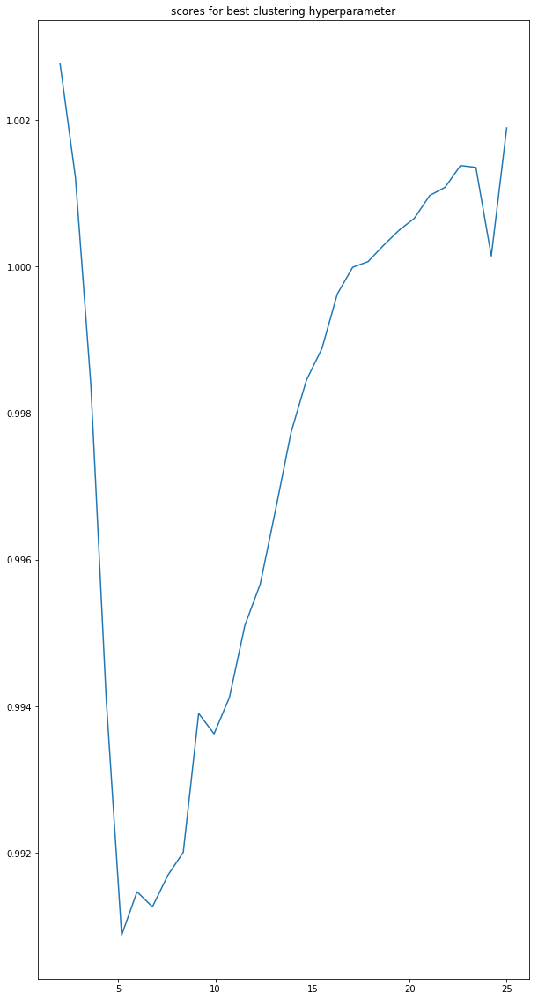

 the best value is : 5.1724137931
YPR161C
Estimated number of clusters using DBscan: 1
silhouette_score -0.0187647337076
cal_hara 44.0674701229
avg phylo dist of the clusters: [ 0.99982282  0.93694518]
-----------------------------
YOL138C
Estimated number of clusters using DBscan: 3
silhouette_score -0.286698773128
cal_hara 6.34933197543
avg phylo dist of the clusters: [ 0.99692736  0.85716149  0.34198771  1.02596312]
-----------------------------
YDR395W
Estimated number of clusters using DBscan: 0
silhouette_score 0
cal_hara 0
avg phylo dist of the clusters: [ 1.]
-----------------------------
YPR098C
Estimated number of clusters using DBscan: 1
silhouette_score 0.302148194444
cal_hara 145.114642385
avg phylo dist of the clusters: [ 0.96470191  0.99508452]
-----------------------------
YPL015C
Estimated number of clusters using DBscan: 2
silhouette_score 0.000580679180426
cal_hara 49.1757953784
avg phylo dist of the clusters: [ 0.99835581  0.95977968  0.34201868]
-------------------

silhouette_score -0.194779021572
cal_hara 4.97282663299
avg phylo dist of the clusters: [ 1.00049296  0.34369421]
-----------------------------
YLR270W
Estimated number of clusters using DBscan: 1
silhouette_score 0.0556987922425
cal_hara 75.6070870075
avg phylo dist of the clusters: [ 0.98912301  0.99226672]
-----------------------------
YMR113W
Estimated number of clusters using DBscan: 2
silhouette_score -0.15550552818
cal_hara 30.332752826
avg phylo dist of the clusters: [ 0.98131008  1.01759802]
-----------------------------
YCL008C
Estimated number of clusters using DBscan: 1
silhouette_score 0.129060081319
cal_hara 90.5187012393
avg phylo dist of the clusters: [ 0.98989773  1.00267237]
-----------------------------
YMR296C
Estimated number of clusters using DBscan: 1
silhouette_score -0.147662222841
cal_hara 16.9668507831
avg phylo dist of the clusters: [ 0.99818628  0.96224443]
-----------------------------
YHR116W
Estimated number of clusters using DBscan: 1
silhouette_score 0

avg phylo dist of the clusters: [ 1.          0.63003332]
-----------------------------
YLL019C
Estimated number of clusters using DBscan: 1
silhouette_score -0.141190526077
cal_hara 20.0721706924
avg phylo dist of the clusters: [ 0.99136776  0.93058552]
-----------------------------
YJR092W
Estimated number of clusters using DBscan: 0
silhouette_score 0
cal_hara 0
avg phylo dist of the clusters: [ 1.]
-----------------------------
YBR291C
Estimated number of clusters using DBscan: 1
silhouette_score 0.174051236527
cal_hara 100.790764126
avg phylo dist of the clusters: [ 0.9918769   0.99895236]
-----------------------------
YLR078C
Estimated number of clusters using DBscan: 1
silhouette_score 0.244553665293
cal_hara 117.603778163
avg phylo dist of the clusters: [ 0.97439469  1.00438105]
-----------------------------
YGR220C
Estimated number of clusters using DBscan: 2
silhouette_score 0.0146429158668
cal_hara 66.7324393133
avg phylo dist of the clusters: [ 0.98471133  0.99756432  0.620

avg phylo dist of the clusters: [ 0.9634919   1.00216445]
-----------------------------
YHR198C
Estimated number of clusters using DBscan: 1
silhouette_score 0.0326932969991
cal_hara 65.9553485986
avg phylo dist of the clusters: [ 0.97923247  0.9615222 ]
-----------------------------
YNL219C
Estimated number of clusters using DBscan: 3
silhouette_score -0.202613165021
cal_hara 13.7148354818
avg phylo dist of the clusters: [ 0.99970626  0.90795579  0.61950774  0.91881356]
-----------------------------
YLR210W
Estimated number of clusters using DBscan: 2
silhouette_score -0.234008706433
cal_hara 4.68796296052
avg phylo dist of the clusters: [ 0.99319456  1.09472102  0.68678643]
-----------------------------
YIL034C
Estimated number of clusters using DBscan: 1
silhouette_score 0.137648700251
cal_hara 121.691911371
avg phylo dist of the clusters: [ 0.97643554  1.02610524]
-----------------------------
YLR148W
Estimated number of clusters using DBscan: 1
silhouette_score -0.117720860576
cal

avg phylo dist of the clusters: [ 0.99860291  0.60419144  0.79725957]
-----------------------------
YOR004W
Estimated number of clusters using DBscan: 2
silhouette_score 0.0629470569872
cal_hara 55.6942159283
avg phylo dist of the clusters: [ 0.9515578   1.02604395  0.57554515]
-----------------------------
YMR233W
Estimated number of clusters using DBscan: 1
silhouette_score 0.20603190589
cal_hara 95.5534129203
avg phylo dist of the clusters: [ 0.96576156  1.01006643]
-----------------------------
YLL010C
Estimated number of clusters using DBscan: 2
silhouette_score -0.057727381828
cal_hara 35.5252806058
avg phylo dist of the clusters: [ 0.98449338  1.01544184  0.71176472]
-----------------------------
YNL104C
Estimated number of clusters using DBscan: 1
silhouette_score -0.130769403498
cal_hara 5.37475816547
avg phylo dist of the clusters: [ 1.00024833]
-----------------------------
YNR030W
Estimated number of clusters using DBscan: 1
silhouette_score -0.0778973437814
cal_hara 44.834

avg phylo dist of the clusters: [ 1.]
-----------------------------
YLR354C
Estimated number of clusters using DBscan: 1
silhouette_score -0.0638420494799
cal_hara 7.0723352796
avg phylo dist of the clusters: [ 0.99658822  0.64707824]
-----------------------------
YDR284C
Estimated number of clusters using DBscan: 1
silhouette_score 0.259525250523
cal_hara 139.688888058
avg phylo dist of the clusters: [ 0.98005328  0.99817312]
-----------------------------
YFL013C
Estimated number of clusters using DBscan: 2
silhouette_score -0.144436490769
cal_hara 27.4145242078
avg phylo dist of the clusters: [ 0.97885908  0.91894005  0.58723285]
-----------------------------
YKL051W
Estimated number of clusters using DBscan: 1
silhouette_score 0.115206168591
cal_hara 119.322400917
avg phylo dist of the clusters: [ 0.99468943  1.00571426]
-----------------------------
YJL143W
Estimated number of clusters using DBscan: 1
silhouette_score 0.243122561172
cal_hara 107.46607423
avg phylo dist of the clust

avg phylo dist of the clusters: [ 1.00013312  0.34105107]
-----------------------------
YKL095W
Estimated number of clusters using DBscan: 2
silhouette_score -0.00561914643483
cal_hara 58.9622565619
avg phylo dist of the clusters: [ 0.9847987   1.00401671  0.68150472]
-----------------------------
YOR194C
Estimated number of clusters using DBscan: 2
silhouette_score 0.00283434531041
cal_hara 35.7028169476
avg phylo dist of the clusters: [ 0.98249346  0.99623465  0.60660977]
-----------------------------
YGR060W
Estimated number of clusters using DBscan: 1
silhouette_score -0.00372342684071
cal_hara 52.3845331701
avg phylo dist of the clusters: [ 0.99659719  1.05339452]
-----------------------------
YBR115C
Estimated number of clusters using DBscan: 0
silhouette_score 0
cal_hara 0
avg phylo dist of the clusters: [ 1.]
-----------------------------
YBR147W
Estimated number of clusters using DBscan: 3
silhouette_score -0.0634378410367
cal_hara 37.1661035929
avg phylo dist of the clusters:

avg phylo dist of the clusters: [ 0.97060992  1.01313254]
-----------------------------
YJR008W
Estimated number of clusters using DBscan: 2
silhouette_score -0.0116098110223
cal_hara 38.6736894275
avg phylo dist of the clusters: [ 0.97614751  1.01661781  0.3463333 ]
-----------------------------
YKL217W
Estimated number of clusters using DBscan: 3
silhouette_score -0.212898345381
cal_hara 30.3780976263
avg phylo dist of the clusters: [ 1.00266221  0.99197958  1.32384938  1.0936147 ]
-----------------------------
YPL036W
Estimated number of clusters using DBscan: 0
silhouette_score 0
cal_hara 0
avg phylo dist of the clusters: [ 1.]
-----------------------------
YJR024C
Estimated number of clusters using DBscan: 3
silhouette_score -0.0648838859049
cal_hara 34.6890161225
avg phylo dist of the clusters: [ 1.00054179  0.97609563  0.17229444  1.03376661]
-----------------------------
YBR042C
Estimated number of clusters using DBscan: 1
silhouette_score 0.046557328601
cal_hara 87.0012650391


Estimated number of clusters using DBscan: 1
silhouette_score -0.117595925986
cal_hara 17.9329959483
avg phylo dist of the clusters: [ 1.00045863  0.98428203]
-----------------------------
YBR141C
Estimated number of clusters using DBscan: 2
silhouette_score 0.0614938082832
cal_hara 46.3234461939
avg phylo dist of the clusters: [ 0.95360513  1.03142633  0.34268163]
-----------------------------
YDR191W
Estimated number of clusters using DBscan: 1
silhouette_score -0.0849131087987
cal_hara 24.6795860482
avg phylo dist of the clusters: [ 0.99485382  1.02469609]
-----------------------------
YLR459W
Estimated number of clusters using DBscan: 1
silhouette_score 0.0927846992131
cal_hara 94.1076273025
avg phylo dist of the clusters: [ 0.9687972   1.02926706]
-----------------------------
YHR099W
Estimated number of clusters using DBscan: 1
silhouette_score -0.0970766718207
cal_hara 8.93291978081
avg phylo dist of the clusters: [ 0.99927732  0.62243451]
-----------------------------
YDR304C
E

avg phylo dist of the clusters: [ 0.97704088  1.00283578]
-----------------------------
YPR176C
Estimated number of clusters using DBscan: 1
silhouette_score 0.205210746878
cal_hara 122.223128274
avg phylo dist of the clusters: [ 0.97287961  1.00787978]
-----------------------------
YFL016C
Estimated number of clusters using DBscan: 3
silhouette_score -0.14271071329
cal_hara 22.2510778672
avg phylo dist of the clusters: [ 0.9820103   0.97733628  0.80015835  0.61848975]
-----------------------------
YLR383W
Estimated number of clusters using DBscan: 2
silhouette_score -0.28611158147
cal_hara 13.8825512531
avg phylo dist of the clusters: [ 0.99505755  1.03070836  1.01236835]
-----------------------------
YDR140W
Estimated number of clusters using DBscan: 1
silhouette_score 0.263829681389
cal_hara 148.244217295
avg phylo dist of the clusters: [ 0.96451171  1.01672871]
-----------------------------
YNL252C
Estimated number of clusters using DBscan: 3
silhouette_score -0.0912347657691
cal_h

avg phylo dist of the clusters: [ 0.998387    0.51543799]
-----------------------------
YKL132C
Estimated number of clusters using DBscan: 1
silhouette_score 0.0279556612011
cal_hara 60.4354887229
avg phylo dist of the clusters: [ 0.98042711  1.01926439]
-----------------------------
YPL222W
Estimated number of clusters using DBscan: 1
silhouette_score 9.61560692413e-05
cal_hara 70.9402913149
avg phylo dist of the clusters: [ 0.99490505  0.96115995]
-----------------------------
YKL012W
Estimated number of clusters using DBscan: 5
silhouette_score -0.254836222483
cal_hara 6.32558910143
avg phylo dist of the clusters: [ 0.99895245  1.05693402  0.97172384  0.97500115  0.51617708]
-----------------------------
YHR141C
Estimated number of clusters using DBscan: 1
silhouette_score 0.195410961582
cal_hara 9.12730277424
avg phylo dist of the clusters: [ 0.89385123  0.99969262]
-----------------------------
YAL041W
Estimated number of clusters using DBscan: 3
silhouette_score -0.235524275002
c

avg phylo dist of the clusters: [ 0.98024376  1.00157527]
-----------------------------
YHR143W-A
Estimated number of clusters using DBscan: 1
silhouette_score 0.681321323103
cal_hara 40.7205441383
avg phylo dist of the clusters: [ 0.94853537  0.99813651]
-----------------------------
YLL050C
Estimated number of clusters using DBscan: 3
silhouette_score -0.0345150342684
cal_hara 27.6560964817
avg phylo dist of the clusters: [ 0.99732928  0.9997599   0.47052169]
-----------------------------
YML035C
Estimated number of clusters using DBscan: 3
silhouette_score -0.280559949242
cal_hara 9.94009713085
avg phylo dist of the clusters: [ 0.99121869  0.99130551  0.68421087  1.14035144]
-----------------------------
YDR006C
Estimated number of clusters using DBscan: 4
silhouette_score -0.210329281848
cal_hara 9.59921988109
avg phylo dist of the clusters: [ 0.99997639  0.91973701  0.99389381  1.32904405]
-----------------------------
YNL256W
Estimated number of clusters using DBscan: 3
silhouett

silhouette_score 0.0663559076548
cal_hara 67.4232152009
avg phylo dist of the clusters: [ 0.94689554  1.01050268  1.54498243]
-----------------------------
YDR410C
Estimated number of clusters using DBscan: 1
silhouette_score 0.186765184787
cal_hara 135.430341544
avg phylo dist of the clusters: [ 0.97050261  1.0125926 ]
-----------------------------
YOR335C
Estimated number of clusters using DBscan: 1
silhouette_score -0.0742429800743
cal_hara 13.5452995936
avg phylo dist of the clusters: [ 1.00005929  1.0001606 ]
-----------------------------
YGL059W
Estimated number of clusters using DBscan: 1
silhouette_score 0.131881093391
cal_hara 110.925100832
avg phylo dist of the clusters: [ 0.96920251  1.03363857]
-----------------------------
YNL087W
Estimated number of clusters using DBscan: 0
silhouette_score 0
cal_hara 0
avg phylo dist of the clusters: [ 1.]
-----------------------------
YJL177W
Estimated number of clusters using DBscan: 3
silhouette_score -0.170100356377
cal_hara 24.58175

avg phylo dist of the clusters: [ 0.98697707  1.02462469  1.05054784]
-----------------------------
YDR148C
Estimated number of clusters using DBscan: 1
silhouette_score -0.0848309206944
cal_hara 29.794087341
avg phylo dist of the clusters: [ 0.99977389  1.01767337]
-----------------------------
YJL059W
Estimated number of clusters using DBscan: 1
silhouette_score 0.0306379787236
cal_hara 71.0100093321
avg phylo dist of the clusters: [ 0.99772882  1.00501575]
-----------------------------
YEL044W
Estimated number of clusters using DBscan: 1
silhouette_score 0.331439336824
cal_hara 125.878234112
avg phylo dist of the clusters: [ 0.95284086  1.00575363]
-----------------------------
YBL051C
Estimated number of clusters using DBscan: 0
silhouette_score 0
cal_hara 0
avg phylo dist of the clusters: [ 1.]
-----------------------------
YOR351C
Estimated number of clusters using DBscan: 1
silhouette_score 0.122471605228
cal_hara 53.9758516434
avg phylo dist of the clusters: [ 0.99015717  1.011

Estimated number of clusters using DBscan: 4
silhouette_score -0.26311110958
cal_hara 10.0384305821
avg phylo dist of the clusters: [ 0.9936738   0.95687277  0.63941809  0.7746796 ]
-----------------------------
YGR070W
Estimated number of clusters using DBscan: 0
silhouette_score 0
cal_hara 0
avg phylo dist of the clusters: [ 1.]
-----------------------------
YGR181W
Estimated number of clusters using DBscan: 1
silhouette_score 0.303882829137
cal_hara 21.8008299101
avg phylo dist of the clusters: [ 1.0206232   1.00007717]
-----------------------------
YPL029W
Estimated number of clusters using DBscan: 1
silhouette_score -0.0434550474804
cal_hara 54.9523704121
avg phylo dist of the clusters: [ 0.99733833  0.98770126]
-----------------------------
YER007C-A
Estimated number of clusters using DBscan: 1
silhouette_score 0.222713379496
cal_hara 149.347251566
avg phylo dist of the clusters: [ 0.97615653  0.98969739]
-----------------------------
YLR116W
Estimated number of clusters using DB

Estimated number of clusters using DBscan: 6
silhouette_score -0.208114095629
cal_hara 18.5026129344
avg phylo dist of the clusters: [ 0.99208699  1.0137791   0.64564702  0.50972133  0.56635704  1.13271408
  0.50972133]
-----------------------------
YLR283W
Estimated number of clusters using DBscan: 1
silhouette_score 0.166833439628
cal_hara 100.386121096
avg phylo dist of the clusters: [ 0.98344819  1.01552302]
-----------------------------
YGL174W
Estimated number of clusters using DBscan: 1
silhouette_score 0.150942358087
cal_hara 89.6179252784
avg phylo dist of the clusters: [ 0.97719394  1.00972226]
-----------------------------
YGR145W
Estimated number of clusters using DBscan: 2
silhouette_score -0.170632996557
cal_hara 20.3463622497
avg phylo dist of the clusters: [ 0.99364377  0.96603847  1.07300514]
-----------------------------
YDR061W
Estimated number of clusters using DBscan: 2
silhouette_score -0.195729932612
cal_hara 31.4154763315
avg phylo dist of the clusters: [ 0.9829

avg phylo dist of the clusters: [ 0.9897017   0.92429759  1.18972377]
-----------------------------
YAL042W
Estimated number of clusters using DBscan: 1
silhouette_score 0.00101324136355
cal_hara 58.4783071719
avg phylo dist of the clusters: [ 0.98636404  1.02580565]
-----------------------------
YIL007C
Estimated number of clusters using DBscan: 1
silhouette_score 0.344329182153
cal_hara 115.135430474
avg phylo dist of the clusters: [ 0.97324568  1.00168219]
-----------------------------
YPR036W
Estimated number of clusters using DBscan: 1
silhouette_score -0.0310328302626
cal_hara 52.2962551237
avg phylo dist of the clusters: [ 0.98461448  0.96313371]
-----------------------------
YHR181W
Estimated number of clusters using DBscan: 1
silhouette_score 0.248314955708
cal_hara 96.2541072496
avg phylo dist of the clusters: [ 0.97604635  1.00543872]
-----------------------------
YDR188W
Estimated number of clusters using DBscan: 3
silhouette_score -0.226179481486
cal_hara 6.03426695861
avg

avg phylo dist of the clusters: [ 0.98922599  0.97495989  0.86752206  0.67293767]
-----------------------------
YDR435C
Estimated number of clusters using DBscan: 1
silhouette_score 0.136520763374
cal_hara 82.1374656668
avg phylo dist of the clusters: [ 0.98038218  1.00532231]
-----------------------------
YNL161W
Estimated number of clusters using DBscan: 2
silhouette_score -0.178161472023
cal_hara 16.5144638348
avg phylo dist of the clusters: [ 0.99490856  0.74396362  0.34329833]
-----------------------------
YDL052C
Estimated number of clusters using DBscan: 1
silhouette_score -0.0411242239824
cal_hara 48.136582952
avg phylo dist of the clusters: [ 0.99051394  0.98963781]
-----------------------------
YFR031C
Estimated number of clusters using DBscan: 0
silhouette_score 0
cal_hara 0
avg phylo dist of the clusters: [ 1.]
-----------------------------
YBR084C-A
Estimated number of clusters using DBscan: 3
silhouette_score -0.124358486338
cal_hara 16.3054985131
avg phylo dist of the cl

avg phylo dist of the clusters: [ 0.90416061  1.00635885]
-----------------------------
YAR003W
Estimated number of clusters using DBscan: 1
silhouette_score 0.0502924127109
cal_hara 67.8738337998
avg phylo dist of the clusters: [ 0.97308875  1.02964969]
-----------------------------
YGR223C
Estimated number of clusters using DBscan: 1
silhouette_score 0.191227522789
cal_hara 90.7612834183
avg phylo dist of the clusters: [ 0.97507393  1.01049623]
-----------------------------
YPL093W
Estimated number of clusters using DBscan: 0
silhouette_score 0
cal_hara 0
avg phylo dist of the clusters: [ 1.]
-----------------------------
YJR034W
Estimated number of clusters using DBscan: 1
silhouette_score 0.400274298009
cal_hara 88.4334381483
avg phylo dist of the clusters: [ 0.92220655  1.00000149]
-----------------------------
YPL160W
Estimated number of clusters using DBscan: 1
silhouette_score 0.00178272274546
cal_hara 10.8300795263
avg phylo dist of the clusters: [ 1.          0.25441497]
----

avg phylo dist of the clusters: [ 0.9959815   1.01637454]
-----------------------------
YNL222W
Estimated number of clusters using DBscan: 1
silhouette_score 0.207776602458
cal_hara 93.5424508874
avg phylo dist of the clusters: [ 0.98400477  1.00997014]
-----------------------------
YKR051W
Estimated number of clusters using DBscan: 1
silhouette_score 0.0529552481576
cal_hara 65.151764878
avg phylo dist of the clusters: [ 0.98534054  1.00425539]
-----------------------------
YLR291C
Estimated number of clusters using DBscan: 1
silhouette_score 0.0242320148986
cal_hara 56.6393106546
avg phylo dist of the clusters: [ 0.99356194  0.96899024]
-----------------------------
YFR040W
Estimated number of clusters using DBscan: 3
silhouette_score -0.181200497382
cal_hara 8.76546089885
avg phylo dist of the clusters: [ 0.99450696  0.99718658  0.60236144  0.34420654]
-----------------------------
YBR021W
Estimated number of clusters using DBscan: 1
silhouette_score -0.0875075977027
cal_hara 33.023

silhouette_score -0.176335644037
cal_hara 18.4290069668
avg phylo dist of the clusters: [ 0.98309172  0.94664601  0.34686266]
-----------------------------
YJL029C
Estimated number of clusters using DBscan: 1
silhouette_score -0.119090384375
cal_hara 34.8431110104
avg phylo dist of the clusters: [ 0.99462458  1.00294508]
-----------------------------
YBR105C
Estimated number of clusters using DBscan: 1
silhouette_score 0.210153947078
cal_hara 103.728345747
avg phylo dist of the clusters: [ 0.97194358  1.01249498]
-----------------------------
YJR052W
Estimated number of clusters using DBscan: 1
silhouette_score -0.0294853299795
cal_hara 47.4623560485
avg phylo dist of the clusters: [ 0.99547822  0.98897782]
-----------------------------
YGL200C
Estimated number of clusters using DBscan: 1
silhouette_score 0.215888970176
cal_hara 146.977982068
avg phylo dist of the clusters: [ 0.94980787  1.01210203]
-----------------------------
YPL012W
Estimated number of clusters using DBscan: 0
silh

avg phylo dist of the clusters: [ 0.98447484  0.98566705]
-----------------------------
YAL046C
Estimated number of clusters using DBscan: 1
silhouette_score 0.373735115396
cal_hara 118.517115022
avg phylo dist of the clusters: [ 0.98014195  0.99484319]
-----------------------------
YJL045W
Estimated number of clusters using DBscan: 1
silhouette_score 0.0964781141877
cal_hara 16.8361924451
avg phylo dist of the clusters: [ 1.          0.80382367]
-----------------------------
YLR027C
Estimated number of clusters using DBscan: 1
silhouette_score 0.020289165593
cal_hara 31.8200606401
avg phylo dist of the clusters: [ 1.00135605  0.96097694]
-----------------------------
YOR275C
Estimated number of clusters using DBscan: 1
silhouette_score -0.13408035571
cal_hara 23.6709240099
avg phylo dist of the clusters: [ 1.00007023  0.98526028]
-----------------------------
YML077W
Estimated number of clusters using DBscan: 1
silhouette_score 0.318934623299
cal_hara 144.60024134
avg phylo dist of th

avg phylo dist of the clusters: [ 0.99545263  0.96050251  0.55265277  1.26884564]
-----------------------------
YMR074C
Estimated number of clusters using DBscan: 2
silhouette_score 0.356844360482
cal_hara 67.1006864714
avg phylo dist of the clusters: [ 0.9747581   0.99769892  0.34382305]
-----------------------------
YDR341C
Estimated number of clusters using DBscan: 2
silhouette_score -0.16680878502
cal_hara 6.74405398415
avg phylo dist of the clusters: [ 1.00023274  0.16953206  0.33906411]
-----------------------------
YML026C
Estimated number of clusters using DBscan: 4
silhouette_score -0.0460000655759
cal_hara 20.707227069
avg phylo dist of the clusters: [ 0.97088547  0.93595137  0.99632663  0.43819082  0.59367789]
-----------------------------
YEL053C
Estimated number of clusters using DBscan: 2
silhouette_score -0.127476656304
cal_hara 41.147276265
avg phylo dist of the clusters: [ 0.9856344   0.95218179  0.82854292]
-----------------------------
YLR452C
Estimated number of clu

avg phylo dist of the clusters: [ 1.05578744  1.00068579]
-----------------------------
YMR024W
Estimated number of clusters using DBscan: 2
silhouette_score -0.064675785872
cal_hara 43.5614366235
avg phylo dist of the clusters: [ 0.98576214  1.01031092  0.68197854]
-----------------------------
YDL018C
Estimated number of clusters using DBscan: 3
silhouette_score 0.0484156403893
cal_hara 35.5987423976
avg phylo dist of the clusters: [ 0.96209777  1.00942472  0.45928513  0.80949004]
-----------------------------
YLR147C
Estimated number of clusters using DBscan: 1
silhouette_score 0.395385666145
cal_hara 44.2314846872
avg phylo dist of the clusters: [ 0.90862037  0.99968279]
-----------------------------
YIL061C
Estimated number of clusters using DBscan: 1
silhouette_score 0.0876851030744
cal_hara 55.5400161325
avg phylo dist of the clusters: [ 0.96012834  1.01938201]
-----------------------------
YML012W
Estimated number of clusters using DBscan: 4
silhouette_score -0.0111849766307
ca

avg phylo dist of the clusters: [ 0.99995682  0.81476948]
-----------------------------
YNL061W
Estimated number of clusters using DBscan: 2
silhouette_score -0.168194589994
cal_hara 16.1323395196
avg phylo dist of the clusters: [ 0.99957933  0.94247376  0.34006785]
-----------------------------
YER095W
Estimated number of clusters using DBscan: 3
silhouette_score -0.118635270277
cal_hara 24.4377202549
avg phylo dist of the clusters: [ 0.98579348  0.99020855  0.39646767]
-----------------------------
YJL138C
Estimated number of clusters using DBscan: 1
silhouette_score -0.00869745473169
cal_hara 15.2421116165
avg phylo dist of the clusters: [ 1.00016388  1.06369114]
-----------------------------
YJL063C
Estimated number of clusters using DBscan: 1
silhouette_score 0.211907592868
cal_hara 140.518389029
avg phylo dist of the clusters: [ 0.98576666  1.0080733 ]
-----------------------------
YLR410W
Estimated number of clusters using DBscan: 1
silhouette_score -0.222707860618
cal_hara 4.34

avg phylo dist of the clusters: [ 0.95636649  1.01093865]
-----------------------------
YJR002W
Estimated number of clusters using DBscan: 3
silhouette_score -0.271414317916
cal_hara 10.877352829
avg phylo dist of the clusters: [ 0.99372201  0.99082546  0.81756009  0.34423583]
-----------------------------
YPL094C
Estimated number of clusters using DBscan: 2
silhouette_score -0.0442418462875
cal_hara 38.5962068389
avg phylo dist of the clusters: [ 0.98928488  1.00577465  0.97547232]
-----------------------------
YER120W
Estimated number of clusters using DBscan: 2
silhouette_score -0.039939093728
cal_hara 39.0017460873
avg phylo dist of the clusters: [ 0.99243882  0.98230066]
-----------------------------
YGL207W
Estimated number of clusters using DBscan: 2
silhouette_score -0.157871281831
cal_hara 9.2460484261
avg phylo dist of the clusters: [ 0.99952748  0.16907101  1.00315463]
-----------------------------
YDR516C
Estimated number of clusters using DBscan: 1
silhouette_score -0.0996

avg phylo dist of the clusters: [ 0.99755371  0.98110103]
-----------------------------
YKL145W
Estimated number of clusters using DBscan: 4
silhouette_score -0.242370692191
cal_hara 5.29557330493
avg phylo dist of the clusters: [ 0.99935231  0.34031314  0.61377906  0.90750171  0.34031314]
-----------------------------
YFR030W
Estimated number of clusters using DBscan: 1
silhouette_score -0.0716986855471
cal_hara 8.49276181938
avg phylo dist of the clusters: [ 1.00046752  0.34324819]
-----------------------------
YIL150C
Estimated number of clusters using DBscan: 1
silhouette_score 0.0112548747618
cal_hara 49.8707160065
avg phylo dist of the clusters: [ 0.98579518  1.00315755]
-----------------------------
YDL126C
Estimated number of clusters using DBscan: 0
silhouette_score 0
cal_hara 0
avg phylo dist of the clusters: [ 1.]
-----------------------------
YDL006W
Estimated number of clusters using DBscan: 2
silhouette_score -0.0171370458434
cal_hara 35.0413545417
avg phylo dist of the c

silhouette_score -0.106477524032
cal_hara 49.0861015095
avg phylo dist of the clusters: [ 0.99653078  0.98119032  1.08347876]
-----------------------------
YLL008W
Estimated number of clusters using DBscan: 2
silhouette_score -0.222078538592
cal_hara 7.06017309598
avg phylo dist of the clusters: [ 0.99947569  0.92952586]
-----------------------------
YPL111W
Estimated number of clusters using DBscan: 2
silhouette_score -0.0880463177802
cal_hara 36.3908789642
avg phylo dist of the clusters: [ 0.99314399  0.91066235  1.08622949]
-----------------------------
YER043C
Estimated number of clusters using DBscan: 0
silhouette_score 0
cal_hara 0
avg phylo dist of the clusters: [ 1.]
-----------------------------
YBR182C
Estimated number of clusters using DBscan: 1
silhouette_score 0.0374032277469
cal_hara 61.7535506453
avg phylo dist of the clusters: [ 0.98811826  1.01704574]
-----------------------------
YMR054W
Estimated number of clusters using DBscan: 1
silhouette_score 0.0354310110972
cal

Estimated number of clusters using DBscan: 2
silhouette_score 0.0406315308392
cal_hara 48.489741298
avg phylo dist of the clusters: [ 0.94229479  1.02781388  1.38292086]
-----------------------------
YOL059W
Estimated number of clusters using DBscan: 3
silhouette_score -0.187299792164
cal_hara 25.9416376458
avg phylo dist of the clusters: [ 0.98765369  0.83257917  1.02666013  1.0463495 ]
-----------------------------
YOR250C
Estimated number of clusters using DBscan: 2
silhouette_score -0.187563886098
cal_hara 14.9264092985
avg phylo dist of the clusters: [ 1.00130601  0.99326064]
-----------------------------
YGR110W
Estimated number of clusters using DBscan: 1
silhouette_score -0.0329705929218
cal_hara 55.6381280603
avg phylo dist of the clusters: [ 0.99200536  1.00617271]
-----------------------------
YOR165W
Estimated number of clusters using DBscan: 1
silhouette_score -0.131049779215
cal_hara 16.303813201
avg phylo dist of the clusters: [ 0.99904663  0.89368447]
------------------

avg phylo dist of the clusters: [ 0.97500416  0.71207201  1.00236764  0.96862736  1.01724572]
-----------------------------
YGL085W
Estimated number of clusters using DBscan: 1
silhouette_score 0.264988543437
cal_hara 131.419416897
avg phylo dist of the clusters: [ 0.98137884  1.00620848]
-----------------------------
YML008C
Estimated number of clusters using DBscan: 2
silhouette_score -0.0561715928265
cal_hara 85.6556315098
avg phylo dist of the clusters: [ 0.99708897  1.02478874  0.51437482]
-----------------------------
YLR206W
Estimated number of clusters using DBscan: 5
silhouette_score -0.238745624283
cal_hara 10.0506342556
avg phylo dist of the clusters: [ 0.986541    1.04102771  0.56207303  0.58173739  0.6022211 ]
-----------------------------
YOR180C
Estimated number of clusters using DBscan: 4
silhouette_score -0.0758505035909
cal_hara 38.5556926744
avg phylo dist of the clusters: [ 0.96626266  1.03629944  1.01775036  1.30853618  1.04682895]
-----------------------------
YPL

avg phylo dist of the clusters: [ 1.00101993]
-----------------------------
YOR296W
Estimated number of clusters using DBscan: 1
silhouette_score -0.249602608736
cal_hara 6.80321594244
avg phylo dist of the clusters: [ 1.00097695  0.77325528]
-----------------------------
YBL106C
Estimated number of clusters using DBscan: 0
silhouette_score 0
cal_hara 0
avg phylo dist of the clusters: [ 1.]
-----------------------------
YOR035C
Estimated number of clusters using DBscan: 1
silhouette_score -0.178226829962
cal_hara 13.6872278687
avg phylo dist of the clusters: [ 0.99960354  1.00440531]
-----------------------------
YDR200C
Estimated number of clusters using DBscan: 1
silhouette_score -0.00155074935381
cal_hara 54.2548658438
avg phylo dist of the clusters: [ 0.98770378  0.98379768]
-----------------------------
YBL068W
Estimated number of clusters using DBscan: 2
silhouette_score -0.133475347414
cal_hara 23.3896150484
avg phylo dist of the clusters: [ 0.99279217  0.58667438  1.01170589]
-

avg phylo dist of the clusters: [ 0.97982932  0.99094206  1.55946589  0.81438774]
-----------------------------
YEL013W
Estimated number of clusters using DBscan: 2
silhouette_score -0.150046537686
cal_hara 18.4478427496
avg phylo dist of the clusters: [ 0.99776279  1.02949887]
-----------------------------
YMR128W
Estimated number of clusters using DBscan: 0
silhouette_score 0
cal_hara 0
avg phylo dist of the clusters: [ 1.]
-----------------------------
YLR268W
Estimated number of clusters using DBscan: 1
silhouette_score 0.239947373005
cal_hara 169.057224062
avg phylo dist of the clusters: [ 0.96352427  1.00217163]
-----------------------------
YEL055C
Estimated number of clusters using DBscan: 0
silhouette_score 0
cal_hara 0
avg phylo dist of the clusters: [ 1.]
-----------------------------
YIL068C
Estimated number of clusters using DBscan: 1
silhouette_score -0.225039457431
cal_hara 4.5329149503
avg phylo dist of the clusters: [ 0.99988266  0.55294001]
---------------------------

avg phylo dist of the clusters: [ 1.00156812  0.57225529  1.03005951]
-----------------------------
YLR153C
Estimated number of clusters using DBscan: 0
silhouette_score 0
cal_hara 0
avg phylo dist of the clusters: [ 1.]
-----------------------------
YLR074C
Estimated number of clusters using DBscan: 1
silhouette_score 0.416904438795
cal_hara 91.6273359616
avg phylo dist of the clusters: [ 0.97767657  1.00277512]
-----------------------------
YOR085W
Estimated number of clusters using DBscan: 1
silhouette_score 0.0855545632245
cal_hara 84.0150566909
avg phylo dist of the clusters: [ 0.99221602  0.97238787]
-----------------------------
YJL190C
Estimated number of clusters using DBscan: 1
silhouette_score 0.0865749696264
cal_hara 17.1640433045
avg phylo dist of the clusters: [ 0.94718163  1.00857435]
-----------------------------
YPL204W
Estimated number of clusters using DBscan: 0
silhouette_score 0
cal_hara 0
avg phylo dist of the clusters: [ 1.]
-----------------------------
YOR159C


avg phylo dist of the clusters: [ 0.922761    1.00685054]
-----------------------------
YDR436W
Estimated number of clusters using DBscan: 3
silhouette_score -0.22961197219
cal_hara 10.0458635573
avg phylo dist of the clusters: [ 0.99374793  1.0283899   1.08131754]
-----------------------------
YIL083C
Estimated number of clusters using DBscan: 1
silhouette_score -0.000922480193458
cal_hara 62.0325593081
avg phylo dist of the clusters: [ 0.99693897  0.9808271 ]
-----------------------------
YOR124C
Estimated number of clusters using DBscan: 3
silhouette_score -0.279521889509
cal_hara 6.18030911428
avg phylo dist of the clusters: [ 0.99309162  1.07190929]
-----------------------------
YDL064W
Estimated number of clusters using DBscan: 1
silhouette_score 0.28556419843
cal_hara 70.9394724927
avg phylo dist of the clusters: [ 0.94883044  1.00555872]
-----------------------------
YJL103C
Estimated number of clusters using DBscan: 2
silhouette_score -0.106487856773
cal_hara 20.3322029529
avg

avg phylo dist of the clusters: [ 0.95406254  0.99256705  0.17299294]
-----------------------------
YOR330C
Estimated number of clusters using DBscan: 2
silhouette_score -0.223954122805
cal_hara 5.15259223055
avg phylo dist of the clusters: [ 0.99987911  0.88962928  0.34216511]
-----------------------------
YPL072W
Estimated number of clusters using DBscan: 2
silhouette_score -0.166020247112
cal_hara 21.146753308
avg phylo dist of the clusters: [ 0.99752213  1.0005367   0.34234699]
-----------------------------
YPL252C
Estimated number of clusters using DBscan: 1
silhouette_score 0.327802132133
cal_hara 110.077832678
avg phylo dist of the clusters: [ 0.98139     1.00256231]
-----------------------------
YNL049C
Estimated number of clusters using DBscan: 1
silhouette_score -0.20832910197
cal_hara 5.93245350879
avg phylo dist of the clusters: [ 0.99790658  0.99887254]
-----------------------------
YNL108C
Estimated number of clusters using DBscan: 1
silhouette_score 0.20236630288
cal_har

avg phylo dist of the clusters: [ 0.98402574  1.00577559  0.64678558  1.07193125  0.3385046 ]
-----------------------------
YAL022C
Estimated number of clusters using DBscan: 1
silhouette_score 0.0244436376876
cal_hara 75.2605660988
avg phylo dist of the clusters: [ 0.99325215  1.00569137]
-----------------------------
YMR079W
Estimated number of clusters using DBscan: 4
silhouette_score -0.129023864551
cal_hara 20.6869465582
avg phylo dist of the clusters: [ 0.99243501  0.86368205  0.78410262  0.34849005]
-----------------------------
YKR081C
Estimated number of clusters using DBscan: 1
silhouette_score 0.0220085216514
cal_hara 65.1960130548
avg phylo dist of the clusters: [ 0.99566982  0.94054484]
-----------------------------
YLR401C
Estimated number of clusters using DBscan: 1
silhouette_score -0.126892997074
cal_hara 27.6178882982
avg phylo dist of the clusters: [ 0.99545084  0.88543222]
-----------------------------
YMR200W
Estimated number of clusters using DBscan: 1
silhouette_

avg phylo dist of the clusters: [ 0.99613262  0.98269477  0.62074276]
-----------------------------
YGL148W
Estimated number of clusters using DBscan: 2
silhouette_score -0.0774630389849
cal_hara 25.5383490501
avg phylo dist of the clusters: [ 0.99406133  1.04467448  0.1716812 ]
-----------------------------
YNR032W
Estimated number of clusters using DBscan: 4
silhouette_score -0.0232712816567
cal_hara 28.0294474729
avg phylo dist of the clusters: [ 0.96333239  0.97291271  0.81358048  0.1712801   0.98486058]
-----------------------------
YOR245C
Estimated number of clusters using DBscan: 3
silhouette_score -0.116251671414
cal_hara 27.3127594078
avg phylo dist of the clusters: [ 0.96866859  0.98982187  1.45418275  0.86965831]
-----------------------------
YNL299W
Estimated number of clusters using DBscan: 2
silhouette_score -0.0434450929534
cal_hara 39.7197762437
avg phylo dist of the clusters: [ 0.98369816  0.98719347  0.66974757]
-----------------------------
YJL057C
Estimated number 

Estimated number of clusters using DBscan: 1
silhouette_score 0.206545616599
cal_hara 77.890608699
avg phylo dist of the clusters: [ 0.95194108  1.02029459]
-----------------------------
YDR415C
Estimated number of clusters using DBscan: 1
silhouette_score 0.0136841445531
cal_hara 106.182857179
avg phylo dist of the clusters: [ 0.98689472  0.97800277]
-----------------------------
YPR032W
Estimated number of clusters using DBscan: 0
silhouette_score 0
cal_hara 0
avg phylo dist of the clusters: [ 1.]
-----------------------------
YFL059W
Estimated number of clusters using DBscan: 4
silhouette_score -0.327798643621
cal_hara 7.1354731723
avg phylo dist of the clusters: [ 0.99416046  0.9720917   0.48032766  0.67801354  0.34309119]
-----------------------------
YDR298C
Estimated number of clusters using DBscan: 5
silhouette_score -0.238703596985
cal_hara 15.1154920623
avg phylo dist of the clusters: [ 0.99721517  1.01394443  0.68771883  0.17192971  0.36105239  0.34385942]
------------------

avg phylo dist of the clusters: [ 0.97746599  0.98319464]
-----------------------------
YGL133W
Estimated number of clusters using DBscan: 2
silhouette_score -0.219235624112
cal_hara 5.00302525745
avg phylo dist of the clusters: [ 1.00053135  0.51481305  0.51481305]
-----------------------------
YOR003W
Estimated number of clusters using DBscan: 0
silhouette_score 0
cal_hara 0
avg phylo dist of the clusters: [ 1.]
-----------------------------
YGL067W
Estimated number of clusters using DBscan: 3
silhouette_score -0.112524293589
cal_hara 25.6671915828
avg phylo dist of the clusters: [ 0.98087342  1.00201917  0.34301341  0.80036462]
-----------------------------
YNR035C
Estimated number of clusters using DBscan: 2
silhouette_score -0.104293955343
cal_hara 42.4035527426
avg phylo dist of the clusters: [ 0.98166868  1.02616113  0.25804588]
-----------------------------
YOR232W
Estimated number of clusters using DBscan: 2
silhouette_score -0.0377571958551
cal_hara 45.5307321718
avg phylo di

Estimated number of clusters using DBscan: 2
silhouette_score -0.0201868436358
cal_hara 67.0260941454
avg phylo dist of the clusters: [ 0.97177617  1.00359782  0.82982463]
-----------------------------
YDR483W
Estimated number of clusters using DBscan: 2
silhouette_score -0.0702273026591
cal_hara 51.2807397631
avg phylo dist of the clusters: [ 0.98879099  0.98647079  0.68486265]
-----------------------------
YCR026C
Estimated number of clusters using DBscan: 1
silhouette_score -0.0561518446043
cal_hara 39.1286190351
avg phylo dist of the clusters: [ 0.98624576  1.03542763]
-----------------------------
YDL214C
Estimated number of clusters using DBscan: 1
silhouette_score -0.260064642743
cal_hara 4.52358898779
avg phylo dist of the clusters: [ 0.99815308  1.10207734]
-----------------------------
YMR080C
Estimated number of clusters using DBscan: 1
silhouette_score -0.0841048579462
cal_hara 6.86403751538
avg phylo dist of the clusters: [ 0.9962393   0.51194619]
-------------------------

Estimated number of clusters using DBscan: 2
silhouette_score -0.246372634177
cal_hara 7.04868384819
avg phylo dist of the clusters: [ 0.99973888  0.95040627  1.03056102]
-----------------------------
YFR031C-A
Estimated number of clusters using DBscan: 5
silhouette_score -0.232168954935
cal_hara 10.8718990371
avg phylo dist of the clusters: [ 0.99586269  0.20314332  0.3113655   1.06408405  0.3385722 ]
-----------------------------
YDR012W
Estimated number of clusters using DBscan: 3
silhouette_score -0.218325147935
cal_hara 16.3803287015
avg phylo dist of the clusters: [ 0.99730282  0.25476281  0.61264389  0.96243727]
-----------------------------
YLR417W
Estimated number of clusters using DBscan: 1
silhouette_score 0.0981481210544
cal_hara 82.9958463092
avg phylo dist of the clusters: [ 0.9728496   1.01861976]
-----------------------------
YKL022C
Estimated number of clusters using DBscan: 2
silhouette_score -0.226012061994
cal_hara 14.9879470241
avg phylo dist of the clusters: [ 0.9

silhouette_score 0.129490549303
cal_hara 70.2270127153
avg phylo dist of the clusters: [ 0.97326035  1.02629362]
-----------------------------
YML036W
Estimated number of clusters using DBscan: 2
silhouette_score 0.267934309137
cal_hara 58.8076500023
avg phylo dist of the clusters: [ 0.95290544  1.01391421  1.06163134]
-----------------------------
YLR293C
Estimated number of clusters using DBscan: 6
silhouette_score -0.153509819151
cal_hara 21.4906045901
avg phylo dist of the clusters: [ 0.98695122  0.59705026  0.91877683  0.26939444  0.8790766   0.34028772]
-----------------------------
YHR031C
Estimated number of clusters using DBscan: 1
silhouette_score 0.0730749943793
cal_hara 69.3219583207
avg phylo dist of the clusters: [ 0.97472674  1.01989811]
-----------------------------
YLR177W
Estimated number of clusters using DBscan: 3
silhouette_score -0.264869401595
cal_hara 3.72915198994
avg phylo dist of the clusters: [ 0.99969413  0.94782175  1.09797173  1.12612485]
----------------

avg phylo dist of the clusters: [ 1.]
-----------------------------
YMR143W
Estimated number of clusters using DBscan: 4
silhouette_score -0.094080295437
cal_hara 21.5277156994
avg phylo dist of the clusters: [ 0.98316372  0.99427027  0.93502879  0.21143867  0.33830187]
-----------------------------
YGR183C
Estimated number of clusters using DBscan: 1
silhouette_score 0.439562192819
cal_hara 17.2073066605
avg phylo dist of the clusters: [ 1.0187358   1.00070358]
-----------------------------
YGR175C
Estimated number of clusters using DBscan: 1
silhouette_score -0.0420874540908
cal_hara 48.7794017801
avg phylo dist of the clusters: [ 0.99758319  0.98192291]
-----------------------------
YKR072C
Estimated number of clusters using DBscan: 1
silhouette_score 0.326129136753
cal_hara 150.498077273
avg phylo dist of the clusters: [ 0.95717906  1.02642649]
-----------------------------
YNL265C
Estimated number of clusters using DBscan: 1
silhouette_score 0.203880477855
cal_hara 127.466434462
a

avg phylo dist of the clusters: [ 0.99814806  1.12314201]
-----------------------------
YCR051W
Estimated number of clusters using DBscan: 1
silhouette_score 0.331428234369
cal_hara 131.127254534
avg phylo dist of the clusters: [ 0.9690269   1.01063896]
-----------------------------
YOR063W
Estimated number of clusters using DBscan: 1
silhouette_score -0.13975612594
cal_hara 5.48690147439
avg phylo dist of the clusters: [ 1.00024511  1.02100769]
-----------------------------
YPL076W
Estimated number of clusters using DBscan: 2
silhouette_score 0.00176264847447
cal_hara 47.941617273
avg phylo dist of the clusters: [ 0.96610848  0.98808902  1.37123189]
-----------------------------
YIR002C
Estimated number of clusters using DBscan: 1
silhouette_score -0.184471040142
cal_hara 17.5251226461
avg phylo dist of the clusters: [ 0.99721538  1.05394719]
-----------------------------
YML110C
Estimated number of clusters using DBscan: 2
silhouette_score -0.0375213804474
cal_hara 46.686890205
avg p

silhouette_score -0.182724110583
cal_hara 33.4052327087
avg phylo dist of the clusters: [ 0.98073952  1.00099508  0.22815013  1.05300062  0.96525057]
-----------------------------
YBL013W
Estimated number of clusters using DBscan: 2
silhouette_score -0.00912462840853
cal_hara 55.5444621465
avg phylo dist of the clusters: [ 0.9823814   1.01230374  0.8978072 ]
-----------------------------
YKL127W
Estimated number of clusters using DBscan: 0
silhouette_score 0
cal_hara 0
avg phylo dist of the clusters: [ 1.]
-----------------------------
YOR241W
Estimated number of clusters using DBscan: 1
silhouette_score 0.0284841505422
cal_hara 71.2052239328
avg phylo dist of the clusters: [ 0.98768743  1.01610724]
-----------------------------
YDR382W
Estimated number of clusters using DBscan: 1
silhouette_score 0.191595513355
cal_hara 11.8846608142
avg phylo dist of the clusters: [ 0.99561855  1.00325911]
-----------------------------
YOL129W
Estimated number of clusters using DBscan: 1
silhouette_s

silhouette_score -0.0578575064373
cal_hara 33.6795946532
avg phylo dist of the clusters: [ 0.9952312  1.0119368]
-----------------------------
YPR103W
Estimated number of clusters using DBscan: 2
silhouette_score -0.088393416406
cal_hara 44.2104587659
avg phylo dist of the clusters: [ 0.98547158  0.98120372  0.62084574]
-----------------------------
YBL088C
Estimated number of clusters using DBscan: 0
silhouette_score 0
cal_hara 0
avg phylo dist of the clusters: [ 1.]
-----------------------------
YJR122W
Estimated number of clusters using DBscan: 1
silhouette_score 0.0899452374855
cal_hara 88.5562820713
avg phylo dist of the clusters: [ 0.97799214  1.00637968]
-----------------------------
YOR390W
Estimated number of clusters using DBscan: 2
silhouette_score -0.0559140693649
cal_hara 60.9459222593
avg phylo dist of the clusters: [ 0.9737527   1.00866005  1.09067189]
-----------------------------
YML105C
Estimated number of clusters using DBscan: 1
silhouette_score 0.116172880295
cal_h

Estimated number of clusters using DBscan: 4
silhouette_score -0.198299006383
cal_hara 9.72399136676
avg phylo dist of the clusters: [ 0.99362904  1.00382185  0.71041207  1.17447157  0.97395203]
-----------------------------
YIL093C
Estimated number of clusters using DBscan: 2
silhouette_score 0.0558933721697
cal_hara 59.2017467417
avg phylo dist of the clusters: [ 0.97454138  1.00712561]
-----------------------------
YDL087C
Estimated number of clusters using DBscan: 2
silhouette_score -0.00973913214559
cal_hara 51.1338529804
avg phylo dist of the clusters: [ 0.9798245   1.00756586  0.68958269]
-----------------------------
YPL135W
Estimated number of clusters using DBscan: 4
silhouette_score -0.00908313512736
cal_hara 44.615386067
avg phylo dist of the clusters: [ 0.97262918  1.0091909   0.26680118  0.64470194  1.13532417]
-----------------------------
YOR326W
Estimated number of clusters using DBscan: 0
silhouette_score 0
cal_hara 0
avg phylo dist of the clusters: [ 1.]
------------

avg phylo dist of the clusters: [ 0.98965015  0.74521392  0.2722897   0.58143064  1.10635605]
-----------------------------
YNR003C
Estimated number of clusters using DBscan: 1
silhouette_score 0.0616136936802
cal_hara 88.5695205589
avg phylo dist of the clusters: [ 0.9930271   1.01012261]
-----------------------------
YOR150W
Estimated number of clusters using DBscan: 1
silhouette_score 0.264878889238
cal_hara 115.664191805
avg phylo dist of the clusters: [ 0.9533914   1.00605016]
-----------------------------
YNL112W
Estimated number of clusters using DBscan: 0
silhouette_score 0
cal_hara 0
avg phylo dist of the clusters: [ 1.]
-----------------------------
YDR389W
Estimated number of clusters using DBscan: 2
silhouette_score -0.138353004296
cal_hara 27.3219623175
avg phylo dist of the clusters: [ 0.98888389  1.05367215]
-----------------------------
YDR226W
Estimated number of clusters using DBscan: 4
silhouette_score -0.19333841013
cal_hara 15.589022569
avg phylo dist of the cluste

avg phylo dist of the clusters: [ 1.]
-----------------------------
YDR142C
Estimated number of clusters using DBscan: 1
silhouette_score 0.144236369426
cal_hara 114.847562875
avg phylo dist of the clusters: [ 0.97038611  1.02791322]
-----------------------------
YDR036C
Estimated number of clusters using DBscan: 1
silhouette_score -0.0879506087719
cal_hara 35.0023815634
avg phylo dist of the clusters: [ 1.00053369  0.9887932 ]
-----------------------------
YJR106W
Estimated number of clusters using DBscan: 2
silhouette_score -0.194623986225
cal_hara 18.775130643
avg phylo dist of the clusters: [ 0.99410716  0.96329649]
-----------------------------
YKL135C
Estimated number of clusters using DBscan: 2
silhouette_score -0.219599687545
cal_hara 8.56949077984
avg phylo dist of the clusters: [ 0.99898728  1.02203366  1.1368689 ]
-----------------------------
YMR223W
Estimated number of clusters using DBscan: 3
silhouette_score -0.0573285471275
cal_hara 28.9055217303
avg phylo dist of the c

avg phylo dist of the clusters: [ 0.88908633  1.0105799 ]
-----------------------------
YGR116W
Estimated number of clusters using DBscan: 0
silhouette_score 0
cal_hara 0
avg phylo dist of the clusters: [ 1.]
-----------------------------
YGL234W
Estimated number of clusters using DBscan: 1
silhouette_score -0.123810558438
cal_hara 26.2164604649
avg phylo dist of the clusters: [ 0.99809279  1.05845711]
-----------------------------
YPL030W
Estimated number of clusters using DBscan: 1
silhouette_score 0.0865955774873
cal_hara 85.6175980375
avg phylo dist of the clusters: [ 0.97475146  1.03674145]
-----------------------------
YGR002C
Estimated number of clusters using DBscan: 1
silhouette_score 0.000243661595791
cal_hara 61.06976909
avg phylo dist of the clusters: [ 0.97951467  1.04142401]
-----------------------------
YER164W
Estimated number of clusters using DBscan: 1
silhouette_score -0.233239677333
cal_hara 4.04976604781
avg phylo dist of the clusters: [ 1.00053639  1.20570283]
---

silhouette_score -0.0620358345421
cal_hara 60.4425732206
avg phylo dist of the clusters: [ 0.99372277  0.98209504  0.44594484]
-----------------------------
YBR046C
Estimated number of clusters using DBscan: 2
silhouette_score -0.108952412835
cal_hara 50.5689634094
avg phylo dist of the clusters: [ 0.99144302  1.0115608   0.97490313]
-----------------------------
YGL011C
Estimated number of clusters using DBscan: 3
silhouette_score -0.0117780735539
cal_hara 31.9703118225
avg phylo dist of the clusters: [ 0.98085343  1.0062561   0.46401269]
-----------------------------
YGL238W
Estimated number of clusters using DBscan: 1
silhouette_score -0.0886765903966
cal_hara 19.7499325699
avg phylo dist of the clusters: [ 0.99944424  0.99573775]
-----------------------------
YBR052C
Estimated number of clusters using DBscan: 2
silhouette_score -0.00507279872303
cal_hara 100.435904963
avg phylo dist of the clusters: [ 0.99879472  1.0306395   0.22801759]
-----------------------------
YCL069W
Estimat

avg phylo dist of the clusters: [ 0.98401798  0.97623875  0.71319423  1.13881013]
-----------------------------
YNL131W
Estimated number of clusters using DBscan: 1
silhouette_score 0.202043683999
cal_hara 83.1908490233
avg phylo dist of the clusters: [ 0.99729975  0.99664845]
-----------------------------
YNL312W
Estimated number of clusters using DBscan: 1
silhouette_score 0.221707097461
cal_hara 124.590592931
avg phylo dist of the clusters: [ 0.96206873  1.01492826]
-----------------------------
YJL172W
Estimated number of clusters using DBscan: 2
silhouette_score -0.154608314626
cal_hara 38.2402767947
avg phylo dist of the clusters: [ 1.00259198  0.92071952  1.09206848]
-----------------------------
YHL031C
Estimated number of clusters using DBscan: 1
silhouette_score 0.25458066653
cal_hara 132.783922835
avg phylo dist of the clusters: [ 0.96951534  1.01564777]
-----------------------------
YER159C
Estimated number of clusters using DBscan: 1
silhouette_score 0.198599878576
cal_har

avg phylo dist of the clusters: [ 1.]
-----------------------------
YDL130W
Estimated number of clusters using DBscan: 1
silhouette_score 0.22190389657
cal_hara 31.8502279239
avg phylo dist of the clusters: [ 0.99652456  0.99886971]
-----------------------------
YNL138W-A
Estimated number of clusters using DBscan: 1
silhouette_score 0.503654674831
cal_hara 29.5115982079
avg phylo dist of the clusters: [ 1.02432201  1.00014234]
-----------------------------
YHR161C
Estimated number of clusters using DBscan: 1
silhouette_score -0.0159457265158
cal_hara 48.2990293034
avg phylo dist of the clusters: [ 0.98769227  0.94487634]
-----------------------------
YDR116C
Estimated number of clusters using DBscan: 2
silhouette_score 0.0210381686046
cal_hara 46.5266354124
avg phylo dist of the clusters: [ 0.96744973  1.00196172  0.57772742]
-----------------------------
YKL027W
Estimated number of clusters using DBscan: 1
silhouette_score -0.0305059231567
cal_hara 54.6481260577
avg phylo dist of the 

avg phylo dist of the clusters: [ 0.9903633   1.00067299  0.62157424]
-----------------------------
YPL098C
Estimated number of clusters using DBscan: 1
silhouette_score 0.405988075174
cal_hara 36.3587493799
avg phylo dist of the clusters: [ 0.89040541  1.0043279 ]
-----------------------------
YER017C
Estimated number of clusters using DBscan: 1
silhouette_score -0.112266402791
cal_hara 7.10365927999
avg phylo dist of the clusters: [ 1.00025798  0.34409542]
-----------------------------
YLR113W
Estimated number of clusters using DBscan: 3
silhouette_score -0.157232393498
cal_hara 20.023965876
avg phylo dist of the clusters: [ 0.98486823  1.02963689  1.08623548  0.6269675 ]
-----------------------------
YIL149C
Estimated number of clusters using DBscan: 0
silhouette_score 0
cal_hara 0
avg phylo dist of the clusters: [ 1.]
-----------------------------
YNL227C
Estimated number of clusters using DBscan: 1
silhouette_score 0.153419271962
cal_hara 95.0122544984
avg phylo dist of the cluste

avg phylo dist of the clusters: [ 0.99684876  1.00284737]
-----------------------------
YML070W
Estimated number of clusters using DBscan: 1
silhouette_score -0.0859519051568
cal_hara 60.0928201012
avg phylo dist of the clusters: [ 0.99975995  1.01248305]
-----------------------------
YML095C
Estimated number of clusters using DBscan: 2
silhouette_score 0.158587643502
cal_hara 64.633940172
avg phylo dist of the clusters: [ 0.96817621  1.01478586  0.34007318]
-----------------------------
YPL008W
Estimated number of clusters using DBscan: 2
silhouette_score -0.188345208882
cal_hara 22.745389988
avg phylo dist of the clusters: [ 0.99550193  0.95802822  1.13104538]
-----------------------------
YDL156W
Estimated number of clusters using DBscan: 1
silhouette_score 0.0208525178981
cal_hara 60.9090574802
avg phylo dist of the clusters: [ 0.98402193  1.028375  ]
-----------------------------
YDR173C
Estimated number of clusters using DBscan: 1
silhouette_score 0.110323832775
cal_hara 82.16768

Estimated number of clusters using DBscan: 2
silhouette_score -0.232408573017
cal_hara 5.7193134713
avg phylo dist of the clusters: [ 1.0004059   0.51487157]
-----------------------------
YPL178W
Estimated number of clusters using DBscan: 1
silhouette_score 0.26411595172
cal_hara 133.152642615
avg phylo dist of the clusters: [ 0.9650632   1.00752958]
-----------------------------
YMR053C
Estimated number of clusters using DBscan: 1
silhouette_score -0.0196443297469
cal_hara 50.2837702936
avg phylo dist of the clusters: [ 0.99218236  1.02002161]
-----------------------------
YNL005C
Estimated number of clusters using DBscan: 2
silhouette_score 0.00525971143622
cal_hara 59.9932561263
avg phylo dist of the clusters: [ 0.94252653  1.00501262  0.69070436]
-----------------------------
YHL039W
Estimated number of clusters using DBscan: 1
silhouette_score -0.0555402321117
cal_hara 49.4658422538
avg phylo dist of the clusters: [ 0.99126285  1.00873698]
-----------------------------
YAL021C
Est

avg phylo dist of the clusters: [ 0.98092044  0.99764518  0.71234895  1.12022617]
-----------------------------
YEL027W
Estimated number of clusters using DBscan: 2
silhouette_score -0.0461102619296
cal_hara 48.4328879296
avg phylo dist of the clusters: [ 0.96510539  1.00584629]
-----------------------------
YGL209W
Estimated number of clusters using DBscan: 1
silhouette_score -0.000618774591521
cal_hara 64.6740423256
avg phylo dist of the clusters: [ 0.99826895  0.94243678]
-----------------------------
YLR438W
Estimated number of clusters using DBscan: 2
silhouette_score -0.0959534870259
cal_hara 15.1413090878
avg phylo dist of the clusters: [ 0.99515483  0.58963373  0.96364089]
-----------------------------
YBL092W
Estimated number of clusters using DBscan: 3
silhouette_score -0.0843107796781
cal_hara 11.8306785716
avg phylo dist of the clusters: [ 0.96767834  1.01126403  0.90963679  0.82435834]
-----------------------------
YBR145W
Estimated number of clusters using DBscan: 2
silho

avg phylo dist of the clusters: [ 0.96712723  1.01211427]
-----------------------------
YBR249C
Estimated number of clusters using DBscan: 1
silhouette_score -0.0764261362957
cal_hara 6.96100316322
avg phylo dist of the clusters: [ 1.00020968]
-----------------------------
YOR288C
Estimated number of clusters using DBscan: 2
silhouette_score -0.0386652116433
cal_hara 42.6280778506
avg phylo dist of the clusters: [ 0.99001252  1.00165888  0.34497551]
-----------------------------
YFL041W
Estimated number of clusters using DBscan: 1
silhouette_score -0.128941044439
cal_hara 24.380057785
avg phylo dist of the clusters: [ 0.99829719  0.98562853]
-----------------------------
YGR085C
Estimated number of clusters using DBscan: 4
silhouette_score -0.0135613115941
cal_hara 47.8257990461
avg phylo dist of the clusters: [ 0.98607313  0.94637243  0.90716654  0.66305277  0.86512822]
-----------------------------
YMR131C
Estimated number of clusters using DBscan: 1
silhouette_score 0.0197120878958


avg phylo dist of the clusters: [ 0.93841549  1.01102636]
-----------------------------
YPR138C
Estimated number of clusters using DBscan: 1
silhouette_score -0.12303769584
cal_hara 6.30555929924
avg phylo dist of the clusters: [ 0.99729013  0.91354583]
-----------------------------
YGR171C
Estimated number of clusters using DBscan: 1
silhouette_score -0.0165556555623
cal_hara 57.8649033812
avg phylo dist of the clusters: [ 0.99579478  0.98988313]
-----------------------------
YMR217W
Estimated number of clusters using DBscan: 2
silhouette_score -0.220216161623
cal_hara 8.19574589793
avg phylo dist of the clusters: [ 0.9985354   0.72762622  0.34337417]
-----------------------------
YKL166C
Estimated number of clusters using DBscan: 2
silhouette_score -0.05794339764
cal_hara 36.6309667843
avg phylo dist of the clusters: [ 0.98297497  1.03144072  0.56817348]
-----------------------------
YAL010C
Estimated number of clusters using DBscan: 2
silhouette_score -0.0723887705589
cal_hara 43.88

avg phylo dist of the clusters: [ 0.9981993   1.00374499  1.20191844]
-----------------------------
YOR236W
Estimated number of clusters using DBscan: 1
silhouette_score 0.207114195371
cal_hara 125.579870552
avg phylo dist of the clusters: [ 0.97103544  1.02077413]
-----------------------------
YNL023C
Estimated number of clusters using DBscan: 1
silhouette_score -0.168995177912
cal_hara 13.7984086571
avg phylo dist of the clusters: [ 0.99953802  0.9792905 ]
-----------------------------
YNL275W
Estimated number of clusters using DBscan: 3
silhouette_score -0.263367432623
cal_hara 17.449801116
avg phylo dist of the clusters: [ 0.99728088  0.96080802  0.72135548  0.46166751]
-----------------------------
YHR076W
Estimated number of clusters using DBscan: 1
silhouette_score 0.0723110175559
cal_hara 74.3636428547
avg phylo dist of the clusters: [ 0.98574151  0.99908889]
-----------------------------
YNL052W
Estimated number of clusters using DBscan: 3
silhouette_score 0.020106415412
cal_h

avg phylo dist of the clusters: [ 0.99714915  1.10092212]
-----------------------------
YHR023W
Estimated number of clusters using DBscan: 0
silhouette_score 0
cal_hara 0
avg phylo dist of the clusters: [ 1.]
-----------------------------
YIR033W
Estimated number of clusters using DBscan: 1
silhouette_score -0.212130815043
cal_hara 5.72116163334
avg phylo dist of the clusters: [ 0.99940657  1.06355295]
-----------------------------
YGL184C
Estimated number of clusters using DBscan: 1
silhouette_score -0.111970131432
cal_hara 21.7140662879
avg phylo dist of the clusters: [ 1.00203592  0.98025211]
-----------------------------
YER136W
Estimated number of clusters using DBscan: 1
silhouette_score -0.0724316106016
cal_hara 12.2103204605
avg phylo dist of the clusters: [ 1.00110499  0.93319934]
-----------------------------
YLR197W
Estimated number of clusters using DBscan: 0
silhouette_score 0
cal_hara 0
avg phylo dist of the clusters: [ 1.]
-----------------------------
YAL048C
Estimated 

avg phylo dist of the clusters: [ 0.99053432  0.96099089  1.47413435]
-----------------------------
YDR128W
Estimated number of clusters using DBscan: 1
silhouette_score -0.311722001417
cal_hara 3.46106723619
avg phylo dist of the clusters: [ 0.9994715   1.00095307]
-----------------------------
YDR326C
Estimated number of clusters using DBscan: 0
silhouette_score 0
cal_hara 0
avg phylo dist of the clusters: [ 1.]
-----------------------------
YLR330W
Estimated number of clusters using DBscan: 2
silhouette_score -0.115817657443
cal_hara 30.0406090665
avg phylo dist of the clusters: [ 0.98951712  0.99741176  0.53670592]
-----------------------------
YML085C
Estimated number of clusters using DBscan: 1
silhouette_score -0.000889943220489
cal_hara 9.7552526617
avg phylo dist of the clusters: [ 1.00007494]
-----------------------------
YNL272C
Estimated number of clusters using DBscan: 1
silhouette_score -0.0150423587938
cal_hara 58.3147404197
avg phylo dist of the clusters: [ 0.99314125  

avg phylo dist of the clusters: [ 0.99356235  0.9969758   0.64806763]
-----------------------------
YLR429W
Estimated number of clusters using DBscan: 2
silhouette_score -0.191818731214
cal_hara 5.39314709432
avg phylo dist of the clusters: [ 0.99966067  0.57145362  0.34287217]
-----------------------------
YKL160W
Estimated number of clusters using DBscan: 1
silhouette_score 0.362486450004
cal_hara 39.0837347517
avg phylo dist of the clusters: [ 0.93926297  1.00714081]
-----------------------------
YGL242C
Estimated number of clusters using DBscan: 1
silhouette_score 0.380015912389
cal_hara 250.520118424
avg phylo dist of the clusters: [ 0.94824644  1.00177216]
-----------------------------
YMR118C
Estimated number of clusters using DBscan: 4
silhouette_score -0.00120800376293
cal_hara 54.3255016346
avg phylo dist of the clusters: [ 0.97708896  1.01135452  0.61234981]
-----------------------------
YKL218C
Estimated number of clusters using DBscan: 1
silhouette_score 0.0232796128431
ca

avg phylo dist of the clusters: [ 0.99951565  0.22644907  0.3396736 ]
-----------------------------
YPL216W
Estimated number of clusters using DBscan: 2
silhouette_score -0.216939063371
cal_hara 4.99504935704
avg phylo dist of the clusters: [ 1.0006061   0.51424393  0.51424393]
-----------------------------
YDR158W
Estimated number of clusters using DBscan: 1
silhouette_score 0.010597231693
cal_hara 61.3342485948
avg phylo dist of the clusters: [ 0.99683402  0.96273703]
-----------------------------
YOR339C
Estimated number of clusters using DBscan: 3
silhouette_score 0.0631979103386
cal_hara 23.8085940584
avg phylo dist of the clusters: [ 0.97127596  1.00753498  1.05025107  0.26256277]
-----------------------------
YML059C
Estimated number of clusters using DBscan: 1
silhouette_score -0.232755334662
cal_hara 3.46845517891
avg phylo dist of the clusters: [ 1.00026814  0.33830215]
-----------------------------
YML022W
Estimated number of clusters using DBscan: 2
silhouette_score -0.1021

silhouette_score 0.0555817214404
cal_hara 52.349738903
avg phylo dist of the clusters: [ 0.98722876  1.0025565   0.34365634]
-----------------------------
YDL205C
Estimated number of clusters using DBscan: 1
silhouette_score 0.108899620422
cal_hara 133.727810312
avg phylo dist of the clusters: [ 0.98777717  1.00274408]
-----------------------------
YHR204W
Estimated number of clusters using DBscan: 2
silhouette_score -0.170117934275
cal_hara 16.1520334252
avg phylo dist of the clusters: [ 0.98293612  0.96851882  0.85467211]
-----------------------------
YBR117C
Estimated number of clusters using DBscan: 0
silhouette_score 0
cal_hara 0
avg phylo dist of the clusters: [ 1.]
-----------------------------
YBR088C
Estimated number of clusters using DBscan: 1
silhouette_score -0.00807591427555
cal_hara 38.8524602666
avg phylo dist of the clusters: [ 0.99762105  1.00825393]
-----------------------------
YFL042C
Estimated number of clusters using DBscan: 1
silhouette_score -0.279281472181
cal_

avg phylo dist of the clusters: [ 0.98843159  1.00535713]
-----------------------------
YCR011C
Estimated number of clusters using DBscan: 0
silhouette_score 0
cal_hara 0
avg phylo dist of the clusters: [ 1.]
-----------------------------
YCR077C
Estimated number of clusters using DBscan: 2
silhouette_score -0.117850156191
cal_hara 10.6571705196
avg phylo dist of the clusters: [ 0.99830498  0.99923927  1.03200121]
-----------------------------
YJL203W
Estimated number of clusters using DBscan: 3
silhouette_score -0.202521835138
cal_hara 12.8290621221
avg phylo dist of the clusters: [ 0.9984017   0.95767365  0.1721498   1.20504857]
-----------------------------
YDR178W
Estimated number of clusters using DBscan: 4
silhouette_score -0.0581467328883
cal_hara 24.2952219755
avg phylo dist of the clusters: [ 0.97068699  1.00855738  0.72107256  1.08733164]
-----------------------------
YLR207W
Estimated number of clusters using DBscan: 2
silhouette_score -0.198492492014
cal_hara 17.2019478753


avg phylo dist of the clusters: [ 0.99503294  0.16927462  0.61059773  1.06401188  0.95922283]
-----------------------------
YCL018W
Estimated number of clusters using DBscan: 3
silhouette_score -0.0435444130542
cal_hara 49.8503595028
avg phylo dist of the clusters: [ 0.99268139  1.0120508   1.54282449  0.34284989]
-----------------------------
YIL090W
Estimated number of clusters using DBscan: 2
silhouette_score -0.19418926581
cal_hara 22.5515118158
avg phylo dist of the clusters: [ 0.99234851  0.97729099  1.11682643]
-----------------------------
YJR109C
Estimated number of clusters using DBscan: 0
silhouette_score 0
cal_hara 0
avg phylo dist of the clusters: [ 1.]
-----------------------------
YIL096C
Estimated number of clusters using DBscan: 1
silhouette_score 0.17991618073
cal_hara 116.216369909
avg phylo dist of the clusters: [ 0.96816772  0.99259528]
-----------------------------
YDR454C
Estimated number of clusters using DBscan: 2
silhouette_score 0.131217838363
cal_hara 89.390

avg phylo dist of the clusters: [ 1.]
-----------------------------
YMR015C
Estimated number of clusters using DBscan: 1
silhouette_score 0.00610934163632
cal_hara 29.6551570197
avg phylo dist of the clusters: [ 1.0015144   0.86719107]
-----------------------------
YKL078W
Estimated number of clusters using DBscan: 1
silhouette_score -0.113942828908
cal_hara 28.7863419343
avg phylo dist of the clusters: [ 0.99882113  1.00482601]
-----------------------------
YDR155C
Estimated number of clusters using DBscan: 2
silhouette_score 0.0213806174715
cal_hara 79.9434057121
avg phylo dist of the clusters: [ 0.987743    0.96476462  1.46675597]
-----------------------------
YER074W-A
Estimated number of clusters using DBscan: 1
silhouette_score 0.504397997685
cal_hara 49.4859360423
avg phylo dist of the clusters: [ 0.98163425  0.99997091]
-----------------------------
YFL029C
Estimated number of clusters using DBscan: 1
silhouette_score 0.211781464105
cal_hara 100.792258976
avg phylo dist of the 

avg phylo dist of the clusters: [ 0.97479875  1.01685213  0.91037649]
-----------------------------
YGR043C
Estimated number of clusters using DBscan: 1
silhouette_score -0.059745782414
cal_hara 7.2427099883
avg phylo dist of the clusters: [ 0.99657183  0.64734601]
-----------------------------
YKL124W
Estimated number of clusters using DBscan: 1
silhouette_score -0.0617044867447
cal_hara 42.357370322
avg phylo dist of the clusters: [ 0.9960145   1.02931473]
-----------------------------
YNR007C
Estimated number of clusters using DBscan: 2
silhouette_score -0.113880090633
cal_hara 37.6045592573
avg phylo dist of the clusters: [ 0.99545242  0.98624666  0.7073765 ]
-----------------------------
YLR275W
Estimated number of clusters using DBscan: 1
silhouette_score 0.297304487084
cal_hara 34.4629709923
avg phylo dist of the clusters: [ 1.02270655  0.99784387]
-----------------------------
YDL022W
Estimated number of clusters using DBscan: 3
silhouette_score -0.187531572989
cal_hara 25.7680

avg phylo dist of the clusters: [ 1.]
-----------------------------
YMR022W
Estimated number of clusters using DBscan: 1
silhouette_score 0.370590003971
cal_hara 210.603537308
avg phylo dist of the clusters: [ 0.95582734  1.004889  ]
-----------------------------
YBR261C
Estimated number of clusters using DBscan: 2
silhouette_score 0.163037639171
cal_hara 70.3159328418
avg phylo dist of the clusters: [ 0.95363257  1.02868756  0.97207808]
-----------------------------
YBL042C
Estimated number of clusters using DBscan: 1
silhouette_score -0.0828910042208
cal_hara 33.4034539967
avg phylo dist of the clusters: [ 0.99917329  1.029741  ]
-----------------------------
YKL125W
Estimated number of clusters using DBscan: 2
silhouette_score -0.127211085947
cal_hara 19.541782728
avg phylo dist of the clusters: [ 0.99505199  0.94885208  1.08224006]
-----------------------------
YEL034W
Estimated number of clusters using DBscan: 2
silhouette_score 0.00637029962598
cal_hara 20.3167407806
avg phylo di

avg phylo dist of the clusters: [ 1.]
-----------------------------
YKL178C
Estimated number of clusters using DBscan: 1
silhouette_score 0.201257713354
cal_hara 240.533531851
avg phylo dist of the clusters: [ 1.00216962  0.96338676]
-----------------------------
YDL077C
Estimated number of clusters using DBscan: 2
silhouette_score -0.273645694397
cal_hara 16.124718358
avg phylo dist of the clusters: [ 0.99471434  1.02641088  1.11883023]
-----------------------------
YGL096W
Estimated number of clusters using DBscan: 1
silhouette_score 0.180947712803
cal_hara 105.80299686
avg phylo dist of the clusters: [ 1.01609314  0.9851051 ]
-----------------------------
YNL271C
Estimated number of clusters using DBscan: 0
silhouette_score 0
cal_hara 0
avg phylo dist of the clusters: [ 1.]
-----------------------------
YMR268C
Estimated number of clusters using DBscan: 2
silhouette_score -0.208700404182
cal_hara 11.7471771796
avg phylo dist of the clusters: [ 0.99414004  0.9555328   0.77352655]
---

Estimated number of clusters using DBscan: 3
silhouette_score -0.155207571189
cal_hara 28.29848079
avg phylo dist of the clusters: [ 0.99171393  0.93452324  1.19735588  0.78113217]
-----------------------------
YLR370C
Estimated number of clusters using DBscan: 1
silhouette_score 0.200092493283
cal_hara 111.665159119
avg phylo dist of the clusters: [ 0.94738757  1.01981574]
-----------------------------
YLR100W
Estimated number of clusters using DBscan: 1
silhouette_score -0.0135878869753
cal_hara 59.7842647762
avg phylo dist of the clusters: [ 0.99584755  0.99013708]
-----------------------------
YIL111W
Estimated number of clusters using DBscan: 3
silhouette_score 0.0148431683538
cal_hara 42.5864948659
avg phylo dist of the clusters: [ 0.99334341  0.99293901  0.27232646  0.37839045]
-----------------------------
YKL004W
Estimated number of clusters using DBscan: 5
silhouette_score -0.219961093653
cal_hara 6.70633469238
avg phylo dist of the clusters: [ 0.99006909  0.92440907  1.01551

silhouette_score -0.0907528498311
cal_hara 31.4752310458
avg phylo dist of the clusters: [ 0.99074266  0.95273364  0.17273288]
-----------------------------
YAL029C
Estimated number of clusters using DBscan: 0
silhouette_score 0
cal_hara 0
avg phylo dist of the clusters: [ 1.]
-----------------------------
YER177W
Estimated number of clusters using DBscan: 3
silhouette_score -0.148859701618
cal_hara 12.3761378301
avg phylo dist of the clusters: [ 0.996127    0.56835703  1.06566942  0.51152132]
-----------------------------
YOR224C
Estimated number of clusters using DBscan: 1
silhouette_score 0.293971849223
cal_hara 120.705355735
avg phylo dist of the clusters: [ 0.95409377  1.01444949]
-----------------------------
YGR233C
Estimated number of clusters using DBscan: 1
silhouette_score -0.324861330063
cal_hara 2.2305506001
avg phylo dist of the clusters: [ 0.99908557]
-----------------------------
YNL026W
Estimated number of clusters using DBscan: 1
silhouette_score 0.0126667390851
cal_h

avg phylo dist of the clusters: [ 0.92682805  1.0006406   0.78952019]
-----------------------------
YLR200W
Estimated number of clusters using DBscan: 1
silhouette_score 0.428900829053
cal_hara 91.16489491
avg phylo dist of the clusters: [ 0.9794095   1.00309437]
-----------------------------
YGL247W
Estimated number of clusters using DBscan: 1
silhouette_score 0.117480962726
cal_hara 54.5988842424
avg phylo dist of the clusters: [ 0.97463766  1.03193948]
-----------------------------
YIL133C
Estimated number of clusters using DBscan: 7
silhouette_score -0.154047379786
cal_hara 14.3848855258
avg phylo dist of the clusters: [ 0.99135049  0.95400832  0.46477328  0.39527447  0.92042485  1.18582342
  1.06482103]
-----------------------------
YGR286C
Estimated number of clusters using DBscan: 2
silhouette_score -0.15711837294
cal_hara 23.4281178365
avg phylo dist of the clusters: [ 0.99149557  0.96544938  0.34099387]
-----------------------------
YNR006W
Estimated number of clusters using D

avg phylo dist of the clusters: [ 0.99951991  0.88181882]
-----------------------------
YKL196C
Estimated number of clusters using DBscan: 2
silhouette_score 0.0428853126459
cal_hara 49.1296334303
avg phylo dist of the clusters: [ 0.98226838  1.00886489  0.54244055]
-----------------------------
YKR068C
Estimated number of clusters using DBscan: 1
silhouette_score 0.369146240172
cal_hara 138.941481397
avg phylo dist of the clusters: [ 0.95813975  1.00497358]
-----------------------------
YDR150W
Estimated number of clusters using DBscan: 1
silhouette_score -0.314497916895
cal_hara 3.75855978773
avg phylo dist of the clusters: [ 0.99965699  1.01122348]
-----------------------------
YKL081W
Estimated number of clusters using DBscan: 1
silhouette_score 0.152367049413
cal_hara 137.688914504
avg phylo dist of the clusters: [ 0.9989336   1.00451874]
-----------------------------
YPR119W
Estimated number of clusters using DBscan: 1
silhouette_score -0.0458851870995
cal_hara 6.79735999171
avg 

avg phylo dist of the clusters: [ 0.95250801  1.02190215]
-----------------------------
YOR025W
Estimated number of clusters using DBscan: 1
silhouette_score -0.0532842396967
cal_hara 27.4736741271
avg phylo dist of the clusters: [ 0.99729565  1.00816173]
-----------------------------
YBR066C
Estimated number of clusters using DBscan: 1
silhouette_score 0.10710459378
cal_hara 91.0289516221
avg phylo dist of the clusters: [ 1.00060375  0.98072831]
-----------------------------
YDR139C
Estimated number of clusters using DBscan: 1
silhouette_score 0.74282540243
cal_hara 137.230332659
avg phylo dist of the clusters: [ 0.82726487  1.00301305]
-----------------------------
YCR073C
Estimated number of clusters using DBscan: 0
silhouette_score 0
cal_hara 0
avg phylo dist of the clusters: [ 1.]
-----------------------------
YER134C
Estimated number of clusters using DBscan: 1
silhouette_score 0.37197018478
cal_hara 206.832629925
avg phylo dist of the clusters: [ 0.94758831  1.01266129]
--------

In [46]:
cub.working_homoset.find_clusters(clustering='dbscan',trainingset=320, epoch=30,
                              ranges=[2, 25], size=10, redo = True,
                              homogroupnb=2, best_eps = True, assess= True, eps=0.45)

What we have here is quite interesting: 

first there seems to be some homologies (0-620)  that are entirely comprised of primary cluster (meaning that all the CUB vectors are gathering around a way smaller  nsphere than anywhere else. There seems to be  (864,764,989,1107,1179,1227,1257,1527) and much more at higher values that seems to be mostly comprised of secondary cluster. this means that there is, within these homologies, small clusters of species which CUBs are very similar. and finally there seems to be groups of homologies (5430-5800) that are entirely composed of outliers these are homologies where the variance between gene entropy values is very high and it may also be that for some of these, the size of the homology is much lower, increasing the probability of not finding any cluster (to a lesser extent, there is also such homologies in the working homoset (comprised only of highly shared homologies)

second, for the species there seems to be a less widespreed difference but the variation are still very much continuous. for a group of the first 4, most of their genes are in a very small amount of principal cluster and it appears also (even more with the smaller n-sphare radius value) on the working-homo one. the percentage of secondary cluster varies a bit for species that have much more presence in primary cluster and a group of species (514-519) are almost only in primary groups.


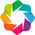

please write %output size=100" before calling this function


:Layout
   .Overlay.Cluster_info_colon_primary_clust_plus_outlier_plus_secondary_clust_for_homologies :Overlay
      .Area.Outliers  :Area   [homologies]   (props,Baseline)
      .Area.Primary   :Area   [homologies]   (props,Baseline)
      .Area.Secondary :Area   [homologies]   (props,Baseline)
   .Overlay.I                                                                                 :Overlay
      .Area.Outliers  :Area   [homologies]   (props)
      .Area.Primary   :Area   [homologies]   (props)
      .Area.Secondary :Area   [homologies]   (props)
   .Overlay.Cluster_info_colon_primary_clust_plus_outlier_plus_secondary_clust_for_species    :Overlay
      .Area.Outliers  :Area   [species]   (props,Baseline)
      .Area.Primary   :Area   [species]   (props,Baseline)
      .Area.Secondary :Area   [species]   (props,Baseline)
   .Overlay.II                                                                                :Overlay
      .Area.Outliers  :Area   [species]   (props)
      .Area.Primary   :Area   [species]   (props)
      .Area.Secondary :Area   [species]   (props)

In [60]:
%output size=100
cub.all_homoset.get_clusterstats(sort=True, redo=True)

beware, species_namelist does not represent speciesdict/loadhashomo/loadfullhomo/etc
just do homoset.species_namelist = cub.speciesdict().values() to retrieve the correspondance


PyCUB/homoset.py:874: RuntimeWarning: invalid value encountered in divide
  specluster = np.divide(specluster.T, specluster.sum(1)).T



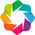

please write %output size=100" before calling this function


:Layout
   .Overlay.Cluster_info_colon_primary_clust_plus_outlier_plus_secondary_clust_for_homologies :Overlay
      .Area.Outliers  :Area   [homologies]   (props,Baseline)
      .Area.Primary   :Area   [homologies]   (props,Baseline)
      .Area.Secondary :Area   [homologies]   (props,Baseline)
   .Overlay.I                                                                                 :Overlay
      .Area.Outliers  :Area   [homologies]   (props)
      .Area.Primary   :Area   [homologies]   (props)
      .Area.Secondary :Area   [homologies]   (props)
   .Overlay.Cluster_info_colon_primary_clust_plus_outlier_plus_secondary_clust_for_species    :Overlay
      .Area.Outliers  :Area   [species]   (props,Baseline)
      .Area.Primary   :Area   [species]   (props,Baseline)
      .Area.Secondary :Area   [species]   (props,Baseline)
   .Overlay.II                                                                                :Overlay
      .Area.Outliers  :Area   [species]   (props)
      .Area.Primary   :Area   [species]   (props)
      .Area.Secondary :Area   [species]   (props)

In [61]:
%output size=100
cub.working_homoset.get_clusterstats(sort=True, redo=True)

Here we can see that amongst the outlier species we have only species in very few homologies except for __hepatospora_eriocheir__ which is present in ~700 and still present such CUB behavior.

In [90]:
for i in [0,1,2,3,4,514,515,516,517,518,519]:
    print cub.species[cub.all_homoset.species_namelist[i]].name
    print "----"
    print cub.species[cub.all_homoset.species_namelist[i]].genome_size
    print "----"
    print cub.species[cub.all_homoset.species_namelist[i]].metadata.values()
    print "----"
    print cub.species[cub.all_homoset.species_namelist[i]].average_entropy
    print "----"
    print cub.species[cub.all_homoset.species_namelist[i]].average_size
    print "----"
    print cub.species[cub.all_homoset.species_namelist[i]].meanGChomo
    print "----"
    print cub.species[cub.all_homoset.species_namelist[i]].tot_homologies
    print "----"
    print cub.species[cub.all_homoset.species_namelist[i]].meanecai
    print "----"

pichia_kudriavzevii
----
12940563
----
[False, False, False, False, False]
----
[ 10.23504568  11.03621614   5.81492127   2.17585854   0.64209774
   6.95495348  12.32403074   7.99365213   1.68277675  18.14734497
  37.82249894  13.78025557   4.55352177   6.68235779  10.1744204
   8.42901619   5.44227953  14.5561288 ]
----
935.1
----
0.417403998516
----
10
----
None
----
calocera_viscosa_tufc12733
----
71515325
----
[False, False, False, False, False]
----
[  4.47988631   9.21725799   2.89547532   1.11071367   1.05665087
   3.80566443   6.32414114   5.64791979   0.90528206  14.79078551
  25.82603781  10.02809042   7.11255602   2.73312747   7.40466002
   5.06231873   2.25621244  12.20486525]
----
820.75
----
0.464930805223
----
12
----
None
----
sistotremastrum_suecicum_hhb10207_ss_3
----
33857913
----
[False, False, False, True, False]
----
[  4.30016516   4.56501529   0.44998063   0.51591951   0.66246668
   1.52246399   0.83294061   2.94811355   0.72659411   8.3848407
  15.32889446   1.

In [ ]:
for i in [864,764,989,1107,1179,1227,1257,1527]:
    cub.all_

In [ ]:
for i in [0,1,200,300,400,450,600]:

In [ ]:
for i in [5340,5460,5540,5560,5600,5650]:

In [52]:
cub.all_homoset.compare_clusters(cubdistance_matrix=True, plot=True, size=40)

KeyboardInterrupt: 

In [ ]:
cub.save("processed_test")

In [ ]:
cub.all_homoset[2].plot('tsne', D=2,interactive=True)

In [ ]:
cub.all_homoset[2].plot('tsne', D=2,interactive=True)

In [ ]:
cub.all_homoset[2].plot('tsne', D=2,interactive=True)

In [ ]:
cub.all_homoset[2].plot('tsne', D=2,interactive=True)

In [ ]:
cub.get_subset(homoset = cub.all_homoset, withcopy=True, clusternb=None, species=None,
               homologies=cub.all_homoset.homo_namelist[700:706]).plot_all(With='tsne', perplexity=60,
                                         interactive=True, iteration=300)

In [ ]:
cub.get_subset(homoset = cub.all_homoset, withcopy=True, clusternb=None, species=None,
               homologies=cub.all_homoset.homo_namelist[700:706]).plot_all(With='tsne', perplexity=60,
                                         interactive=True, iteration=300)

In [ ]:
cub.get_subset(homoset = cub.all_homoset, withcopy=True, clusternb=None, species=None,
               homologies=cub.all_homoset.homo_namelist[700:706]).plot_all(With='tsne', perplexity=60,
                                         interactive=True, iteration=300)

In [ ]:
cub.get_subset(homoset = cub.all_homoset, withcopy=True, clusternb=None, species=None,
               homologies=cub.all_homoset.homo_namelist[700:706]).plot_all(With='tsne', perplexity=60,
                                         interactive=True, iteration=300)

In [ ]:
cub.get_full_genomes(kingdom='fungi', seq='cds', avg=False, by="entropy", normalized=False)

In [ ]:
cub.save("processed_test")

In [ ]:
print cub.species[cub.species.keys()[0]]

In [ ]:
cub.compare_species(showvar=True, to='full')

In [ ]:
cub.compare_homologies(homoset, homosapiens=False, mindistance=10, preserved=True, size=10,
                           minpreserv=0.9, minsimi=0.9, showvar=True, eps=0.48):

In [ ]:
cub.regress_on_genes(compare="full", 
                     without=['meancai'], algo="lasso", eps=0.001, n_alphas=100)

In [ ]:
cub.save("processed_test")

In [ ]:
cub.all_homoset.compute_entropyloc(using='computejerem')

In [ ]:
cub.save("processed_test")

In [ ]:
cub.getRelation2G3DD(bins=10)